**<h1 align="center">Data Mining Project</h1>**

**Group members:**<br> 
Chloé Deschanel - 20240693 <br>
Diogo Carvalho - 20240694 <br>
Ingrid Lopez - 20240692 <br>
Ruben Marques- 20240352

# Table of Contents
* [1. Data Exploration](#chapter1)
    * [1.1. Imports](#sub-section-1_1)
    * [1.2. Loading Data](#sub-section-1_2)
    * [1.3. Initial Analysis](#sub-section-1_3)
        * [1.3.1. Types](#sub-section-1_3_1)
        * [1.3.2. Duplicates](#sub-section-1_3_2)
        * [1.3.3. Missing Values](#sub-section-1_3_3)
        * [1.3.4. Data Statistics](#sub-section-1_3_4)
    * [1.4. Individual Variable Analysis](#sub-section-1_4)
        * [1.4.1. Numerical Variables](#sub-section-1_4_1)
            * [1.4.1.1. Overview](#sub-section-1_4_1_1)
            * [1.4.1.2. customer_age](#sub-section-1_4_1_2)
            * [1.4.1.3. vendor_count](#sub-section-1_4_1_3)
            * [1.4.1.4. product_count](#sub-section-1_4_1_4)
            * [1.4.1.5. is_chain](#sub-section-1_4_1_5)
            * [1.4.1.6. first_order & last_order](#sub-section-1_4_1_6)
            * [1.4.1.7. CUI_American to CUI_Thai](#sub-section-1_4_1_7)
            * [1.4.1.8. DOW_0 to DOW_6](#sub-section-1_4_1_8)
            * [1.4.1.9. HR_0 to HR_1](#sub-section-1_4_1_9)
        * [1.4.2. Categorical Variables](#sub-section-1_4_2)
            * [1.4.2.1. customer_region](#sub-section-1_4_2_1)
            * [1.4.2.2. last_promo](#sub-section-1_4_2_2)
            * [1.4.2.3. payment_method](#sub-section-1_4_2_3)
    * [1.5. Multivariate Analysis](#sub-section-1_5)     
        * [1.5.1. payment_method & product_count](#sub-section-1_5_1) 
        * [1.5.2. city & last_promo/ payment_method](#sub-section-1_5_2)
        * [1.5.3. vendor_diversity & customer_age/ product_count](#sub-section-1_5_3)
        * [1.5.4. top_cuisine & city](#sub-section-1_5_4)
        * [1.5.5. Spending Habits and Order Behavior](#sub-section-1_5_5)
        * [1.5.6. Promotion Usage and Spending Patterns](#sub-section-1_5_6)
        * [1.5.7. Payment Method Preferences by Spending and Promotion Usage](#sub-section-1_5_7)
        * [1.5.9. Week period and time of day](#sub-section-1_5_9)
        * [1.5.10. Spending habits in cities & in top cuisines](#sub-section-1_5_10)
* [2. Data Preprocessing](#chapter2)
    * [2.1. Coherence Fix](#sub-section-2_1)
    * [2.2. Feature Engeneering](#sub-section-2_2)
        * [2.2.1. Features from EDA](#sub-section-2_2_1)
        * [2.2.2. Creating New Features](#sub-section-2_2_2)
        * [2.2.3. Visually Exploring Newly Created Features](#sub-section-2_2_3)
        * [2.2.4. Dropping Variables](#sub-section-2_2_4)
    * [2.3. Missing Values](#sub-section-2_3)
        * [2.3.1. customer_age](#sub-section-2_3_1)
        * [2.3.2. first_order](#sub-section-2_3_2)
        * [2.3.3. active_period](#sub-section-2_3_3)
        * [2.3.4. order_frequency](#sub-section-2_3_4)
    * [2.4. Outliers](#sub-section-2_4)
        * [2.4.1. IQR Method](#sub-section-2_4_1)
        * [2.4.2. Manual Threshold](#sub-section-2_4_2)
        * [2.4.3. Clipping Outliers](#sub-section-2_4_3)
    * [2.5. Data Normalization](#sub-section-2_5)
        * [2.5.1. MinMax Scaling](#sub-section-2_5_1)
        * [2.5.2. Standard Scaling](#sub-section-2_5_2)
        * [2.5.3. Comparing MinMax and Standard Scaling](#sub-section-2_5_3)
* [3. Segmentation](#chapter3)
    * [3.1. RFM Value Segmentation](#sub-section-3_1)

Feedback 
- Introduction of the report itself and what is expected (use academic research)
    - Emphasis on clustering (not segmentation)
- Conclusion - include insights (1 or 2)
- age & orders in the week... explore more in depth relationships
- is_chain - anomaly
- Explore new features created: outliers, normally distributed, insights, anomalies, missing values?
    - point of the new features & perform EDA on them
    - what are we trying to find?
    - aggregations, ratios,...
- Heatmaps - use divergent palettes
- Boxplots - ensure use different scales if features have different units

intro 
- write last
- what is the objective? data exploration, optionally: EDA is motivated by clustering/ segmentation as the next phase
- what did the project achieve? 1 or 2 key insights

Initial analysis
- statistical analysis
- supported by visualisations
- check results of df.describe()
    - any interesting statistics that stand out?
    - check both number and non numeric features

Anomalies
- missing values: missing completely at random?
- inconsistent values: posiible reasons/ explanations?
- duplicates: are these likely duplicated records or valid?
- are there pattrens to the anomalies?
- outliers: are these liekly to be extreme values? or data entry errors?
- are the quantities something to be concerned about? if drop all anomilies, how much data will be lost?

Relationships, patterns & trends 
- supported by vusualisations

- correlation

- any interesting sub-populations

    - geographic regions: do ther have different behaviours?
    - what about age groyps?
- Draw 

Feature engineering
- aggregations (CUI, HR, DW)
- ratios (MNT/ X)
- proportions (% spent on weekdays)
- analysis of new features

Conclusion 
- 1 or 2 key insights
- connect to next phase (segmentation)
    - any features

<a class="anchor" id="chapter1"></a>

# 1. Data Exploration

</a>

<a class="anchor" id="sub-section-1_1"></a>

## 1.1. Imports

</a>

In [576]:
import sqlite3
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mpl_colors
import seaborn as sns
from math import ceil

# Pre-processing
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder

# Radar Chart
from math import pi

from minisom import MiniSom

from sklearn.cluster import KMeans, AgglomerativeClustering

from sklearn.metrics import silhouette_score, silhouette_samples
from scipy.cluster.hierarchy import dendrogram, linkage

# Import functions created from .py file 
import functions as f
import importlib
importlib.reload(f) # For reloading after making changes

# For better resolution plots
%config InlineBackend.figure_format = 'retina'

<a class="anchor" id="sub-section-1_2"></a>

## 1.2. Loading Data

</a>

In [577]:
customers = pd.read_csv("../Data/DM2425_ABCDEats_DATASET.csv")

In [578]:
# Display all columns
pd.set_option('display.max_columns', None)
customers.head()

,customer_id,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
0,1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
1,5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
2,f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
3,180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4,4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


| #   | Column Name        | Description                                                                                       |
|:----|:-------------------|:--------------------------------------------------------------------------------------------------|
| 1   | customer_id        | Unique identifier for each customer.                                                             |
| 2   | customer_region    | Geographic region where the customer is located.                                                 |
| 3   | customer_age       | Age of the customer.                                                                             |
| 4   | vendor_count       | Number of unique vendors the customer has ordered from.                                          |
| 5   | product_count      | Total number of products the customer has ordered.                                               |
| 6   | is_chain           | Indicates whether the customer’s order was from a chain restaurant.                              |
| 7   | first_order        | Number of days from the start of the dataset when the customer first placed an order.            |
| 8   | last_order         | Number of days from the start of the dataset when the customer most recently placed an order.     |
| 9   | last_promo         | The category of the promotion or discount most recently used by the customer.                    |
| 10  | payment_method     | Method most recently used by the customer to pay for their orders.                               |
| 11  | CUI_American, etc. | The amount in monetary units spent by the customer from the indicated type of cuisine.           |
| 12  | DOW_0 to DOW_6     | Number of orders placed on each day of the week (0 = Sunday, 6 = Saturday).                       |
| 13  | HR_0 to HR_23      | Number of orders placed during each hour of the day (0 = midnight, 23 = 11 PM).                  |

In [579]:
# Set customer_id as the index
customers.set_index('customer_id', inplace = True)
customers.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,18.0,2,5,1,0.0,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0
5d272b9dcb,8670,17.0,2,2,2,0.0,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
f6d1b2ba63,4660,38.0,1,2,2,0.0,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0
180c632ed8,4660,NaN,2,3,1,0.0,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0
4eb37a6705,4660,20.0,2,5,0,0.0,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


<a class="anchor" id="sub-section-1_3">

## 1.3. Initial Analysis
    
</a>

<a class="anchor" id="sub-section-1_3_1">

### 1.3.1. Types
    
</a>

In [580]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
Index: 31888 entries, 1b8f824d5e to fd40d3b0e0
Data columns (total 55 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_region           31888 non-null  object 
 1   customer_age              31161 non-null  float64
 2   vendor_count              31888 non-null  int64  
 3   product_count             31888 non-null  int64  
 4   is_chain                  31888 non-null  int64  
 5   first_order               31782 non-null  float64
 6   last_order                31888 non-null  int64  
 7   last_promo                31888 non-null  object 
 8   payment_method            31888 non-null  object 
 9   CUI_American              31888 non-null  float64
 10  CUI_Asian                 31888 non-null  float64
 11  CUI_Beverages             31888 non-null  float64
 12  CUI_Cafe                  31888 non-null  float64
 13  CUI_Chicken Dishes        31888 non-null  float64
 1

<a class="anchor" id="sub-section-1_3_2">

### 1.3.2. Duplicates
    
</a>

In [581]:
# Check for duplicate customer_id
customers[customers.index.duplicated() == True]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
b55012ee1c,8550,23.0,4,11,1,2.0,89,FREEBIE,CARD,0.00,93.43,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,3,2,3,1,1,0,0,0.0,0,0,10,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
24251eb7da,8550,28.0,4,8,3,7.0,85,-,CARD,30.44,18.54,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,32.27,0.0,1,0,3,0,0,0,1,0.0,1,1,0,0,1,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0
671bf0c738,8550,25.0,4,7,3,23.0,66,FREEBIE,CARD,56.18,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,30.53,0.0,0,1,1,1,0,1,0,0.0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,1,0,1,0,0,0,0
742ca068fc,8550,20.0,1,2,0,35.0,35,-,CARD,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,31.57,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
df91183978,8550,23.0,2,3,1,47.0,52,DELIVERY,CARD,0.00,18.78,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,17.34,0.0,0,0,1,0,1,0,0,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6bbf5f74cd,8550,22.0,10,20,9,48.0,88,-,CARD,62.17,64.37,44.87,0.0,0.0,0.0,0.0,0.0,0.0,0.0,18.18,0.0,0.0,0.00,0.0,1,2,1,5,0,5,2,0.0,0,0,5,1,1,2,3,2,0,0,0,0,2,0,0,0,0,0,0,0,0,0,0
8aa9bbc147,8550,24.0,2,4,2,53.0,59,DELIVERY,DIGI,0.00,18.80,30.13,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0,0,1,1,0,0,0,0.0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
cf563a0a98,8550,27.0,2,2,0,61.0,62,FREEBIE,CASH,0.00,25.41,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0,0,0,0,1,1,0,NaN,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
201a13a34d,8550,28.0,2,2,1,62.0,62,DELIVERY,CARD,17.71,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.00,0.0,0,0,0,0,0,2,0,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1


In [582]:
# Check how many duplicates customer_id's have
duplicates = customers.index.value_counts()
duplicate_count = duplicates[duplicates > 1]

print(f"Duplicate customer IDs and their counts:\n{duplicate_count}")

Duplicate customer IDs and their counts:
customer_id
742ca068fc    2
b55012ee1c    2
df91183978    2
6bbf5f74cd    2
24251eb7da    2
201a13a34d    2
b8e7a643a4    2
cc08ef25ce    2
8aa9bbc147    2
671bf0c738    2
06018a56be    2
fac7984c0d    2
cf563a0a98    2
Name: count, dtype: int64


In [583]:
# Remove the 13 customer_id duplicates and keep the 1st instance
customers = customers[~customers.index.duplicated(keep = 'first')]

<a class="anchor" id="sub-section-1_3_3">

### 1.3.2. Missing Values
    
</a>

In [584]:
# Check the number of missing values
customers.isna().sum()

customer_region                0
customer_age                 727
vendor_count                   0
product_count                  0
is_chain                       0
first_order                  106
last_order                     0
last_promo                     0
payment_method                 0
CUI_American                   0
CUI_Asian                      0
CUI_Beverages                  0
CUI_Cafe                       0
CUI_Chicken Dishes             0
CUI_Chinese                    0
CUI_Desserts                   0
CUI_Healthy                    0
CUI_Indian                     0
CUI_Italian                    0
CUI_Japanese                   0
CUI_Noodle Dishes              0
CUI_OTHER                      0
CUI_Street Food / Snacks       0
CUI_Thai                       0
DOW_0                          0
DOW_1                          0
DOW_2                          0
DOW_3                          0
DOW_4                          0
DOW_5                          0
DOW_6     

<a class="anchor" id="sub-section-1_3_4">

### 1.3.4. Data Statistics 
    
</a>

In [585]:
# Seperate numerical and categorical data
customers_num = customers.select_dtypes(exclude = object)
customers_cat = customers.select_dtypes(include = object)

In [586]:
# Summary statistics of numerical data
customers_num.describe().round(2).T

,count,mean,std,min,25%,50%,75%,max
customer_age,31148.0,27.51,7.16,15.0,23.0,26.0,31.00,80.00
vendor_count,31875.0,3.10,2.77,0.0,1.0,2.0,4.00,41.00
product_count,31875.0,5.67,6.96,0.0,2.0,3.0,7.00,269.00
is_chain,31875.0,2.82,3.98,0.0,1.0,2.0,3.00,83.00
first_order,31769.0,28.47,24.10,0.0,7.0,22.0,45.00,90.00
last_order,31875.0,63.67,23.23,0.0,49.0,70.0,83.00,90.00
CUI_American,31875.0,4.88,11.65,0.0,0.0,0.0,5.66,280.21
CUI_Asian,31875.0,9.96,23.56,0.0,0.0,0.0,11.83,896.71
CUI_Beverages,31875.0,2.30,8.48,0.0,0.0,0.0,0.00,229.22
CUI_Cafe,31875.0,0.80,6.43,0.0,0.0,0.0,0.00,326.10


In [587]:
# Summary statistics of categorical data
customers_cat.describe().T

,count,unique,top,freq
customer_region,31875,9,8670,9761
last_promo,31875,4,-,16744
payment_method,31875,3,CARD,20153


The initial analysis provides insights into the structure of the data set and key characteristics. 
- Most variables are numerical, either int64 or float64.
- There are 13 duplicates in customer_id. These duplicates have been deleted.
- Only 3 variables contain missing values: customer_age, is_chain, and HR_0.

<a class="anchor" id="sub-section-1_4">

## 1.4. Individual Variable Analysis
    
</a>

In [588]:
# Create a copy of original data frame to visually explore, without modifying the original
customers_eda = customers.copy()

<a class="anchor" id="sub-section-1_4_1">

### 1.4.1. Numerical Variables
    
</a>

<a class="anchor" id="sub-section-1_4_1_1">

#### 1.4.1.1. Overview
    
</a>

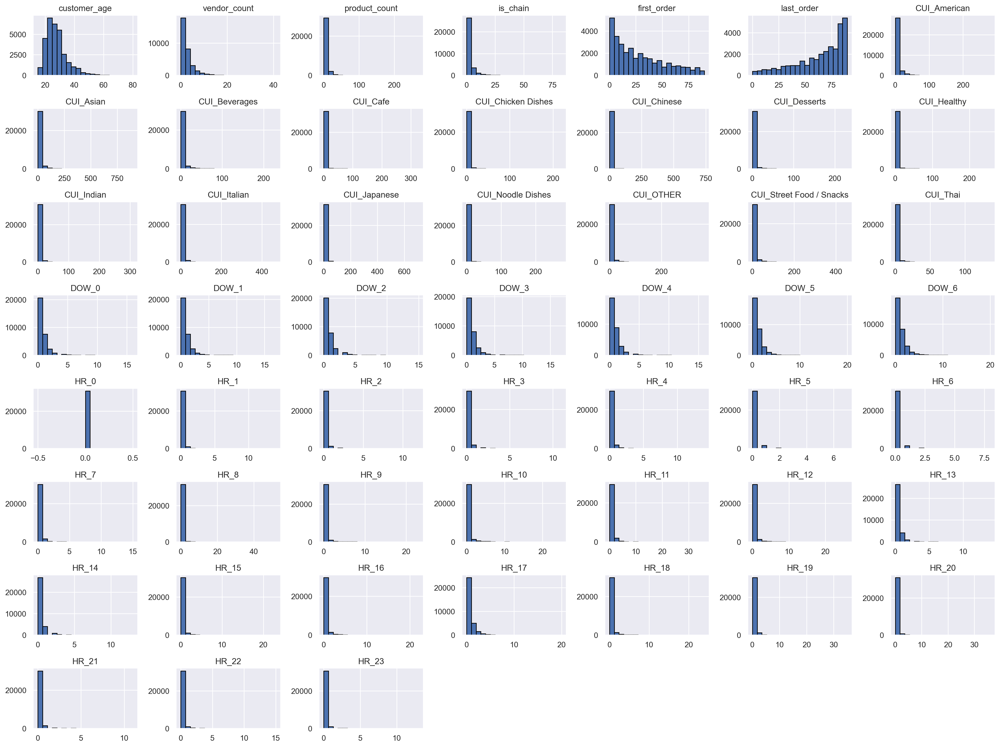

In [589]:
# Select numeric columns from the dataset
numeric_columns = customers_eda.select_dtypes(include=["float64", "int64"]).columns

# Plot histograms for all numeric columns
sns.set()
customers_eda[numeric_columns].hist(bins=20, figsize=(20, 15), edgecolor="black")
plt.tight_layout()
plt.show()

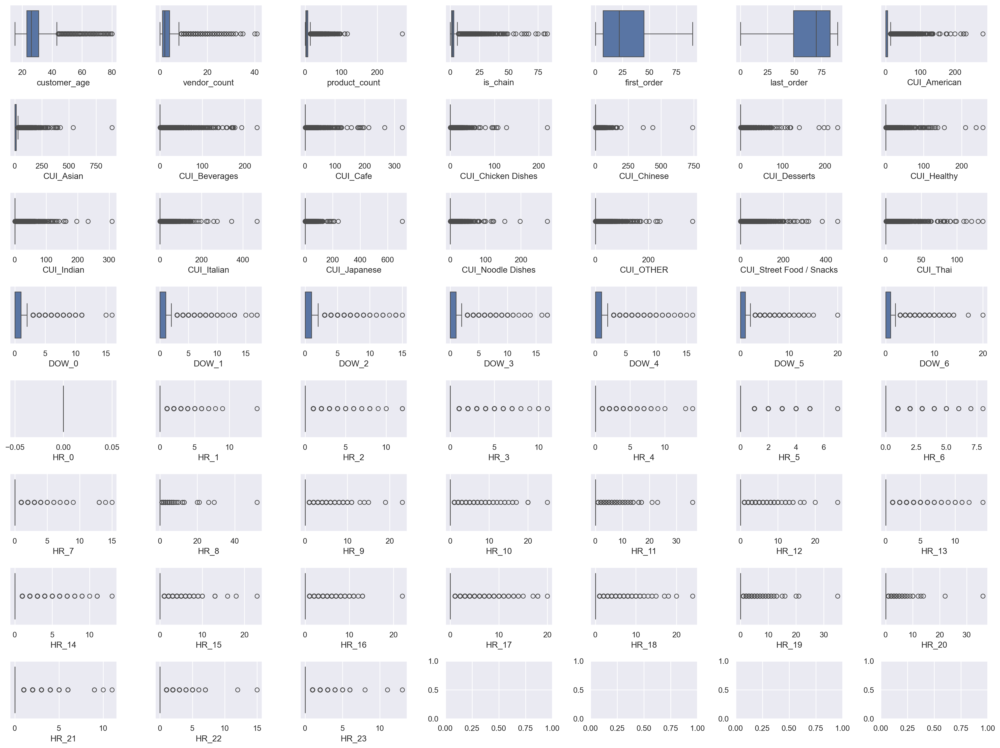

In [590]:
# Plot box plots for all numeric columns

sns.set()
fig, axes = plt.subplots(8, 7, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), numeric_columns): 
    sns.boxplot(x=customers_eda[feat], ax=ax)

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_4_1_2">

#### 1.4.1.2. customer_age
    
</a>

In [591]:
age_median = round(customers_eda["customer_age"].median(), 2)
age_mean = round(customers_eda["customer_age"].mean(), 2)
print(f"The customer_age mean ({age_mean}) and median ({age_median}) "
      f"indicate that clients are generally in their mid-20s.")
print(f"The oldest customer is {customers_eda['customer_age'].max()} years old, "
      f"and the youngest is {customers_eda['customer_age'].min()} years old.")

The customer_age mean (27.51) and median (26.0) indicate that clients are generally in their mid-20s.
The oldest customer is 80.0 years old, and the youngest is 15.0 years old.


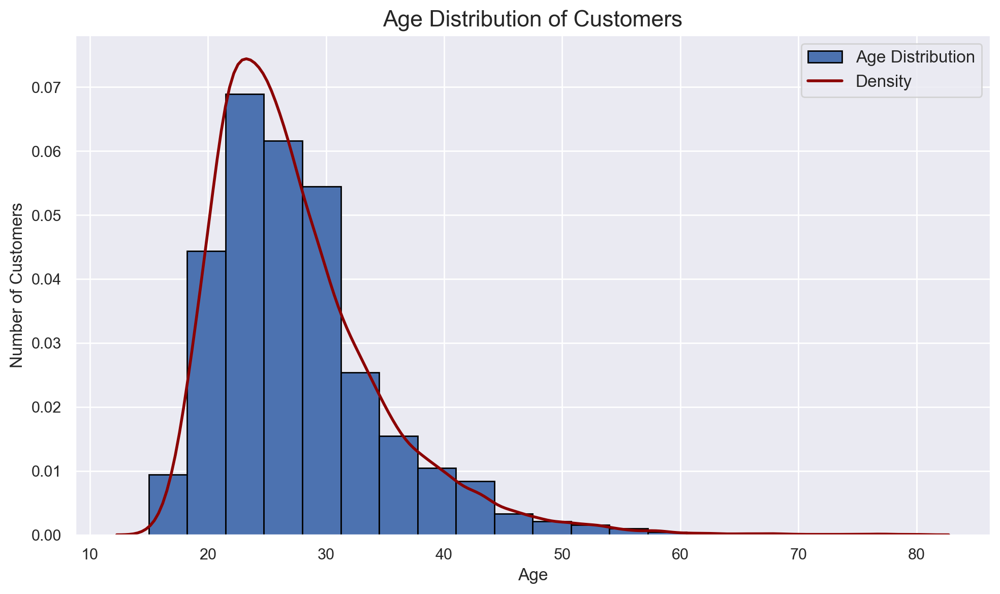

In [592]:
# Plot the histogram & density for customer_age
sns.set()
plt.figure(figsize=(10, 6))
plt.hist(customers_eda["customer_age"], bins=20, edgecolor="black", density=True, label="Age Distribution")
sns.kdeplot(customers_eda["customer_age"], color="darkred", label="Density", linewidth=2)

plt.title("Age Distribution of Customers", fontsize=16)
plt.xlabel("Age", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

plt.legend(loc="upper right", fontsize=12)
plt.tight_layout()  
plt.show()

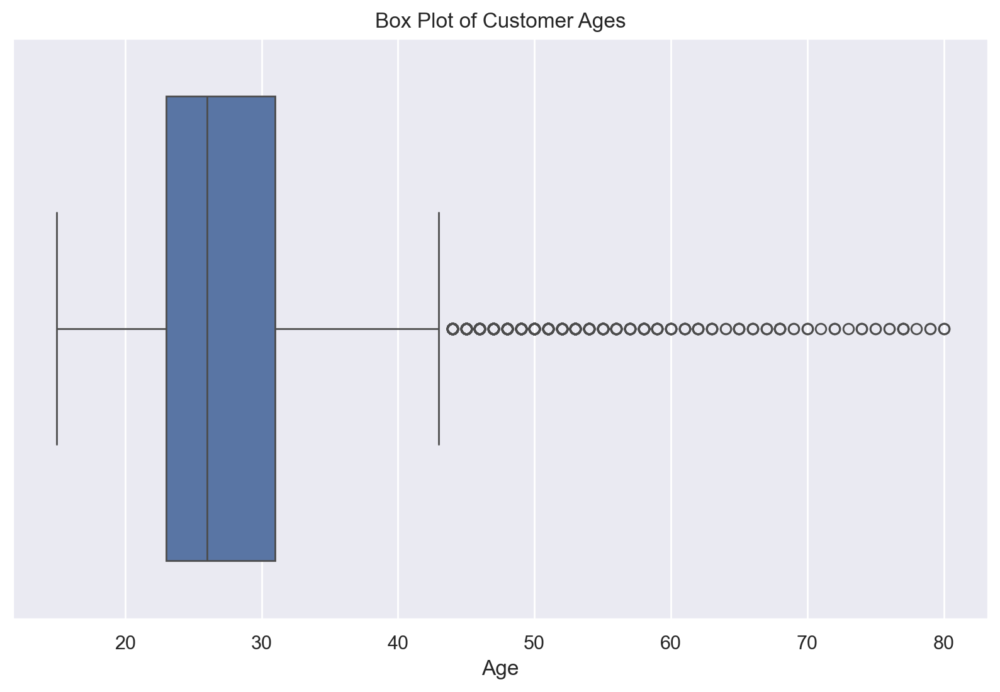

In [593]:
plt.figure(figsize=(10, 6))

sns.boxplot(x=customers_eda['customer_age'])
plt.title("Box Plot of Customer Ages")
plt.xlabel("Age")
plt.show()

To get a clearer understanding of the age distribution, age groups can be created by categorizing into bins:
- Teenagers: 15–19 
- Young Adults: 20–29 
- Adults: 30–39 
- Middle-Aged: 40–49 
- Older Adults: 50–59 
- Seniors: 60+ 

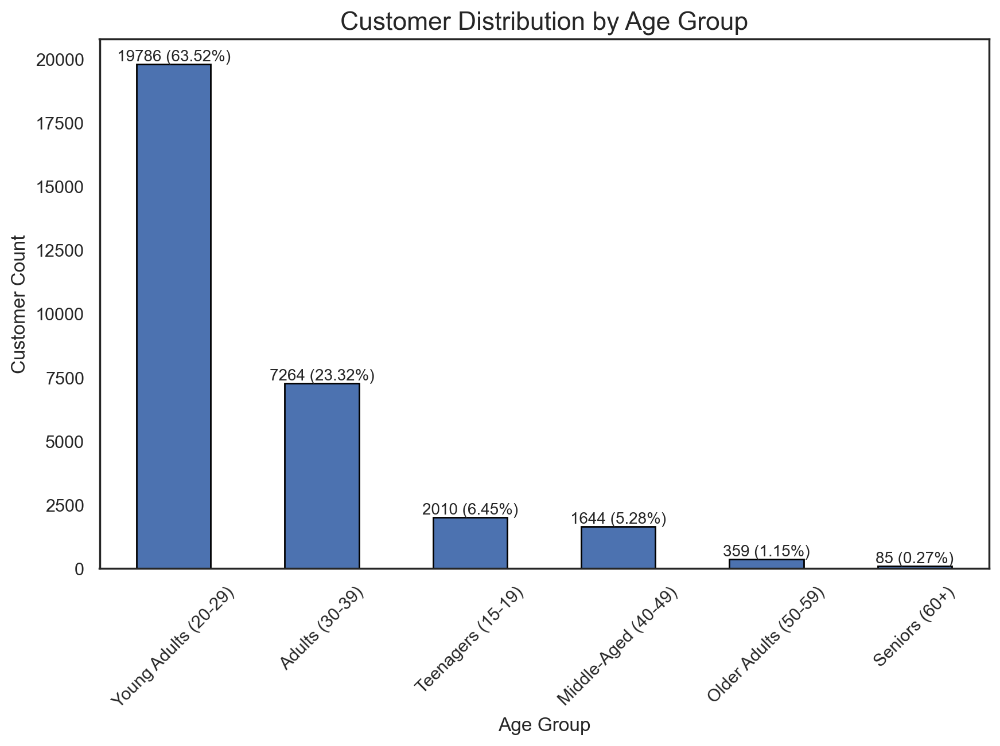

In [594]:
# Define age ranges and their respective labels
age_bins = [14, 19, 29, 39, 49, 59, 100]
age_labels = ["Teenagers (15-19)", "Young Adults (20-29)", "Adults (30-39)", 
              "Middle-Aged (40-49)", "Older Adults (50-59)", "Seniors (60+)"]

# .cut() segments into the bins (age_bins) and assigns to corresponding labels (age_labels)
customers_eda["age_group"] = pd.cut(customers_eda["customer_age"], bins=age_bins, labels=age_labels)
age_group_counts = customers_eda["age_group"].value_counts()
age_group_percent = customers_eda["age_group"].value_counts(normalize=True) * 100

sns.set_style("white")
plt.figure(figsize=(10, 6))

age_group_counts.plot(kind="bar", edgecolor="black")

# Add the count & percentage at the top of each bar 
for index, (count, percent) in enumerate(zip(age_group_counts, age_group_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customer Distribution by Age Group", fontsize=16)
plt.xlabel("Age Group", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=45)
plt.show()

<a class="anchor" id="sub-section-1_4_1_3">

#### 1.4.1.3. vendor_count
    
</a>

In [595]:
vendor_count_median = round(customers_eda["vendor_count"].median(), 2)
vendor_count_mean = round(customers_eda["vendor_count"].mean(), 2)
print(f"The vendor_count mean ({vendor_count_mean}) and median ({vendor_count_median}) "
      f"indicate that clients generally tend to order from a small amount of vendors.")
print(f"The vendor count ranges from a minimum of {customers_eda['vendor_count'].min()} "
      f"to a maximum of {customers_eda['vendor_count'].max()}.")

The vendor_count mean (3.1) and median (2.0) indicate that clients generally tend to order from a small amount of vendors.
The vendor count ranges from a minimum of 0 to a maximum of 41.


In [596]:
print(f"There are {len(customers_eda[customers_eda['vendor_count']==0])} rows with 0 vendor count, "
      f"which could indicate an error.")

There are 138 rows with 0 vendor count, which could indicate an error.


In [597]:
# These customers seem to just have default information from account creation 
# They can be targeted to make their first transaction
customers_eda[(customers_eda['vendor_count'] == 0) & (customers_eda['product_count'] == 0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39)
1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39)
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29)


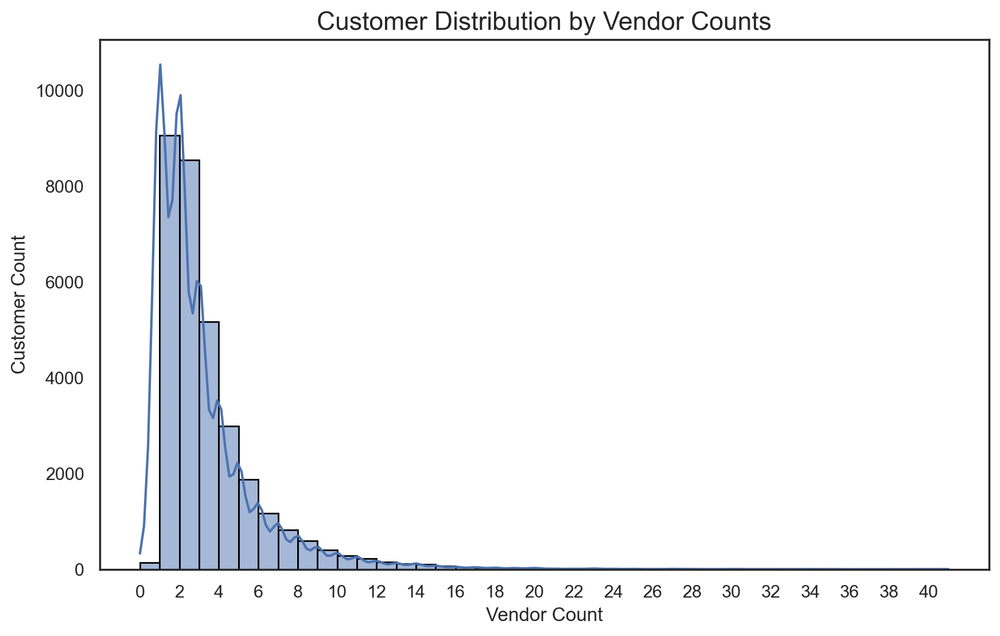

In [598]:
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Set kde to True to get the Kernel Density Estimate
# This shows the underlying distribution of the data
sns.histplot(customers_eda["vendor_count"], bins=41, kde=True, edgecolor="black")

plt.title("Customer Distribution by Vendor Counts", fontsize=16)
plt.xlabel("Vendor Count", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)

# create an array of tick positions starting from 0 to the max value of "vendor_count with intervals  of 2
tick_positions = np.arange(0, customers_eda["vendor_count"].max() + 1, 2)
plt.xticks(tick_positions)

plt.show()

As previously mentioned, customers have low vendor counts, with a large peak around 1-3 vendors. This could suggest that customers exhibit brand loyalty or preference for specific vendors. Additionally, a small group of customers order from a larger variety of vendors, suggesting a preference for exploration or diverse tastes. 

Thus, it possible to categorise customers based on their vendor count:
- No Diversity: 0 vendors
- Low Diversity: 1–2 vendors
- Moderate Diversity: 3–5 vendors
- High Diversity: 6 or more vendors

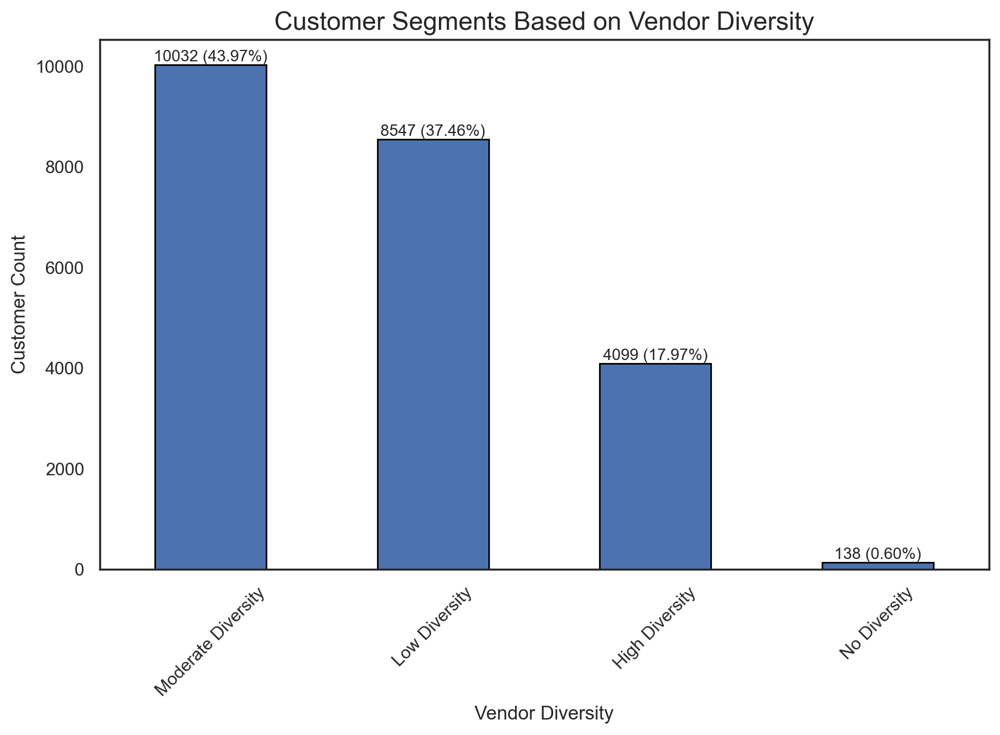

In [599]:
# Default all rows to No Diversity
customers_eda["vendor_diversity"] = "No Diversity"  # Default all to No Diversity

# pd.cut() segments into the bins (vendor_bins) and assigns to corresponding labels (vendor_labels)
# only apply for vendor_count > 0
mask = customers_eda["vendor_count"] > 0
vendor_bins = [1, 2, 5, customers_eda["vendor_count"].max() + 1] # +1 to include the last value
vendor_labels = ["Low Diversity", "Moderate Diversity", "High Diversity"]

customers_eda.loc[mask, "vendor_diversity"] = pd.cut(customers_eda.loc[mask, "vendor_count"], bins=vendor_bins, labels=vendor_labels)
diversity_counts = customers_eda["vendor_diversity"].value_counts()
diversity_percent = customers_eda["vendor_diversity"].value_counts(normalize=True) * 100

sns.set_style("white")
plt.figure(figsize=(10, 6))
diversity_counts.plot(kind="bar", edgecolor="black")

# Add the count & percentage at the top of each bar 
for index, (count, percent) in enumerate(zip(diversity_counts, diversity_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customer Segments Based on Vendor Diversity", fontsize=16)
plt.xlabel("Vendor Diversity", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=45)

plt.show()

<a class="anchor" id="sub-section-1_4_1_4">

#### 1.4.1.4. product_count
    
</a>

In [600]:
product_count_median = round(customers_eda["product_count"].median(), 2)
product_count_mean = round(customers_eda["product_count"].mean(), 2)
print(f"The product_count mean ({product_count_mean}) and median ({product_count_median}) "
      f"indicate that clients generally tend to purchase a modest number of products.")
print(f"The product count ranges from a minimum of {customers_eda['product_count'].min()} "
      f"to a maximum of {customers_eda['product_count'].max()}.")

The product_count mean (5.67) and median (3.0) indicate that clients generally tend to purchase a modest number of products.
The product count ranges from a minimum of 0 to a maximum of 269.


In [601]:
print(f"There are {len(customers_eda[customers_eda['product_count']==0])} rows with 0 product count, "
      f"which could indicate an error.")

There are 156 rows with 0 product count, which could indicate an error.


In [602]:
print(f"There are {len(customers_eda[(customers_eda['product_count']==0) & (customers_eda['vendor_count']>0)])} rows with product count 0 but vendor count above 0.")
customers_eda[(customers_eda['product_count']==0) & (customers_eda['vendor_count']>0)]

There are 18 rows with product count 0 but vendor count above 0.


,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
aed85972bb,4660,27.0,1,0,0,6.0,6,DISCOUNT,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.56,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Young Adults (20-29),NaN
b2ebe2e6e0,4660,43.0,1,0,0,6.0,6,-,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,6.74,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Middle-Aged (40-49),NaN
6f723d9894,4660,36.0,1,0,0,13.0,13,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.77,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN
9d74f2ac81,4660,27.0,1,0,0,19.0,19,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,19.03,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Young Adults (20-29),NaN
27b7eed8fa,4660,35.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,4.94,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Adults (30-39),NaN
6c9e68b2e7,4660,22.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,22.24,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Young Adults (20-29),NaN
c0b330c4df,4660,27.0,1,0,0,23.0,23,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,14.42,0.0,0.0,0.00,0.0,0.0,0,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
68c4faeecb,4660,25.0,1,0,0,26.0,26,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,12.75,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29),NaN
48e8abd5bf,4660,34.0,1,0,0,33.0,33,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.52,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN


When product count is 0 and vendor count is superior to 0, vendor count is always 1. Notably, hese customers seem to all be in the same region (4660).  This suggest an error, and product count should at least be 1, as we can see that customers have spent some money in certain cuisines. Additionally, when the 18 cases are substracted from the 156 ones, there are 138 cases left, similarly to vendor count (i.e. profile created but no activity). This must be dealt with later. 

In [603]:
print(f"As the mean is {product_count_mean}, and the standard deviation is "
      f"{round(customers_eda['product_count'].std(), 2)}, having a maximum value of "
      f"{customers_eda['product_count'].max()} appears to be an outlier, as it significantly "
      f"deviate from the typical range of values.")

As the mean is 5.67, and the standard deviation is 6.96, having a maximum value of 269 appears to be an outlier, as it significantly deviate from the typical range of values.


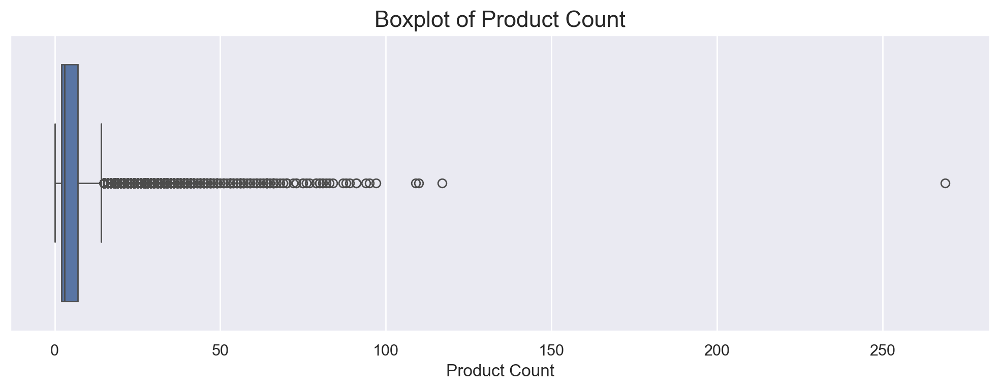

In [604]:
# Create a boxplot for product_count to visualize the distribution and outliers
sns.set()
plt.figure(figsize=(10, 4))
sns.boxplot(x=customers_eda['product_count'], vert=False)

plt.title('Boxplot of Product Count', fontsize=16)
plt.xlabel('Product Count', fontsize=12)

plt.tight_layout()
plt.show()

In [605]:
# Get all customers that have ordered above 100 products
possible_outliers = customers_eda["product_count"][customers_eda["product_count"]>100]

print(possible_outliers)
print(f"There are {possible_outliers.count()} possible outliers, if assumed that a customer "
      f"doesn't order above 100 products")

customer_id
89b7866691    110
910e70571d    117
92ced2dcb9    269
d798652ec0    109
Name: product_count, dtype: int64
There are 4 possible outliers, if assumed that a customer doesn't order above 100 products


In [606]:
customers_eda[customers_eda["product_count"]>100]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
89b7866691,2360,20.0,41,110,73,0.0,88,DELIVERY,DIGI,33.25,0.00,46.60,4.74,12.06,6.08,10.19,13.97,0.00,1.25,15.35,5.55,202.54,1.30,9.89,6,15,15,11,8,13,14,0.0,1,0,1,1,0,0,0,1,3,4,0,0,1,5,16,22,8,6,4,4,1,1,3,Young Adults (20-29),High Diversity
910e70571d,4660,41.0,18,117,26,0.0,88,-,CARD,104.95,14.44,0.00,21.70,0.00,0.00,0.00,7.71,28.13,109.05,0.00,0.00,243.18,0.00,59.20,11,13,14,17,11,12,12,0.0,0,0,0,0,0,0,0,0,1,4,21,9,4,1,1,6,9,24,10,0,0,0,0,Middle-Aged (40-49),High Diversity
92ced2dcb9,2360,23.0,40,269,81,0.0,88,-,CARD,19.08,70.01,37.92,18.30,0.00,739.73,0.00,0.00,0.00,20.11,84.05,197.84,109.31,12.34,109.64,15,17,14,10,9,9,20,0.0,0,0,0,0,0,0,0,0,1,3,9,12,3,4,3,8,14,7,15,9,2,2,2,Young Adults (20-29),High Diversity
d798652ec0,2360,28.0,27,109,83,1.0,89,-,CARD,2.57,28.41,229.22,2.86,0.00,2.84,10.34,58.29,10.43,2.27,0.00,0.00,79.47,7.44,0.00,16,17,10,17,15,8,8,0.0,0,0,0,0,0,0,2,2,2,8,13,17,12,6,7,3,3,6,8,2,0,0,0,Young Adults (20-29),High Diversity


In [607]:
# Calculate Q1 (25th percentile) and Q3 (75th percentile)
Q1 = customers_eda["product_count"].quantile(0.25)
Q3 = customers_eda["product_count"].quantile(0.75)

# Calculate the IQR
IQR = Q3 - Q1

# Determine the upper outlier boundary
upper_bound = Q3 + 1.5 * IQR

print(f"Upper bound: {upper_bound}")

Upper bound: 14.5


Calculating the upper bound using the IQR provides a statistical threshold for detecting outliers. However, the upper bound of 14.5 may not be of real usage, as a count of 14.5 products per customer is fairly possible. The values around this threshold could still be considered typical rather than outliers.

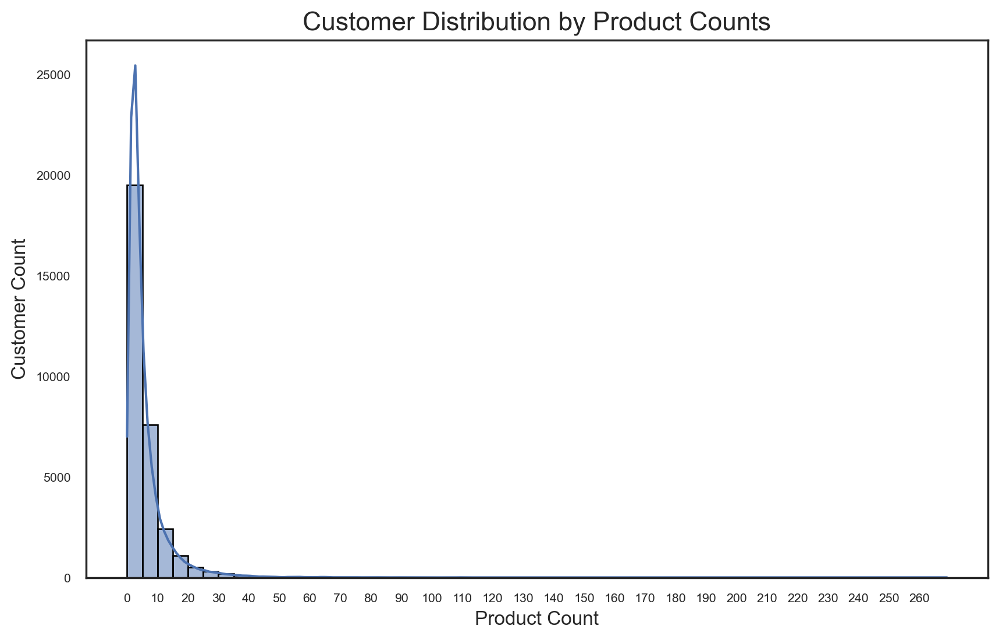

In [608]:
sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Arrange bins starting from 0 to the max value + 1 with intervals of 5
bin_edges2 = np.arange(0, customers_eda["product_count"].max() + 1, 5)
sns.histplot(customers_eda["product_count"], bins=bin_edges2, kde=True, edgecolor="black")

plt.title("Customer Distribution by Product Counts", fontsize=16)
plt.xlabel("Product Count", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)

# Set tick positions with increments of 10
tick_positions2 = np.arange(0, customers_eda["product_count"].max() + 1, 10)
plt.xticks(tick_positions2)

plt.show()

<a class="anchor" id="sub-section-1_4_1_5">

#### 1.4.1.5. is_chain
    
</a>

In [609]:
chain_value_median = round(customers_eda["is_chain"].median(), 2)
chain_value_mean = round(customers_eda["is_chain"].mean(), 2)
print(f"The is_chain mean is {chain_value_mean} and median is {chain_value_median}.\n"
      f"is_chain ranges from a minimum of {customers_eda['is_chain'].min()} to a maximum of {customers_eda['is_chain'].max()}.")

The is_chain mean is 2.82 and median is 2.0.
is_chain ranges from a minimum of 0 to a maximum of 83.


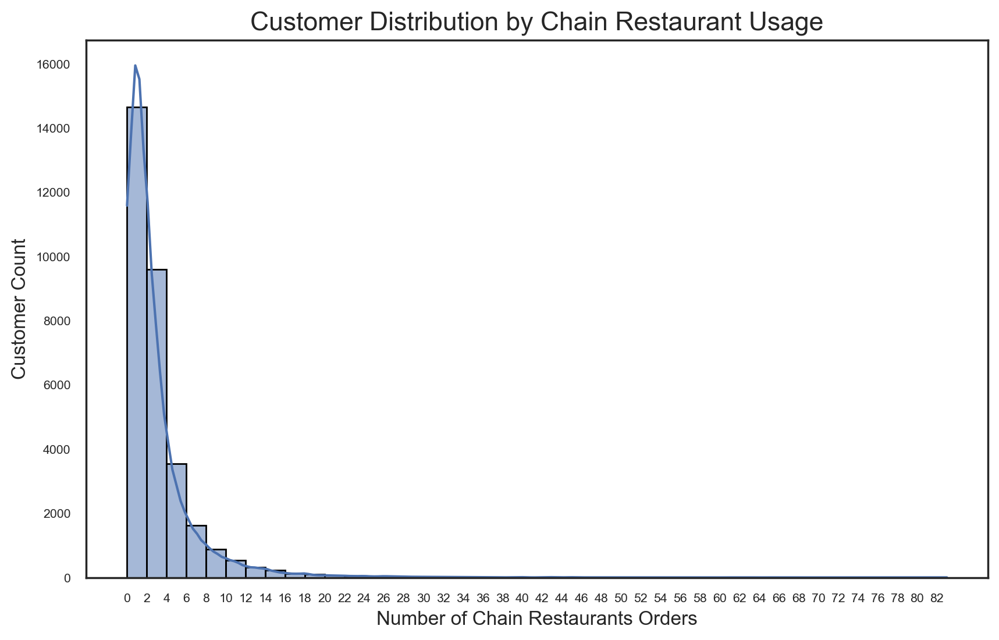

In [610]:
sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Arrange bins starting from 0 to the max value + 1 with intervals of 2
bin_edges3 = np.arange(0, customers_eda["is_chain"].max() + 1, 2)
sns.histplot(customers_eda["is_chain"], bins=bin_edges3, kde=True, edgecolor="black")

plt.title("Customer Distribution by Chain Restaurant Usage", fontsize=16)
plt.xlabel("Number of Chain Restaurants Orders", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)

# Set tick positions with increments of 2
tick_positions3 = np.arange(0, customers_eda["is_chain"].max() + 1, 2)
plt.xticks(tick_positions3)

plt.show()

CC: The is_chain variable represents the frequency of orders from chain restaurants by customers. However, its value alone provides limited insight without knowing each customer’s total number of orders. Calculating the total order count would allow for a better understanding of whether customers tend to favor chain restaurant or not.

<a class="anchor" id="sub-section-1_4_1_6">

#### 1.4.1.6. first_order & last_order
    
</a>

A distribution over a 90-day period, without knowing the specific timeframe, can only serve as a relative measure. This variable reflects customer retention rather than engagement; a large gap between a customer’s first and last order likely indicates recurring use of the service over time.

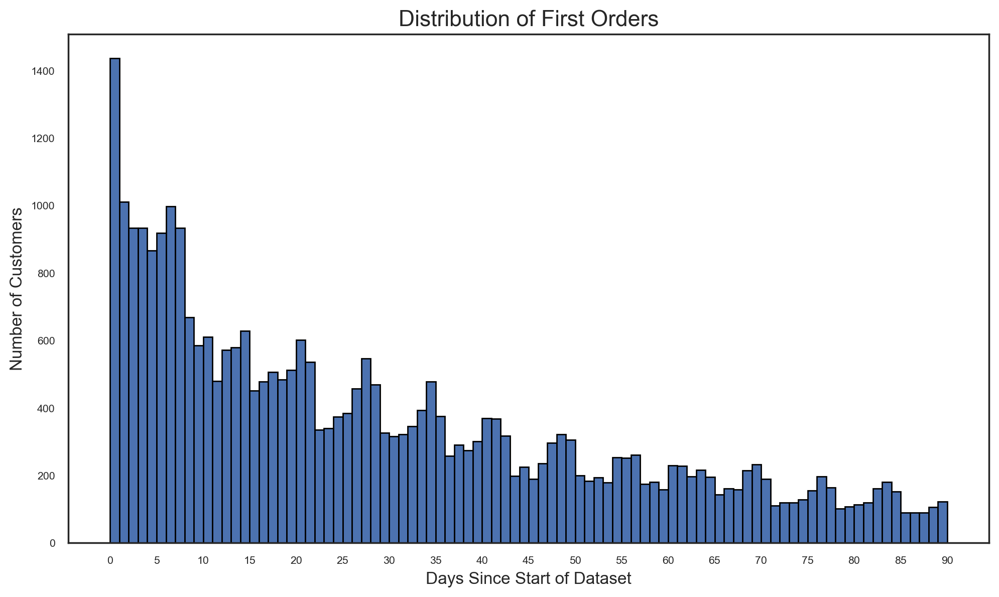

In [611]:
sns.set_style("white")
plt.figure(figsize=(10, 6))
plt.hist(customers_eda["first_order"], bins=90, edgecolor="black")

plt.title("Distribution of First Orders", fontsize=16)
plt.xlabel("Days Since Start of Dataset", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

tick_positions4 = np.arange(0, customers_eda["first_order"].max() + 1, 5)
plt.xticks(tick_positions4)

plt.tight_layout()
plt.show()

In [612]:
customers_eda[customers_eda["first_order"].isna()]

# As the last_order is 0 (i.e. first day of the period), it can be assumed that the first_order is 0 
# Replace NaN with 0

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Young Adults (20-29),NaN
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN
f6b6709018,8670,NaN,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,NaN,NaN
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN


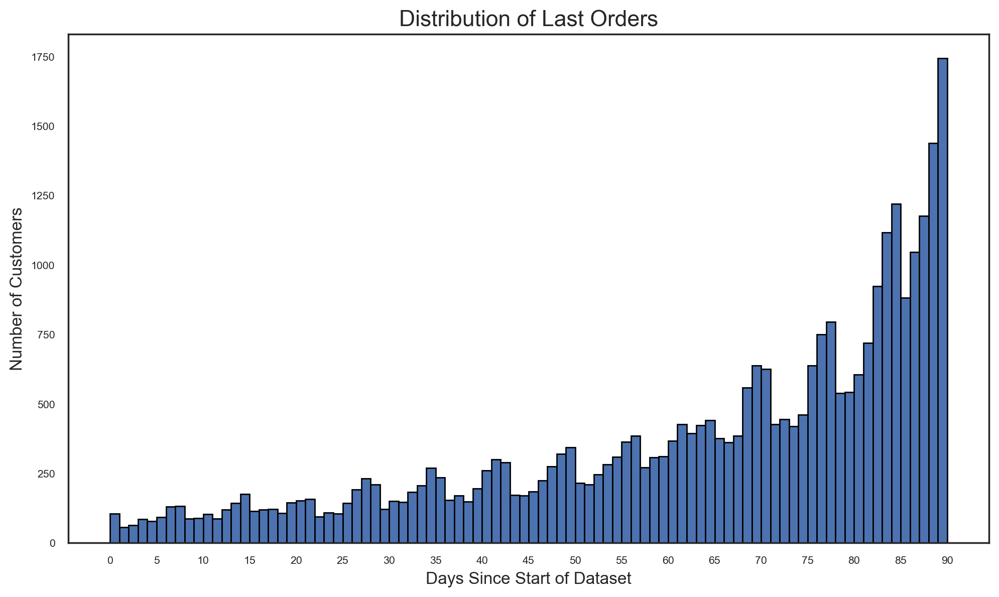

In [613]:
sns.set_style("white")
plt.figure(figsize=(10, 6))
plt.hist(customers_eda["last_order"], bins=90, edgecolor="black")

plt.title("Distribution of Last Orders", fontsize=16)
plt.xlabel("Days Since Start of Dataset", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

tick_positions5 = np.arange(0, customers_eda["last_order"].max() + 1, 5)
plt.xticks(tick_positions5)

plt.tight_layout()
plt.show()

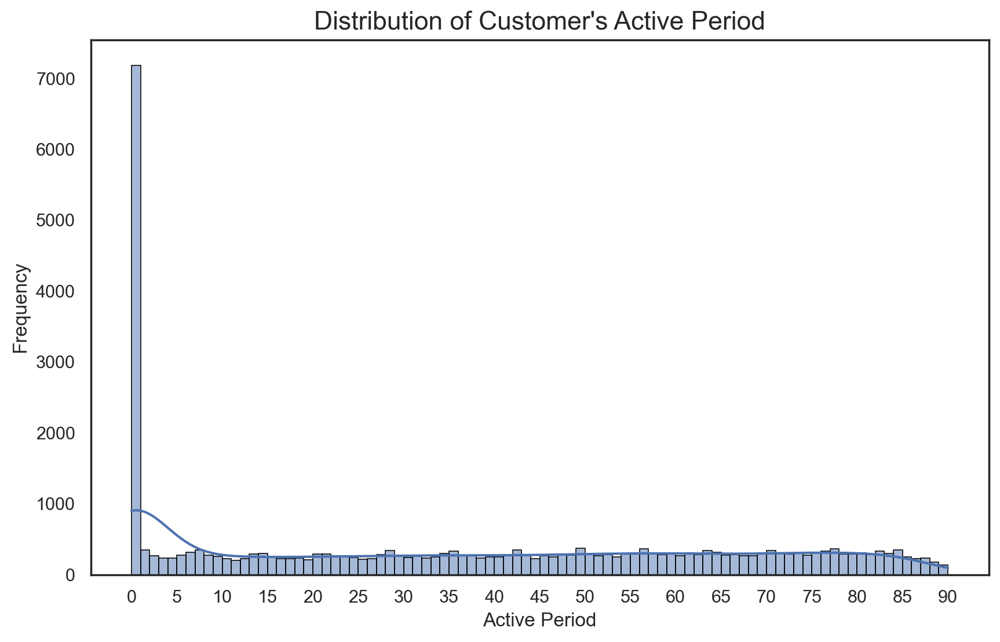

In [614]:
# The active period of a customer can be caluclated by substracting last_order and first_order
# This creates a new column called active_period
customers_eda["active_period"] = customers_eda["last_order"] - customers_eda["first_order"]

sns.set()
sns.set_style("white")
plt.figure(figsize=(10, 6))

sns.histplot(customers_eda["active_period"], bins=90, kde=True,  edgecolor="black")
plt.title("Distribution of Customer's Active Period", fontsize=16)
plt.xlabel("Active Period", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

tick_positions6 = np.arange(0, customers_eda["last_order"].max() + 1, 5)
plt.xticks(tick_positions6)

plt.show()

<a class="anchor" id="sub-section-1_4_1_7">

#### 1.4.1.7. CUI_American to CUI_Thai
    
</a>

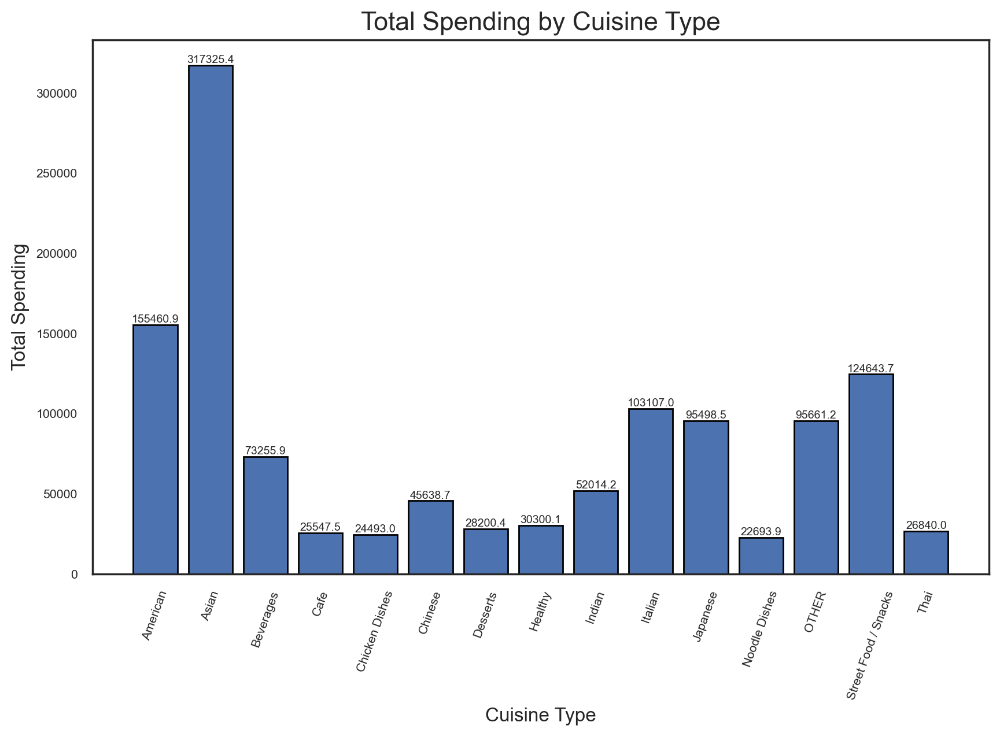

In [615]:
cuisine_columns = [col for col in customers_eda.columns if col.startswith("CUI")]
cuisine_column_sums = customers_eda[cuisine_columns].sum()

# Convert index to string for plotting because i was getting an error
cuisine_column_sums.index = cuisine_column_sums.index.str.replace("CUI_", "")

sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.bar(cuisine_column_sums.index, cuisine_column_sums.values, edgecolor="black")

for index, value in enumerate(round(cuisine_column_sums, 1)):
    plt.text(index, value + 1, str(value), ha='center', va='bottom', fontsize=7)

plt.title("Total Spending by Cuisine Type", fontsize=16)
plt.xlabel("Cuisine Type", fontsize=12)
plt.ylabel("Total Spending", fontsize=12)
plt.xticks(rotation=70)
plt.show() 

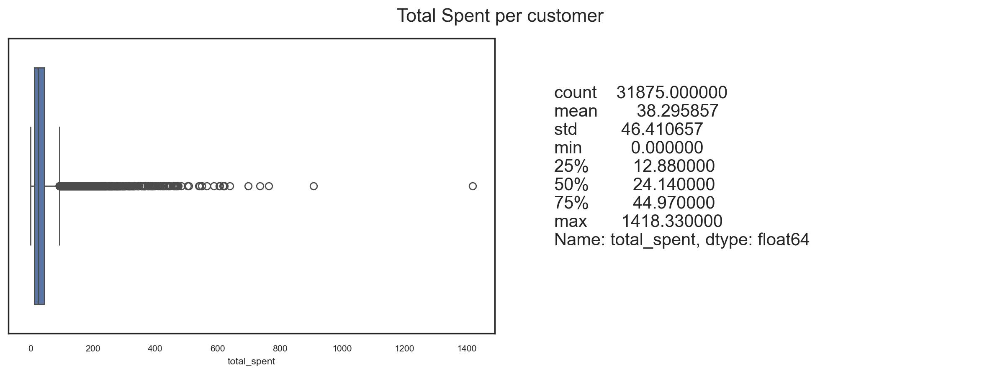

In [616]:
# Create a column that indicates how much customers spent (sum all cuisine types)
customers_eda["total_spent"] = customers_eda[cuisine_columns].sum(axis=1)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4.5))
sns.set(font_scale=0.7)

sns.boxplot(x=customers_eda["total_spent"], ax = ax1)

describe = customers_eda["total_spent"].describe()
ax2.text(0.1, 0.3, describe, fontsize=15)
ax2.axis("off")

title = "Total Spent per customer"

plt.suptitle(title, fontsize=16)
plt.tight_layout()
plt.show()

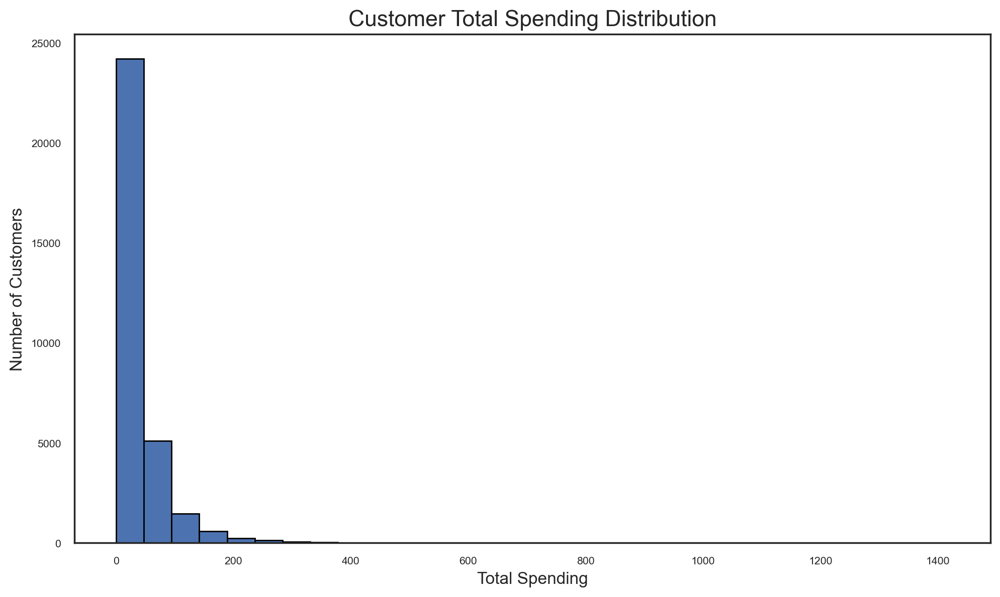

In [617]:
# Plot histogram of total_spent
sns.set(font_scale=0.7)
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.hist(customers_eda['total_spent'], bins=30, edgecolor="black")

# Add labels and title
plt.title("Customer Total Spending Distribution", fontsize=16)
plt.xlabel("Total Spending", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)

plt.tight_layout()
plt.show()

The boxplot and histogram of customers' total spending show extreme outliers and a strong right-skewed distribution. 

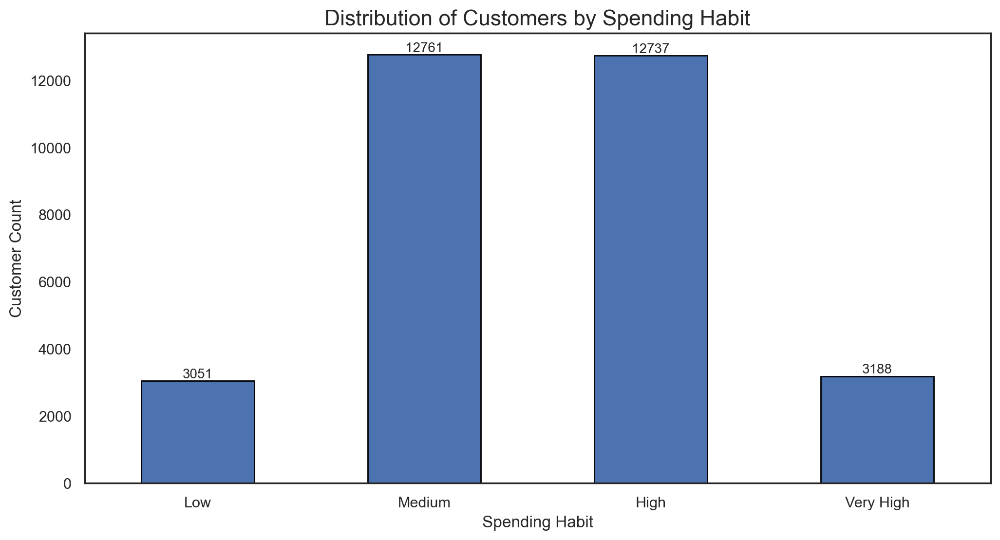

Spending Categories based on total spending:
Low: Customers who spent less than 6.71.
Medium: Customers who spent between 6.71 and 24.14.
High: Customers who spent between 24.14 and 84.31.
Very High: Customers who spent more than 84.31.


In [618]:
# Calculate percentiles 10, 50 and 90
low_cutoff = customers_eda['total_spent'].quantile(0.1)
medium_cutoff = customers_eda['total_spent'].quantile(0.5)
high_cutoff = customers_eda['total_spent'].quantile(0.9)

spending_bins = [0, low_cutoff, medium_cutoff, high_cutoff, float('inf')]
spending_labels = ['Low', 'Medium', 'High', 'Very High']

customers_eda['spending_habit'] = pd.cut(customers_eda['total_spent'], bins=spending_bins, labels=spending_labels, ordered=True)

spending_habit_count = customers_eda['spending_habit'].value_counts().reindex(spending_labels)

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))
spending_habit_count.plot(kind="bar", edgecolor="black")

for index, value in enumerate(spending_habit_count):
    plt.text(index, value + 1, str(value), ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers by Spending Habit", fontsize=16)
plt.xlabel("Spending Habit", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)

plt.show()

print(f"Spending Categories based on total spending:")
print(f"Low: Customers who spent less than {low_cutoff:.2f}.")
print(f"Medium: Customers who spent between {low_cutoff:.2f} and {medium_cutoff:.2f}.")
print(f"High: Customers who spent between {medium_cutoff:.2f} and {high_cutoff:.2f}.")
print(f"Very High: Customers who spent more than {high_cutoff:.2f}.")

In [619]:
customers_eda[customers_eda["total_spent"] == 0] 
# 138 rows with 0 monetary units spent

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity,active_period,total_spent,spending_habit
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
4903041977,8670,22.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
c94b288475,8670,26.0,0,0,0,1.0,1,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
f687717dc1,8670,21.0,0,0,1,1.0,1,DELIVERY,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
c6cf0b76fb,8670,38.0,0,0,0,2.0,2,DELIVERY,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),No Diversity,0.0,0.0,NaN
1b7c34738e,8670,24.0,0,0,0,3.0,3,-,CASH,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
177ede2420,8670,30.0,0,0,1,86.0,86,-,DIGI,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),No Diversity,0.0,0.0,NaN
0039059c9c,8670,22.0,0,0,1,88.0,88,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN
0e60632fe2,8670,23.0,0,0,0,89.0,89,DISCOUNT,CARD,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,Young Adults (20-29),No Diversity,0.0,0.0,NaN


In [620]:
# Change 0s to NaN to calculate the average spending per cuisine
# This will not change the original dataframe
avg_spending_per_cuisine = customers_eda[cuisine_columns].replace(0, np.nan).mean().sort_values(ascending=False)

print("Average Spending per Cuisine:")
print(avg_spending_per_cuisine)

Average Spending per Cuisine:
CUI_Street Food / Snacks    29.369394
CUI_Asian                   26.674965
CUI_Cafe                    18.702401
CUI_Italian                 15.990540
CUI_Japanese                15.158489
CUI_Indian                  15.085325
CUI_American                14.406533
CUI_Desserts                13.988309
CUI_Healthy                 13.969604
CUI_OTHER                   13.586313
CUI_Beverages               13.488474
CUI_Chinese                 12.958169
CUI_Thai                    11.286804
CUI_Noodle Dishes           10.194933
CUI_Chicken Dishes           7.540964
dtype: float64


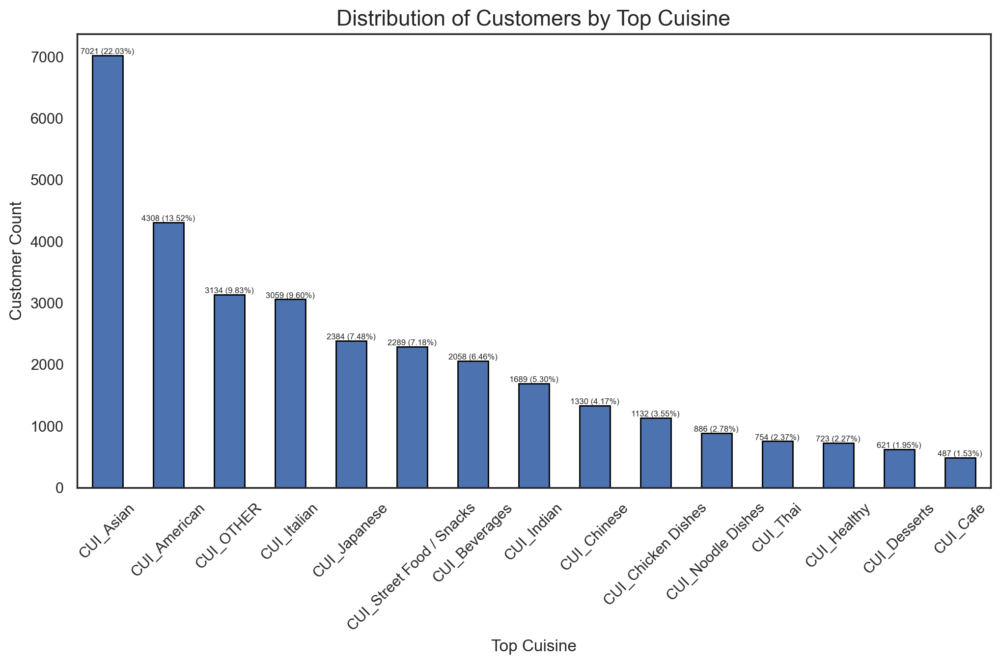

In [621]:
# Create a column which shows which cuisine a customer has spent the most money on
customers_eda['top_cuisine'] = customers_eda[cuisine_columns].idxmax(axis=1)
cuisine_type_count = customers_eda["top_cuisine"].value_counts()
cuisine_type_percent = customers_eda["top_cuisine"].value_counts(normalize=True) * 100

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

cuisine_type_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(round(cuisine_type_count, 1), cuisine_type_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=6)

plt.title("Distribution of Customers by Top Cuisine", fontsize=16)
plt.xlabel("Top Cuisine", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=45)
plt.show()

<a class="anchor" id="sub-section-1_4_1_8">

#### 1.4.1.8. DOW_0 to DOW_6
    
</a>

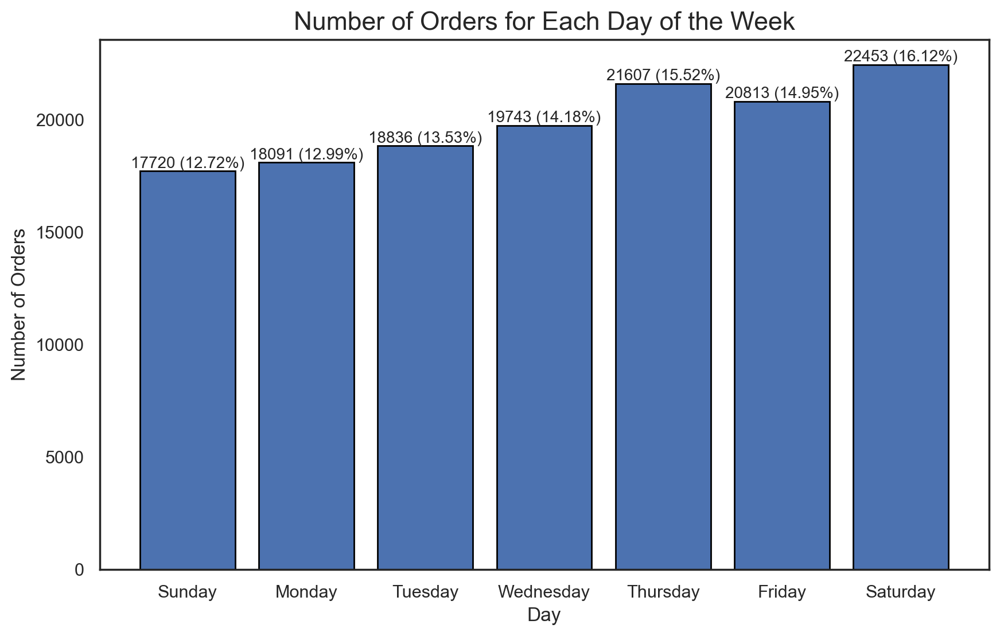

In [622]:
day_names = ["Sunday", "Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday"]

# Create column names in the same format as in the data frame
days_columns = [f"DOW_{i}" for i in range(0, 7)]

# Get all columns with days_columns format
# Calculate the total number of orders by summing across each day column
days_column_sums = customers_eda[days_columns].sum()
days_column_sums_percent = (days_column_sums / days_column_sums.sum()) * 100

# Replace the index of days_column_sums with day_names
days_column_sums.index = day_names

sns.set()
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Plot the total orders for each day
plt.bar(days_column_sums.index, days_column_sums.values, edgecolor="black")

for index, (count, percent) in enumerate(zip(round(days_column_sums), days_column_sums_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Number of Orders for Each Day of the Week", fontsize=16)
plt.xlabel("Day", fontsize=12)
plt.ylabel("Number of Orders", fontsize=12)
plt.xticks(rotation=0)

plt.show()

In [623]:
# Create a column that calculates the total number of orders for each customers
customers_eda["total_number_of_orders"] = customers_eda[days_columns].sum(axis=1)
days_mean = customers_eda["total_number_of_orders"].mean().round(2)
days_median = customers_eda["total_number_of_orders"].median()

print(f"The total_number_of_orders mean ({days_mean}) and median ({days_median}) suggest that "
      f"most customers place a relatively low number of orders during the week")
print(f"The total_number_of_orders ranges from a minimum of {customers_eda['total_number_of_orders'].min()} "
      f"to a maximum of {customers_eda['total_number_of_orders'].max()} orders a week.")
print(f"There are {len(customers_eda[customers_eda['total_number_of_orders'] == 0])} rows with 0 orders.")

The total_number_of_orders mean (4.37) and median (3.0) suggest that most customers place a relatively low number of orders during the week
The total_number_of_orders ranges from a minimum of 0 to a maximum of 94 orders a week.
There are 138 rows with 0 orders.


There are customers that have not placed any orders. This is consistent with the findings in vendor_counts, where it can be assumed that customers just have created accounts without placing any orders.

Now, we can check which days of the week are more popular to order food, and have a better insight into customers' spending habits. 

In [624]:
customers_eda['start_week'] = customers_eda['DOW_1'] + customers_eda['DOW_2']
customers_eda['mid_week'] = customers_eda['DOW_3'] + customers_eda['DOW_4']
customers_eda['end_week'] = customers_eda['DOW_5'] + customers_eda['DOW_6'] + customers_eda['DOW_0']

In [625]:
week = ['start_week', 'mid_week', 'end_week']

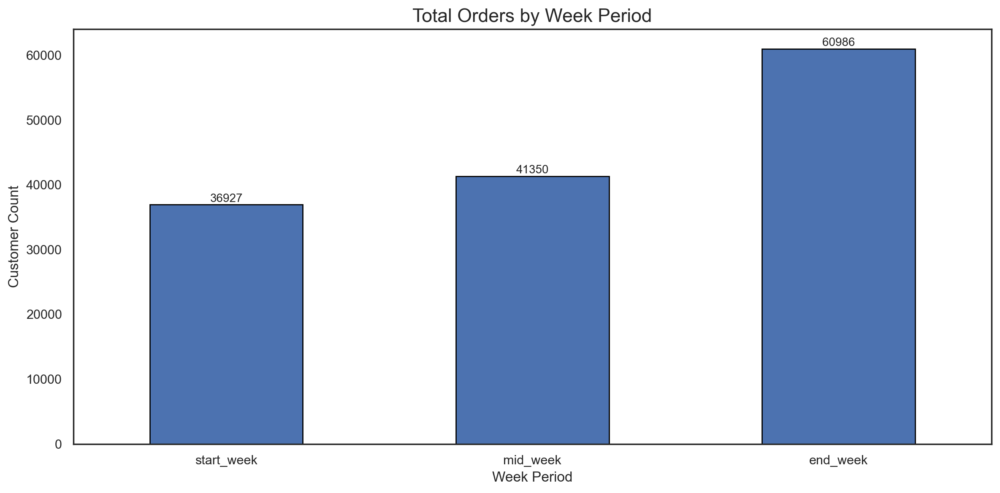

In [626]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

week_totals = customers_eda[week].sum()

week_totals.plot(kind='bar', stacked=True, edgecolor="black")
plt.title("Total Orders by Week Period", fontsize=16)
plt.xlabel("Week Period", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)

for index, value in enumerate(week_totals):
    plt.text(index, value + 50, str(int(value)), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_4_1_9">

#### 1.4.1.9. HR_0 to HR_1
    
</a>

In [627]:
missing_count = len(customers_eda[customers_eda['HR_0'].isna()])
non_missing_counts = customers_eda['HR_0'].value_counts()

print(f"In the 'HR_0' variable, there are {missing_count} missing values. "
      f"The only non-missing value is 0, with a count of {non_missing_counts[0]}.")

In the 'HR_0' variable, there are 1164 missing values. The only non-missing value is 0, with a count of 30711.


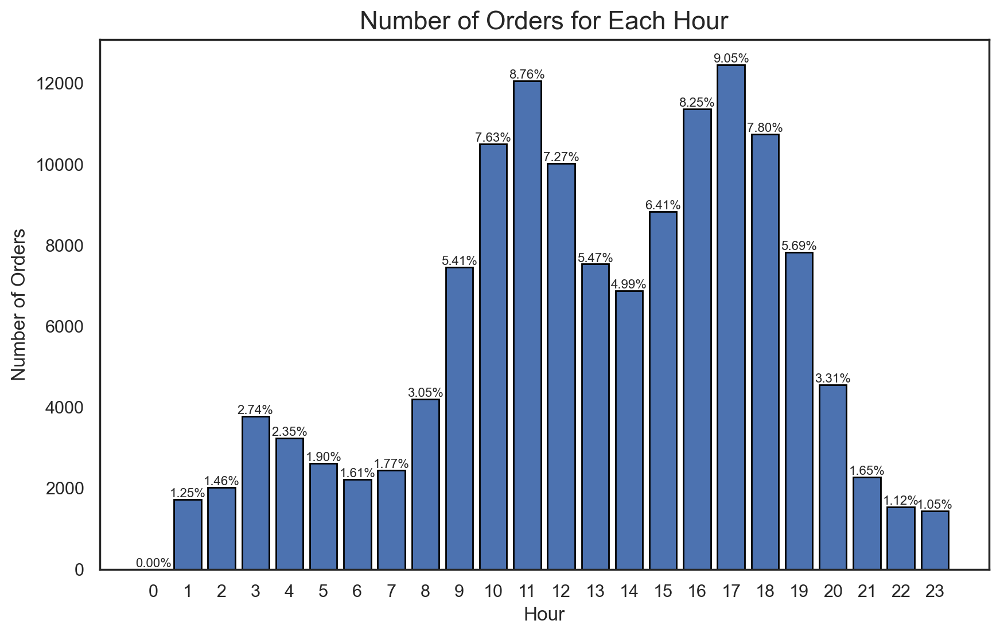

In [628]:
# Create a list of column names from HR_0 to HR_23 (similar to DOW_)
hour_columns = [f"HR_{i}" for i in range(0, 24)]

# Get all columns with hour_columns format
# Calculate the total number of orders by summing across each hour column
hr_column_sums = customers_eda[hour_columns].sum()
hr_column_sums_percent = (hr_column_sums / hr_column_sums.sum()) * 100

# Convert index to string for plotting to avoid getting an error
hr_column_sums.index = hr_column_sums.index.str.replace("HR_", "")

sns.set()
sns.set_style("white")
plt.figure(figsize=(10, 6))

# Plot the total orders for each hour
plt.bar(hr_column_sums.index, hr_column_sums.values, edgecolor="black")

for index, percent in enumerate(hr_column_sums_percent):
    plt.text(index, hr_column_sums.values[index] + 1, f"{percent:.2f}%", ha='center', va='bottom', fontsize=8)

plt.title("Number of Orders for Each Hour", fontsize=16)
plt.xlabel("Hour", fontsize=12)
plt.ylabel("Number of Orders", fontsize=12)
plt.xticks(rotation=0)

plt.show()

In [629]:
# Check if total number of orders based on days of the week is the same in hours of the day
print(f"Total sum of orders across the days of the week: {days_column_sums.sum()}")
print(f"Total sum of orders across the hours of the day: {hr_column_sums.sum()}")

Total sum of orders across the days of the week: 139263
Total sum of orders across the hours of the day: 137711.0


In [630]:
# Check the difference between the two sums, as they should be equal but there are missing values
print(f"Difference: {days_column_sums.sum() - hr_column_sums.sum()}")

Difference: 1552.0


There are 1165 missing values in HR_0. Therefore, the difference betwen the days_column_sums.sum() and hr_column_sums.sum() should be equal to 1165. However, the actual difference is 1553. There is an inconsistency, and must be dealt with.

Similarly to grouping days of the week, we group hours of the day to get a clearer picture as to when customers place orders. 

In [631]:
customers_eda['night'] = customers_eda[['HR_22', 'HR_23', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5']].sum(axis=1)
customers_eda['morning'] = customers_eda[['HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10']].sum(axis=1)
customers_eda['midday'] = customers_eda[['HR_11', 'HR_12', 'HR_13', 'HR_14']].sum(axis=1)
customers_eda['afternoon'] = customers_eda[['HR_15', 'HR_16', 'HR_17']].sum(axis=1)
customers_eda['evening'] = customers_eda[['HR_18', 'HR_19', 'HR_20', 'HR_21']].sum(axis=1)

In [632]:
day = ["night", "morning", "midday", "afternoon", "evening"]

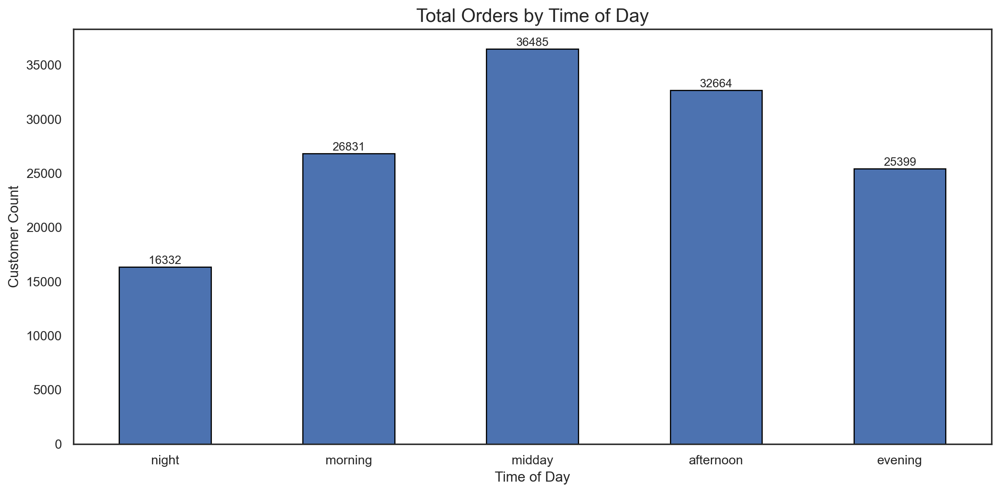

In [633]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

day_totals = customers_eda[day].sum()

day_totals.plot(kind='bar', stacked=True, edgecolor="black")
plt.title("Total Orders by Time of Day", fontsize=16)
plt.xlabel("Time of Day", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)

for index, value in enumerate(day_totals):
    plt.text(index, value + 50, str(int(value)), ha='center', va='bottom', fontsize=10)

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_4_2">

### 1.4.2. Categorical Variables
    
</a>

<a class="anchor" id="sub-section-1_4_2_1">

#### 1.4.2.1. customer_region
    
</a>

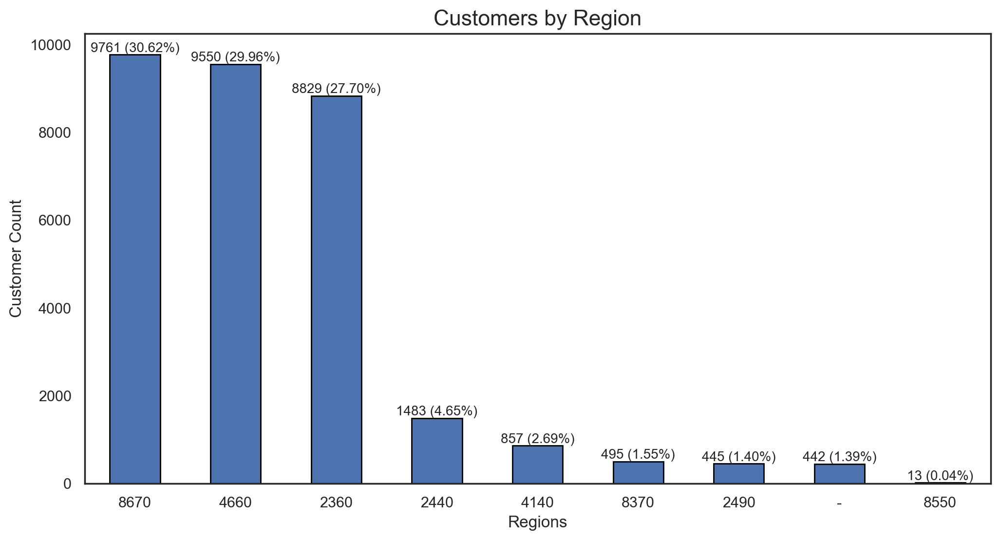

In [634]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

customer_region_count = customers_eda["customer_region"].value_counts()
customer_region_percent = customers_eda["customer_region"].value_counts(normalize=True) * 100

customer_region_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(customer_region_count, customer_region_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customers by Region", fontsize=16)
plt.xlabel("Regions", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

The top regions are 8670, 4660, and 2360. Each code beginning with the same number can represent the same city. For instance, 8670, 8370 and 8550 could represent the same city, but different areas of the city.

In [635]:
city_mapping = {"8670": "city_8", 
                "8370": "city_8", 
                "8550": "city_8",
                "4660": "city_4", 
                "4140": "city_4",
                "2360": "city_2", 
                "2440": "city_2", 
                "2490": "city_2",
                "-": "-"}

# Create a new column with the cities divided into 3 and "-"
customers_eda["city"] = customers_eda["customer_region"].map(city_mapping)

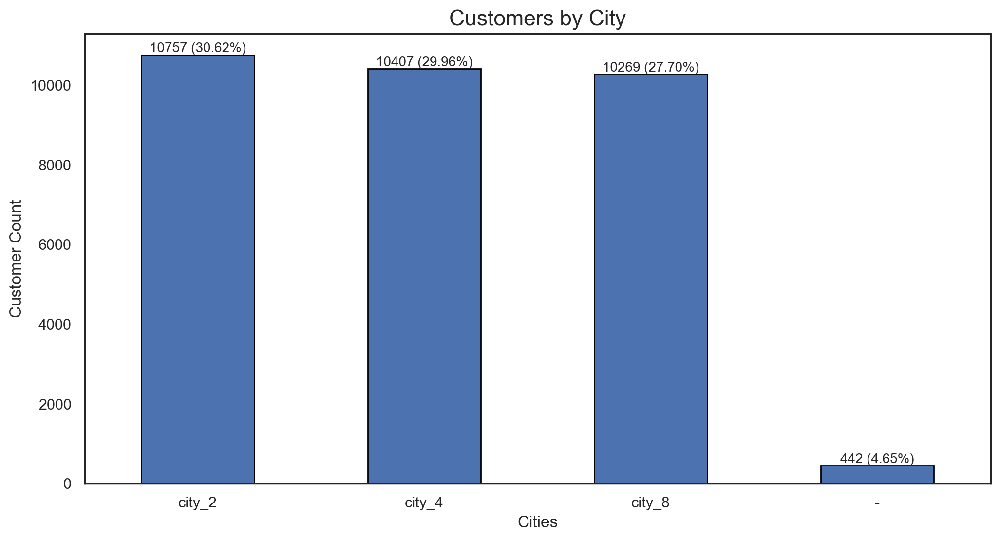

In [636]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

customer_city_count = customers_eda["city"].value_counts()
customer_city_percent = customers_eda["city"].value_counts(normalize=True) * 100

customer_city_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(customer_city_count, customer_region_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Customers by City", fontsize=16)
plt.xlabel("Cities", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_4_2_2">

#### 1.4.2.2. last_promo
    
</a>

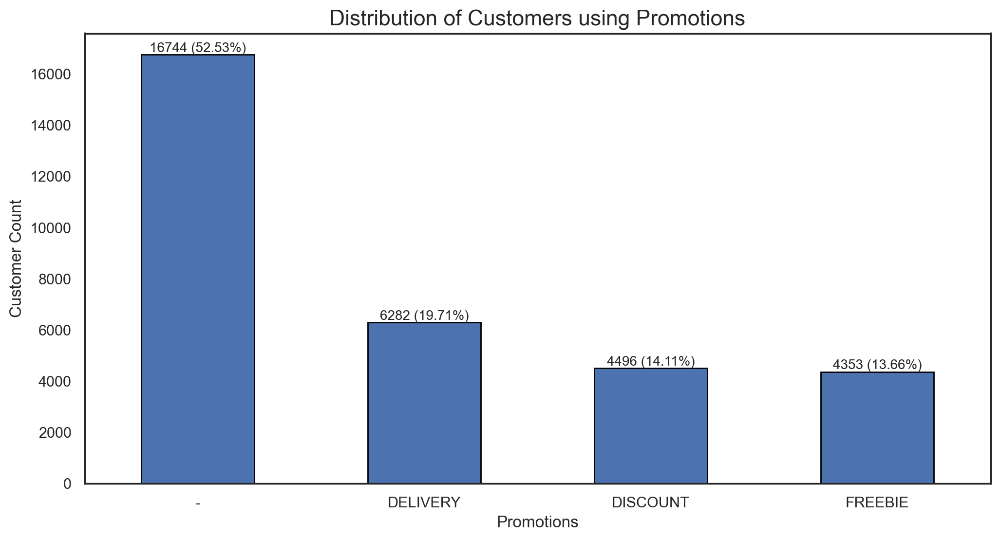

In [637]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

last_promo_count = customers_eda["last_promo"].value_counts()
last_promo_percent = customers_eda["last_promo"].value_counts(normalize=True) * 100

last_promo_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(last_promo_count, last_promo_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers using Promotions", fontsize=16)
plt.xlabel("Promotions", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

As last_promo represents the last type of promotion or discount used, it does not give us the most used type of promotion. Therefore, creating a new variable indicating if a promotion or discount was used or not might be more useful.

In [638]:
last_promo_mapping = {"-": "NO",
                      "DELIVERY": "YES",
                      "DISCOUNT": "YES",
                      "FREEBIE": "YES"}

# Create a new column with the cities divided into 3 and "-"
customers_eda["promo_used"] = customers_eda["last_promo"].map(last_promo_mapping)

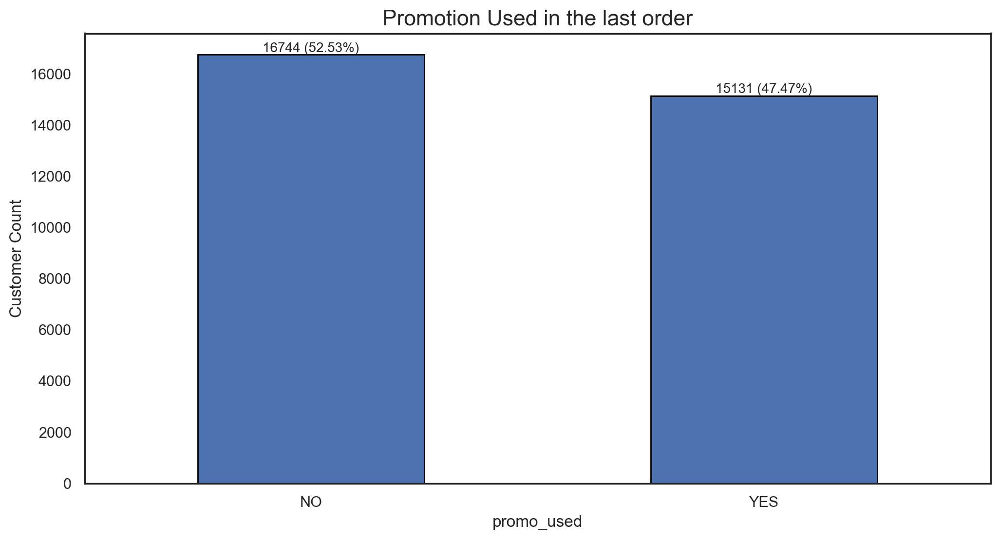

In [639]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

promo_used_count = customers_eda["promo_used"].value_counts()
promo_used_percent = customers_eda["promo_used"].value_counts(normalize=True) * 100

promo_used_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(promo_used_count, promo_used_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Promotion Used in the last order", fontsize=16)
#plt.xlabel("Cities", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_4_2_3">

#### 1.4.2.3. payment_method
    
</a>

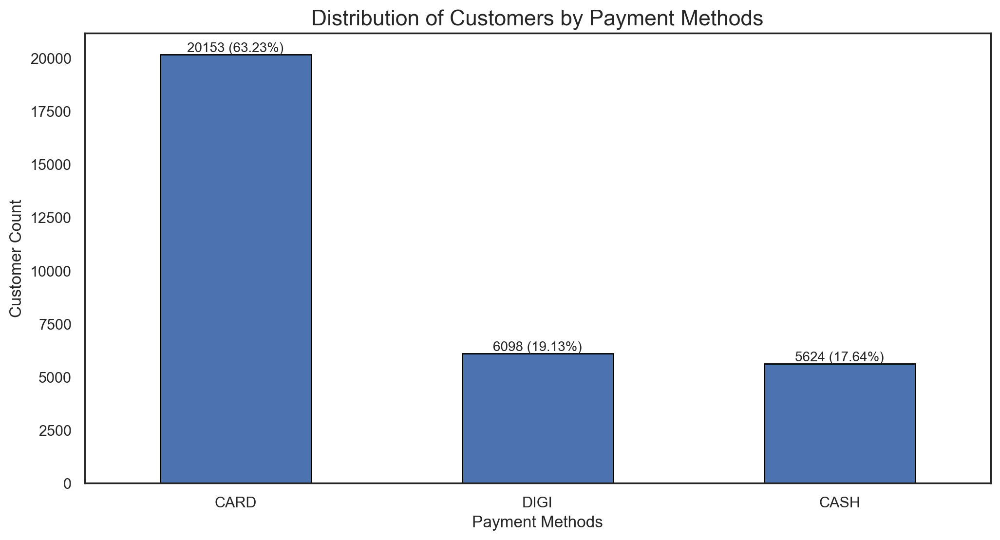

In [640]:
sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))

payment_method_count = customers_eda["payment_method"].value_counts()
payment_method_percent = customers_eda["payment_method"].value_counts(normalize=True) * 100

payment_method_count.plot(kind="bar", edgecolor="black")

for index, (count, percent) in enumerate(zip(payment_method_count, payment_method_percent)):
    plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

plt.title("Distribution of Customers by Payment Methods", fontsize=16)
plt.xlabel("Payment Methods", fontsize=12)
plt.ylabel("Customer Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_5">

## 1.5. Multivariate Analysis
    
</a>

<a class="anchor" id="sub-section-1_5_1">

### 1.5.1. payment_method & product_count
    
</a>

Investigate whether customers using different payment methods behave differently in terms of order volume and engagement.

payment_method
CARD    6.358458
CASH    4.137624
DIGI    4.799770
Name: product_count, dtype: float64


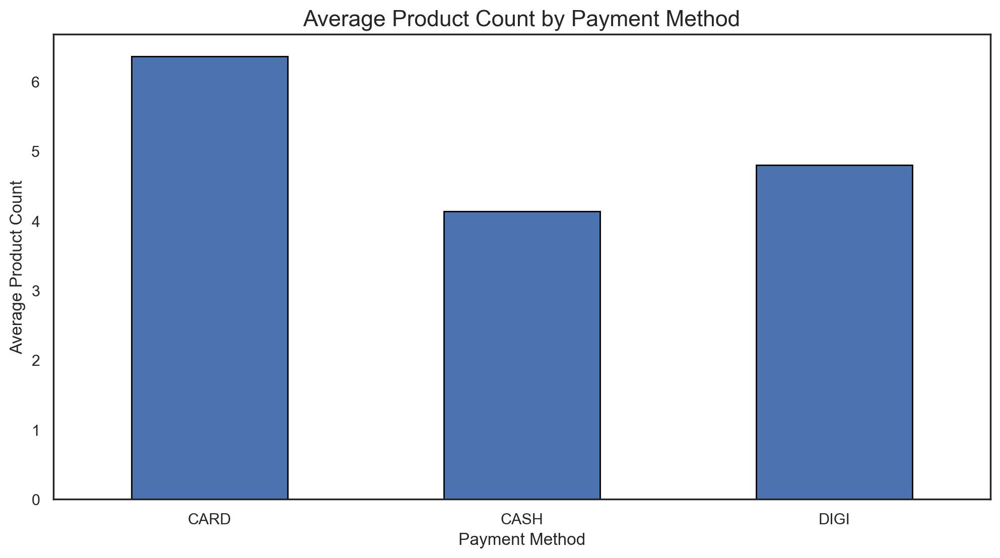

In [641]:
# Calculate the average product_count per payment method
payment_product_count = customers_eda.groupby('payment_method')['product_count'].mean()
print(payment_product_count)

sns.set()
sns.set_style("white")
plt.figure(figsize=(12, 6))
payment_product_count.plot(kind='bar', edgecolor='black')

plt.title('Average Product Count by Payment Method', fontsize=16)
plt.xlabel('Payment Method', fontsize=12)
plt.ylabel('Average Product Count', fontsize=12)
plt.xticks(rotation=0)

plt.show()

Customers who pay by CARD tend to purchase more products on average than those who use CASH or DIGI (digital payment methods).

<a class="anchor" id="sub-section-1_5_2">

### 1.5.2. city & last_promo/ payment_method
    
</a>

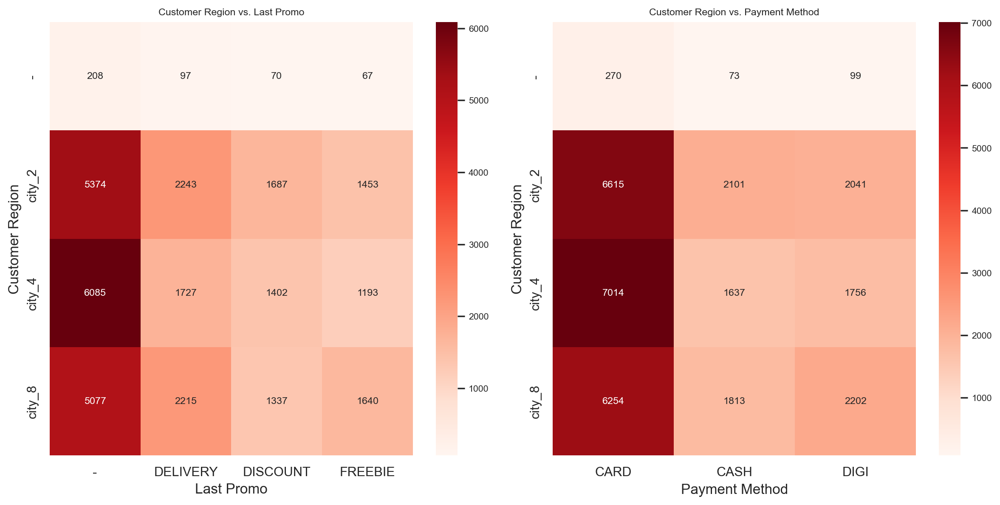

In [642]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

crosstab1 = pd.crosstab(customers_eda['city'], customers_eda['last_promo'])
crosstab2 = pd.crosstab(customers_eda['city'], customers_eda['payment_method'])

sns.heatmap(crosstab1, annot=True, fmt="d", cmap="Reds", ax = ax1)
ax1.set_title("Customer Region vs. Last Promo")
ax1.set_xlabel("Last Promo")
ax1.set_ylabel("Customer Region")

sns.heatmap(crosstab2, annot=True, fmt="d", cmap="Reds", ax = ax2)
ax2.set_title("Customer Region vs. Payment Method")
ax2.set_xlabel("Payment Method")
ax2.set_ylabel("Customer Region")

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_5_3">

### 1.5.3. vendor_diversity & customer_age/ product_count
    
</a>

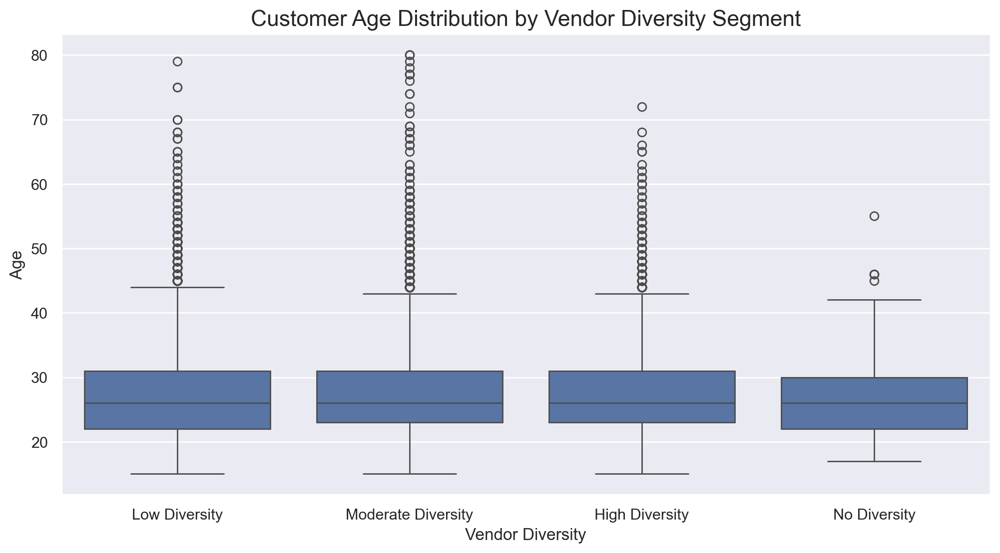

In [643]:
sns.set()
plt.figure(figsize=(12, 6))
sns.boxplot(x='vendor_diversity', y='customer_age', data=customers_eda)

plt.title("Customer Age Distribution by Vendor Diversity Segment", fontsize=16)
plt.xlabel("Vendor Diversity", fontsize=12)
plt.ylabel("Age", fontsize=12)
plt.xticks(rotation=0)

plt.show()

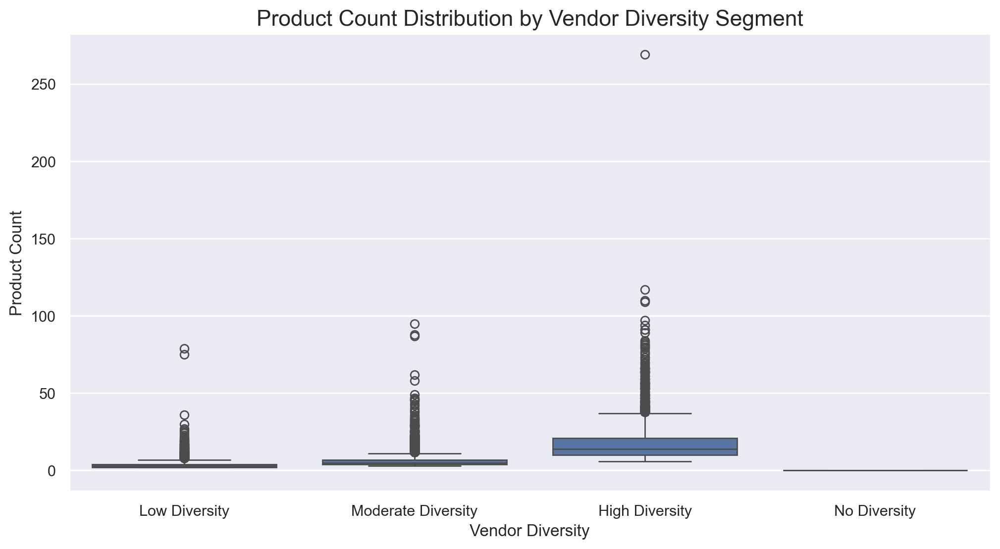

In [644]:
sns.set()
plt.figure(figsize=(12, 6))
sns.boxplot(x='vendor_diversity', y='product_count', data=customers_eda)

plt.title("Product Count Distribution by Vendor Diversity Segment", fontsize=16)
plt.xlabel("Vendor Diversity", fontsize=12)
plt.ylabel("Product Count", fontsize=12)
plt.xticks(rotation=0)
plt.show()

<a class="anchor" id="sub-section-1_5_4">

### 1.5.4. top_cuisine & city

</a>

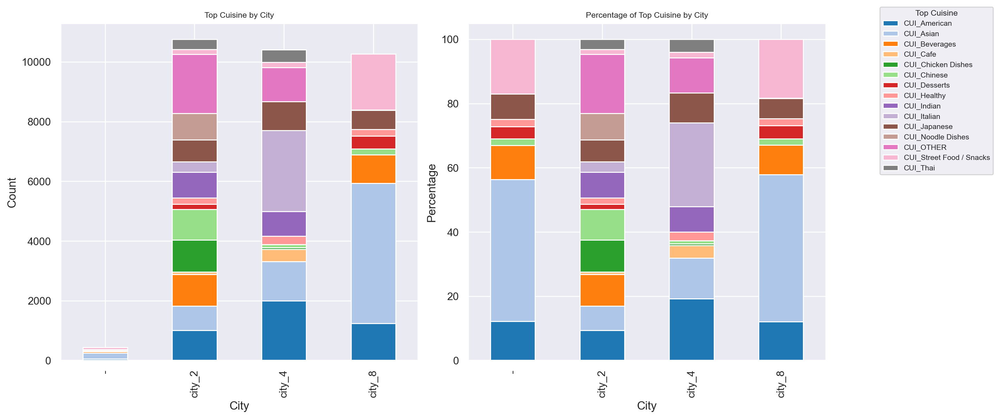

In [645]:
sns.set()
colors = sns.color_palette("tab20", n_colors=15)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

preferred_cuisine_by_region = customers_eda.groupby(['city', 'top_cuisine']).size().unstack()
preferred_cuisine_by_region_proportions = preferred_cuisine_by_region.div(preferred_cuisine_by_region.sum(axis=1), axis=0) * 100

preferred_cuisine_by_region.plot(kind='bar', stacked=True, ax=ax1, legend=False, color=colors)
ax1.set_title("Top Cuisine by City")
ax1.set_xlabel("City")
ax1.set_ylabel("Count")

preferred_cuisine_by_region_proportions.plot(kind='bar', stacked=True, ax=ax2, legend=False, color=colors)
ax2.set_title("Percentage of Top Cuisine by City")
ax2.set_xlabel("City")
ax2.set_ylabel("Percentage")

handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, title="Top Cuisine", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<a class="anchor" id="sub-section-1_5_5">

### 1.5.5. Spending Habits and Order Behavior
    
</a>

**Objective**: Determine if there’s a relationship between customers’ spending habits and their order behavior, such as order frequency and vendor diversity.

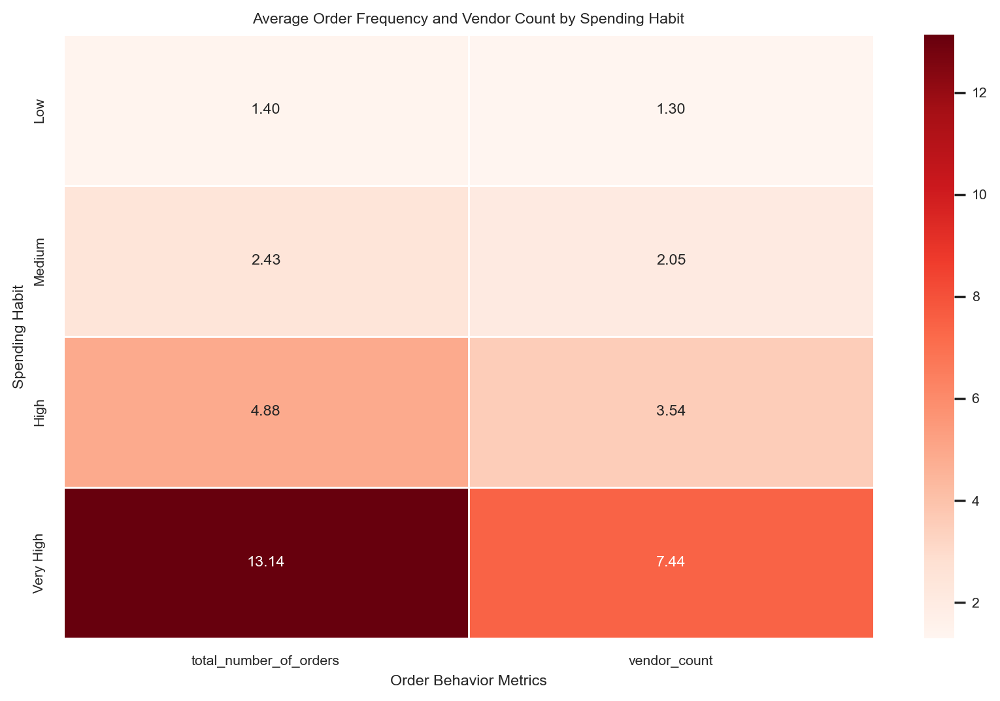

In [646]:
# observed=False to avoid warning and ensure all categories in the categorical are included
spending_behavior = customers_eda.groupby('spending_habit', observed=False)[['total_number_of_orders', 'vendor_count']].mean()

plt.figure(figsize=(10, 6))
sns.heatmap(spending_behavior, annot=True, cmap="Reds", fmt=".2f", linewidths=.5)

plt.title("Average Order Frequency and Vendor Count by Spending Habit")
plt.xlabel("Order Behavior Metrics")
plt.ylabel("Spending Habit")

plt.show()

Based on the heatmap, we can conclude that **higher spending customers tend to place more frequent orders and order from a greater number of vendors**. Specifically, customers in the “Very High” spending category have significantly higher average order frequency (13.14 orders) and vendor diversity (7.44 vendors) compared to lower spending categories. This suggests that high spenders are also more engaged with the platform, both in terms of frequency and variety of vendors.

<a class="anchor" id="sub-section-1_5_6">

### 1.5.6. Promotion Usage and Spending Patterns
    
</a>

**Objective**: Examine if certain promotions (e.g., discounts, free delivery) are associated with higher spending or higher product count.

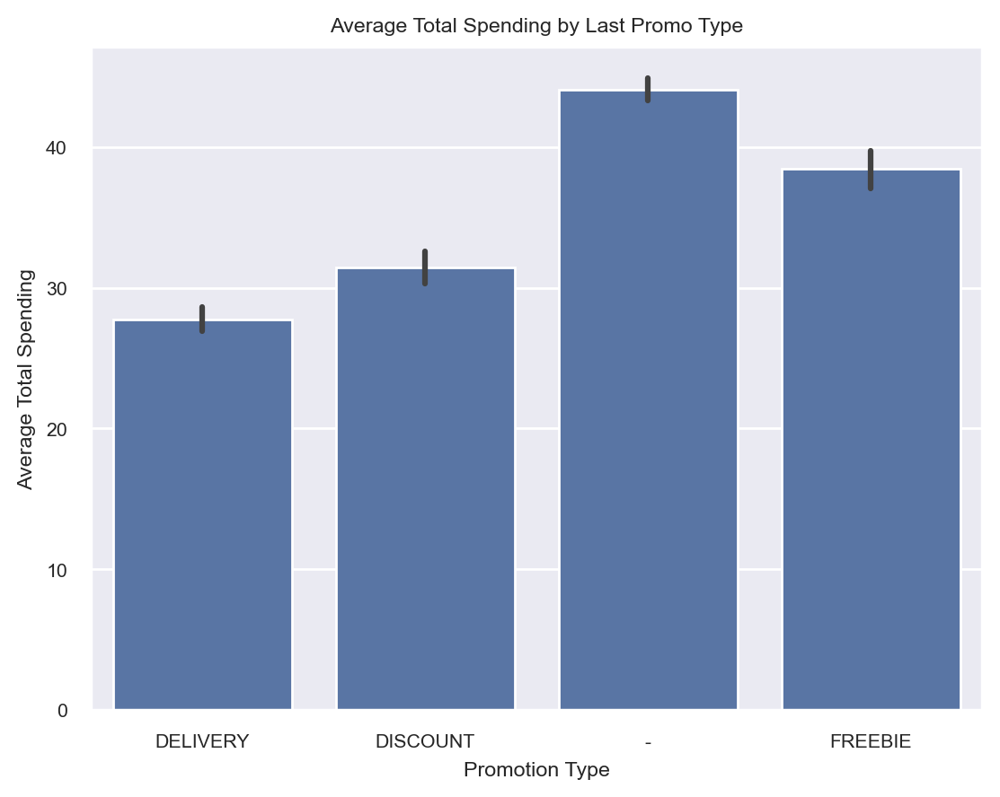

In [647]:
sns.barplot(x='last_promo', y='total_spent', data=customers_eda, estimator='mean')
plt.title("Average Total Spending by Last Promo Type")
plt.xlabel("Promotion Type")
plt.ylabel("Average Total Spending")
plt.show()

Based on the barplot, customers who did not use a promotion (”-”) have the highest average total spending, followed closely by those who used “Freebie” promotions. <br>
This suggests that non-promotion users and freebie users may tend to be higher spenders, while “Delivery” and “Discount” promotions are associated with slightly lower spending on average.

<a class="anchor" id="sub-section-1_5_7">

### 1.5.7. Payment Method Preferences by Spending and Promotion Usage
    
</a>

**Objective**: Examine if certain payment methods are preferred by high spenders or those who use specific promotions, which could guide partnership or payment-incentive strategies.

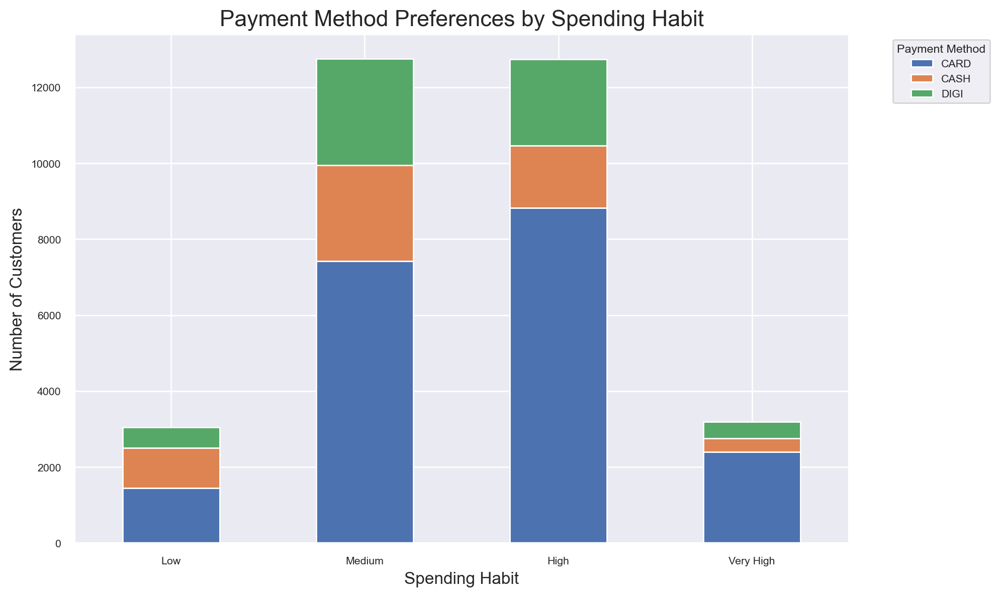

In [648]:
# Group by spending habit and payment method, then count the occurrences
spending_payment = customers_eda.groupby(['spending_habit', 'payment_method'], observed=False).size().unstack(fill_value=0)

spending_payment.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title("Payment Method Preferences by Spending Habit", fontsize=16)
plt.xlabel("Spending Habit", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.legend(title="Payment Method", bbox_to_anchor=(1.05, 1), loc='upper left')  # Legend outside the plot for clarity
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

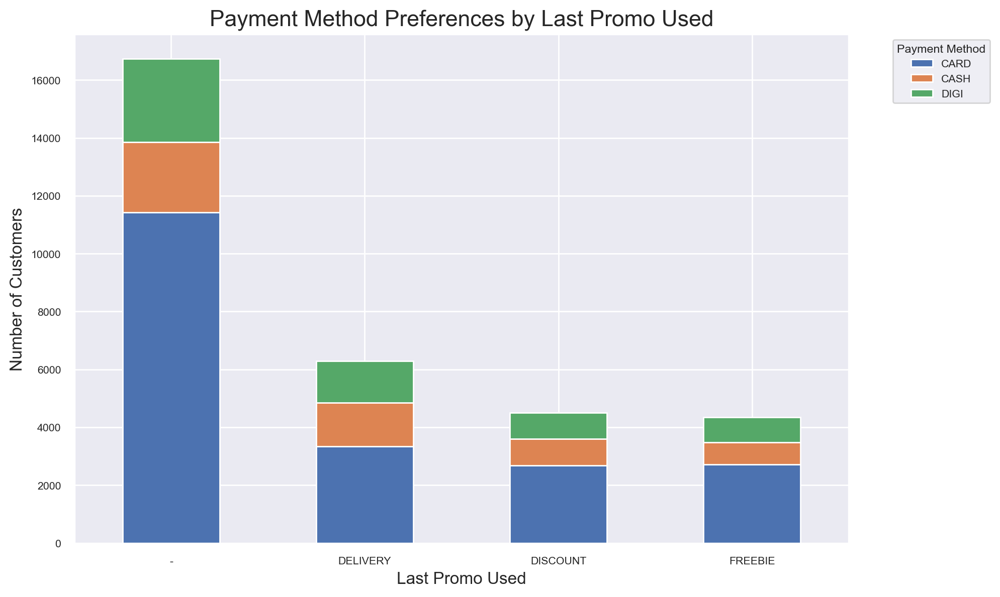

In [649]:
# Group by last promo used and payment method, then count the occurrences
promo_payment = customers_eda.groupby(['last_promo', 'payment_method']).size().unstack(fill_value=0)

promo_payment.plot(kind='bar', stacked=True, figsize=(10, 6))

plt.title("Payment Method Preferences by Last Promo Used", fontsize=16)
plt.xlabel("Last Promo Used", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.legend(title="Payment Method", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=0)

plt.tight_layout()
plt.show()

High spenders predominantly use card payments but also utilize cash and digital options more frequently, suggesting diverse payment preferences at higher spending levels. Additionally, while card remains the top method across all promotions, specific promotions like “Delivery” and “Discount” show increased use of cash and digital payments, indicating opportunities for targeted payment incentives aligned with spending and promotional preferences.

<a class="anchor" id="sub-section-1_6_8">

### 1.5.8. Week period and time of day
    
</a>

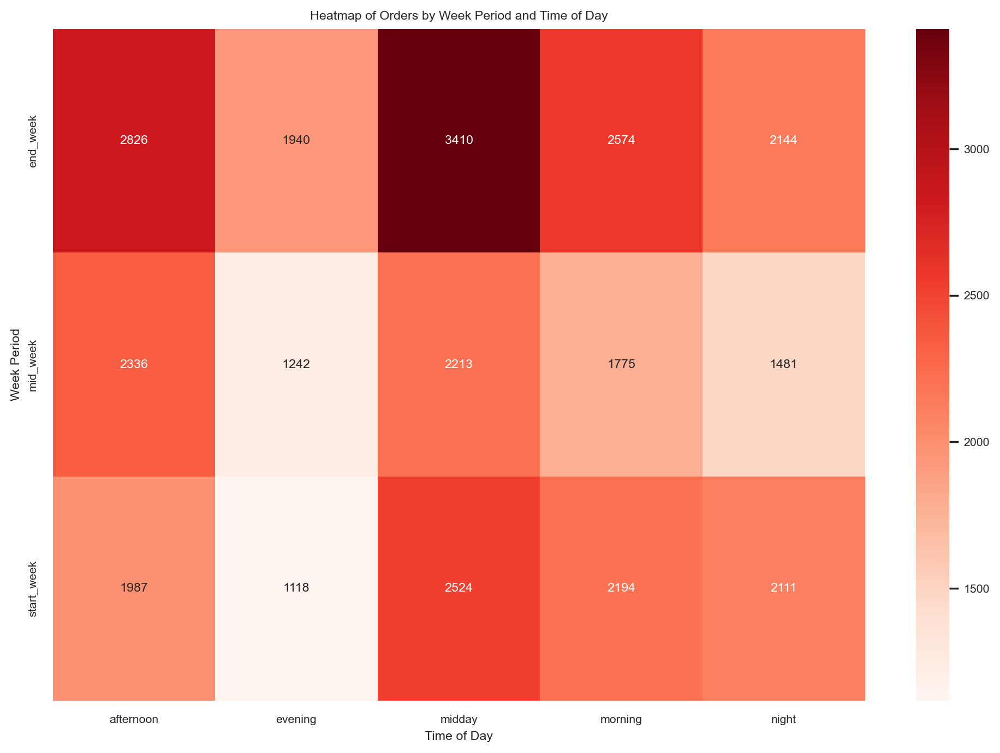

In [650]:
# Define the day and hour columns based on new week period and time period categories

# Create a DataFrame for the heatmap based on max activity by day period and time period
week_day_periods = customers_eda[week + day].copy()
week_day_periods['week_period'] = week_day_periods[week].idxmax(axis=1)
week_day_periods['day_time'] = week_day_periods[day].idxmax(axis=1)

# Calculate the count of occurrences for each day-hour combination
week_day_counts = pd.crosstab(week_day_periods['week_period'], week_day_periods['day_time'])

plt.figure(figsize=(12, 8))
sns.heatmap(week_day_counts, annot=True, fmt="d",cmap="Reds")
plt.title("Heatmap of Orders by Week Period and Time of Day")
plt.xlabel("Time of Day")
plt.ylabel("Week Period")
plt.show()

<a class="anchor" id="sub-section-1_5_9">

### 1.5.9. Spending habits in cities & in top cuisines
    
</a>

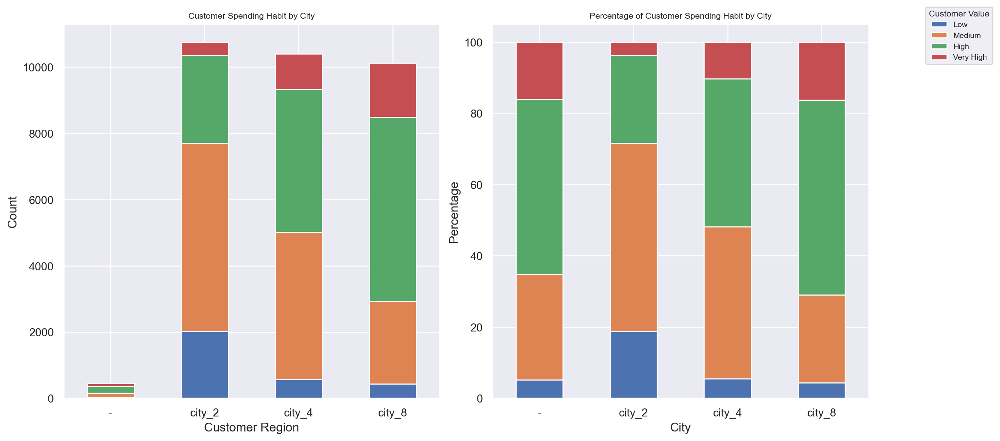

In [651]:
sns.set()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

customer_value_by_region = customers_eda.groupby(['city', 'spending_habit'], observed=False).size().unstack()
customer_value_by_region_proportions = customer_value_by_region.div(customer_value_by_region.sum(axis=1), axis=0) * 100

customer_value_by_region.plot(kind='bar', stacked=True, ax = ax1, legend=False)
ax1.set_title("Customer Spending Habit by City")
ax1.set_xlabel("Customer Region")
ax1.set_ylabel("Count")
ax1.tick_params(axis='x', rotation=0)

customer_value_by_region_proportions.plot(kind='bar', stacked=True, ax = ax2, legend=False)
ax2.set_title("Percentage of Customer Spending Habit by City")
ax2.set_xlabel("City")
ax2.set_ylabel("Percentage")
ax2.tick_params(axis='x', rotation=0)


handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, title="Customer Value", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

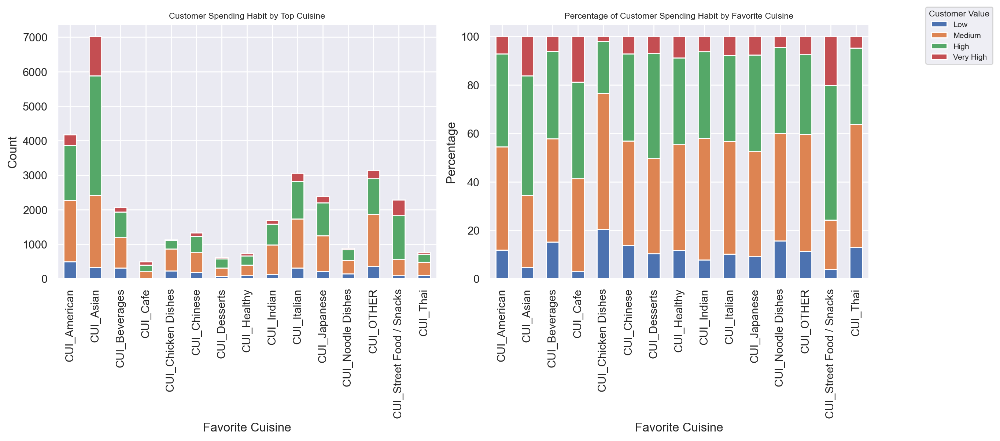

In [652]:
sns.set()
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
sns.set(font_scale=0.7)

customer_value_by_favorite_cuisine = customers_eda.groupby(['top_cuisine', 'spending_habit'], observed=False).size().unstack()
customer_value_by_favorite_cuisine_proportions = customer_value_by_favorite_cuisine.div(customer_value_by_favorite_cuisine.sum(axis=1), axis=0) * 100

customer_value_by_favorite_cuisine.plot(kind='bar', stacked=True, ax = ax1, legend=False)
ax1.set_title("Customer Spending Habit by Top Cuisine")
ax1.set_xlabel("Favorite Cuisine")
ax1.set_ylabel("Count")

customer_value_by_favorite_cuisine_proportions.plot(kind='bar', stacked=True, ax = ax2, legend=False)
ax2.set_title("Percentage of Customer Spending Habit by Favorite Cuisine")
ax2.set_xlabel("Favorite Cuisine")
ax2.set_ylabel("Percentage")

handles, labels = ax2.get_legend_handles_labels()
fig.legend(handles, labels, title="Customer Value", bbox_to_anchor=(1.05, 1), loc='upper left')

plt.tight_layout()
plt.show()

<a class="anchor" id="chapter2"></a>

# 2. Data Preprocessing

</a>

<a class="anchor" id="sub-section-2_1"></a>

## 2.1. Coherence Fix

</a>

From the exploratory data analysis, we have found the following inconsistencies which we now have to deal with:
- Inconsistency between the sum of days column and hour coloumn -- these should be the same
- 18 cases where product_count is 0 but vendor_count is superior to 0
- 138 cases where a profile is created but no info
- Do we have any others?

**Inconsistency between hours of the day and day of the week**

In [653]:
# Create a copy of the dataset 
customers_days_hour_check = customers.copy()

In [654]:
# Calculate total orders
customers_days_hour_check['sum of orders by week']=customers_days_hour_check[days_columns].sum(axis=1)
customers_days_hour_check['sum of orders by hour']=customers_days_hour_check[hour_columns].sum(axis=1)

# Calculate the difference
difference = customers_days_hour_check['sum of orders by week'] - customers_days_hour_check['sum of orders by hour']

# Find rows with differences
rows_with_difference = customers_days_hour_check[difference != 0]
rows_with_difference

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,sum of orders by week,sum of orders by hour
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
ae38da6386,8670,21.0,2,3,1,0.0,7,DELIVERY,DIGI,0.00,23.70,0.0,0.0,0.0,12.08,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,2,NaN,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,2,1.0
a21a839c77,4140,19.0,1,4,4,0.0,21,-,CARD,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,22.09,0.0,0,0,0,0,0,0,4,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,4,3.0
9237d23413,8670,22.0,3,4,2,0.0,27,-,CARD,5.77,17.76,5.9,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,1,0,0,0,1,2,NaN,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,4,3.0
8c6ffd7357,4660,25.0,3,4,1,0.0,28,-,CARD,27.54,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.10,0.0,0.0,0.0,0.00,0.0,0,0,0,0,0,0,3,NaN,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,3,2.0
67c6c9f9c4,4660,24.0,1,3,0,0.0,36,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,6.14,0.0,0.0,0.0,0.00,0.0,1,0,1,0,0,0,1,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,3,2.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37b72b449d,2360,23.0,1,4,0,85.0,85,DELIVERY,DIGI,0.00,24.08,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,1,0,0,0,0,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0.0
ac382ddfd1,-,28.0,1,2,2,87.0,89,DELIVERY,CARD,0.00,17.87,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,1,0,1,0,0,NaN,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,2,1.0
96f1fc25e3,8670,25.0,2,2,1,88.0,88,DELIVERY,CASH,0.00,17.98,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.00,0.0,0,0,0,2,0,0,0,NaN,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,1.0


In [655]:
# Input the difference in HR_0 and make the changes to customers data frame
# This will also deal with missing values for HR_0
customers_days_hour_check['HR_0'] = customers_days_hour_check['HR_0'].fillna(difference)
customers['HR_0'] = customers_days_hour_check['HR_0']

In [656]:
# Check the total sums for validation
hr_column_sums = customers[hour_columns].sum()
days_column_sums = customers[days_columns].sum()
check = hr_column_sums.sum() - days_column_sums.sum()
print("Check after HR_0 modification:", check)

Check after HR_0 modification: 0.0


**Inconsistency with product count**

In [657]:
customers_eda[(customers_eda['product_count']==0) & (customers_eda['vendor_count']>0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,age_group,vendor_diversity,active_period,total_spent,spending_habit,top_cuisine,total_number_of_orders,start_week,mid_week,end_week,night,morning,midday,afternoon,evening,city,promo_used
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
aed85972bb,4660,27.0,1,0,0,6.0,6,DISCOUNT,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,2.56,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,Young Adults (20-29),NaN,0.0,2.56,Low,CUI_Italian,1,0,0,1,0,0,0,0,1,city_4,YES
b2ebe2e6e0,4660,43.0,1,0,0,6.0,6,-,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,6.74,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Middle-Aged (40-49),NaN,0.0,6.74,Medium,CUI_Italian,1,0,0,1,0,0,1,0,0,city_4,NO
6f723d9894,4660,36.0,1,0,0,13.0,13,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,7.77,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN,0.0,7.77,Medium,CUI_Italian,1,0,0,1,0,0,1,0,0,city_4,YES
9d74f2ac81,4660,27.0,1,0,0,19.0,19,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,19.03,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,Young Adults (20-29),NaN,0.0,19.03,Medium,CUI_Indian,1,0,1,0,0,0,0,1,0,city_4,YES
27b7eed8fa,4660,35.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,4.94,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,Adults (30-39),NaN,0.0,4.94,Low,CUI_Italian,1,0,0,1,0,0,0,1,0,city_4,YES
6c9e68b2e7,4660,22.0,1,0,0,20.0,20,DISCOUNT,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.0,0.0,22.24,0.0,0.0,0,0,0,0,0,1,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,Young Adults (20-29),NaN,0.0,22.24,Medium,CUI_OTHER,1,0,0,1,0,0,0,1,0,city_4,YES
c0b330c4df,4660,27.0,1,0,0,23.0,23,DELIVERY,CARD,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,14.42,0.0,0.0,0.00,0.0,0.0,0,1,0,0,0,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,Young Adults (20-29),NaN,0.0,14.42,Medium,CUI_Italian,1,1,0,0,0,0,1,0,0,city_4,YES
68c4faeecb,4660,25.0,1,0,0,26.0,26,FREEBIE,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,12.75,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,Young Adults (20-29),NaN,0.0,12.75,Medium,CUI_Italian,1,0,1,0,0,0,0,0,1,city_4,YES
48e8abd5bf,4660,34.0,1,0,0,33.0,33,DELIVERY,CASH,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,6.52,0.00,0.0,0.0,0.00,0.0,0.0,0,0,0,0,1,0,0,0.0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,Adults (30-39),NaN,0.0,6.52,Low,CUI_Indian,1,0,1,0,0,1,0,0,0,city_4,YES


As mentionned earlier, these customers are all in the same region, have a vendor count of 1, but also have an active period of 0 (i.e. meaning that their first order was also their last one) and have a total number of orders equal to 1. Thus, we can assume that product count is 1 for these cases and we will change it accordingly.

In [658]:
customers.loc[(customers['product_count'] == 0) & (customers['vendor_count'] > 0), 'product_count'] = 1

In [659]:
# Check that the rows that meet the condition are changed
customers[(customers['product_count']==0) & (customers['vendor_count']>0)]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


**Cases with no activity**

For these customers, we will just remove them from the dataframe (not permanently delete) and perhaps use them at a later stage in the project. In order to identify these 138 cases, we will use vendor_count when it is equal to 0 and use as a reference to identify the cases.

In [660]:
# We will use this data frame for the next steps in preprocessing
customers = customers.copy()

In [661]:
customers = customers[customers['vendor_count'] != 0]

In [662]:
# Check if the rows have been removed 
customers[customers['vendor_count']==0]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


<a class="anchor" id="sub-section-2_2"></a>

## 2.2. Feature Engineering

</a>

<a class="anchor" id="sub-section-2_2_1">

### 2.2.1. Features from EDA
    
</a>

In [663]:
customers_eda.columns 

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'age_group',
       'vendor_diversity', 'active_period', 'total_spent', 'spending_habit',
       'top_cuisine', 'total_number_of_orders', 'start_week', 'mid_week',
       'end_week', 'night', 'morning', 'midday', 'afternoon', 'evening',
       'city', 'promo_used'],
      dt

Throught out the analysis of the variables, the columns below have been added to the customers_eda dataframe:
- 'age_group': categorise custumers into groups - teenagers, young adults, adults, middle-aged, older adults, senior
- 'vendor_diversity': categorise diversity in vendor choice - low diversity, moderate diversity, high diversity
- 'active_period': calculate the number of active days for each customer (i.e. the difference between last_order and first_order)
- 'total_spent': total spending for each customer across different cuisine types based on cuisine types
- 'spending_habit'
- 'top_cuisine': cuisine type on which each customer spends the most money most
- 'total_number_of_orders': total number of orders placed by each customer during the week, but this variable had an inconsistency, which is now valid
- 'start_week', 'mid_week', 'end_week'
- 'night', 'morning', 'midday', 'afternoon', 'evening'
- 'city': classifies each region code into 3 cities based on the number the code starts with
- 'promo_used': indicates if any type of promotion was used in the last order

Some of the features created may not be useful for segmentation, but rather be useful for customer profiling later on. We will add all the features deemed interesting for our segmentation to customers. We will also add the ones that we will use for profiling.

**Features for segmentation**

In [664]:
# Rename 'total_spent' to 'monetary' for better comprehension
customers["monetary"] = customers[cuisine_columns].sum(axis=1)

# Rename 'total_number_of_orders' to 'frequency' for better comprehension
customers["frequency"] = customers[days_columns].sum(axis=1)

# Rename 'active_period' to 'active_time_in_days' 
customers["active_time_in_days"] = customers["last_order"] - customers["first_order"]

**Features for profiling**

In [665]:
# age_group
customers["age_group"] = pd.cut(customers["customer_age"], bins=age_bins, labels=age_labels)

# top_cuisine
customers['top_cuisine'] = customers[cuisine_columns].idxmax(axis=1)

# city
customers["city"] = customers["customer_region"].map(city_mapping)

# promo_used
customers["promo_used"] = customers["last_promo"].map(last_promo_mapping)

<a class="anchor" id="sub-section-2_2_2">

### 2.2.2. Creating New Features
    
</a>

**Features for segmentation**

In [666]:
# The dataset has 90 days of data so we will use 90 as the reference date to calculate recency
customers["recency"] = 90 - customers["last_order"]

# Calculate cuisine variety to see how many different types of cuisines a customer has ordered from
customers['cuisine_variety'] = (customers[cuisine_columns] > 0).sum(axis=1)

# Create an order diversity feature that calculates the ratio of unique vendors to unique products 
customers['order_diversity'] = customers['vendor_count'] / customers['product_count']

In [667]:
# Get active time in weeks 
customers['active_time_in_weeks'] = customers['active_time_in_days'] / 7

# Handle cases where active time is zero (e.g., customers who made only one order)
customers['active_time_in_weeks'] = customers['active_time_in_weeks'].replace(0, 1)

# Calculate Order Frequency per Week
customers['order_frequency_per_week'] = customers['product_count'] / customers['active_time_in_weeks']

In [668]:
# REMOVE ?????
# Calculate the number of non-chain orders
#customers['non_chain_orders'] = customers['frequency'] - customers['is_chain']

**Features for profiling**

In [669]:
# Calculate the proportion of spending in each cuisine
for cuisine in cuisine_columns:
    customers[cuisine + "_percentage"] = customers[cuisine] / customers["monetary"] * 100

# Store CUI proportions in variable for later
cui_features = [f'{col}_percentage' for col in cuisine_columns]

In [670]:
dow_columns = ['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']

# Find preferred day by getting the column name with the highest value from dow_columns using idmax()
customers['preferred_day'] = customers[dow_columns].idxmax(axis=1)

day_mapping = {'DOW_0': 'Sunday', 
               'DOW_1': 'Monday',
               'DOW_2': 'Tuesday',
               'DOW_3': 'Wednesday',
               'DOW_4': 'Thursday',
               'DOW_5': 'Friday',
               'DOW_6': 'Saturday'}

# Change the preferred_day column to the actual day names
customers['preferred_day'] = customers['preferred_day'].map(day_mapping)

In [671]:
hour_columns = [f'HR_{i}' for i in range(24)]

# Find the preferred hour by getting the column name with the highest value from hour_columns using idmax()
customers['preferred_hour'] = customers[hour_columns].idxmax(axis=1)

# Extract the numerical hour from the column name
customers['preferred_hour'] = customers['preferred_hour'].str.extract(r'HR_(\d+)').astype(int) # Extract the numerical hour from the column name

<a class="anchor" id="sub-section-2_2_3">

### 2.2.3. Visually Exploring Newly Created Features
    
</a>

**Recency**

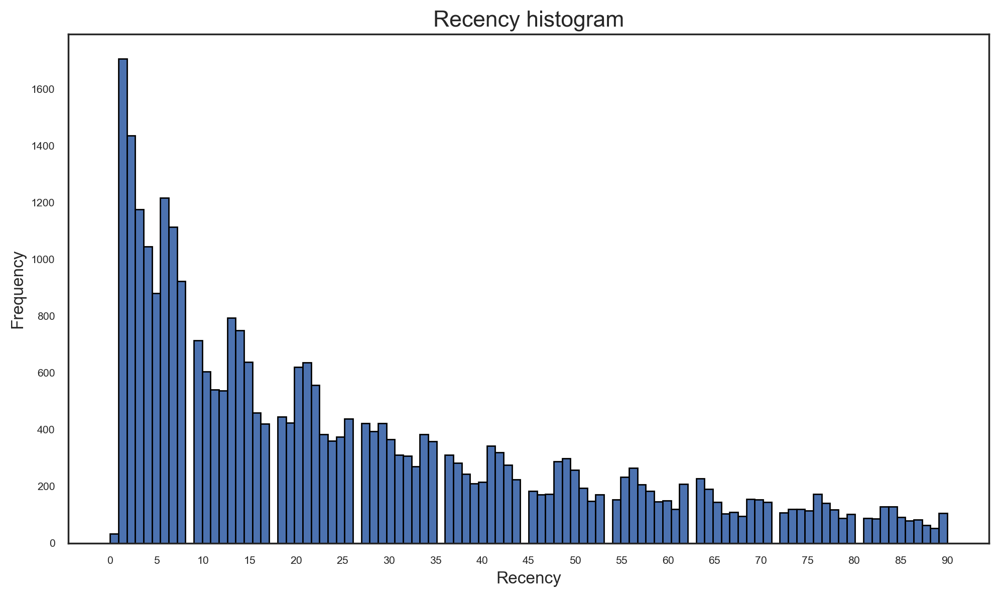

In [672]:
# Plot the histogram for average spending per order
sns.set_style("white")
plt.figure(figsize=(10, 6))

plt.hist(customers['recency'], bins=100, edgecolor="black")

plt.title("Recency histogram", fontsize=16)
plt.xlabel("Recency", fontsize=12)
plt.ylabel("Frequency", fontsize=12)

# create an array of tick positions starting from 0 to the max value of "vendor_count with intervals  of 2
tick_positions = np.arange(0, customers['recency'].max() + 1, 5)
plt.xticks(tick_positions)

plt.tight_layout()  
plt.show()

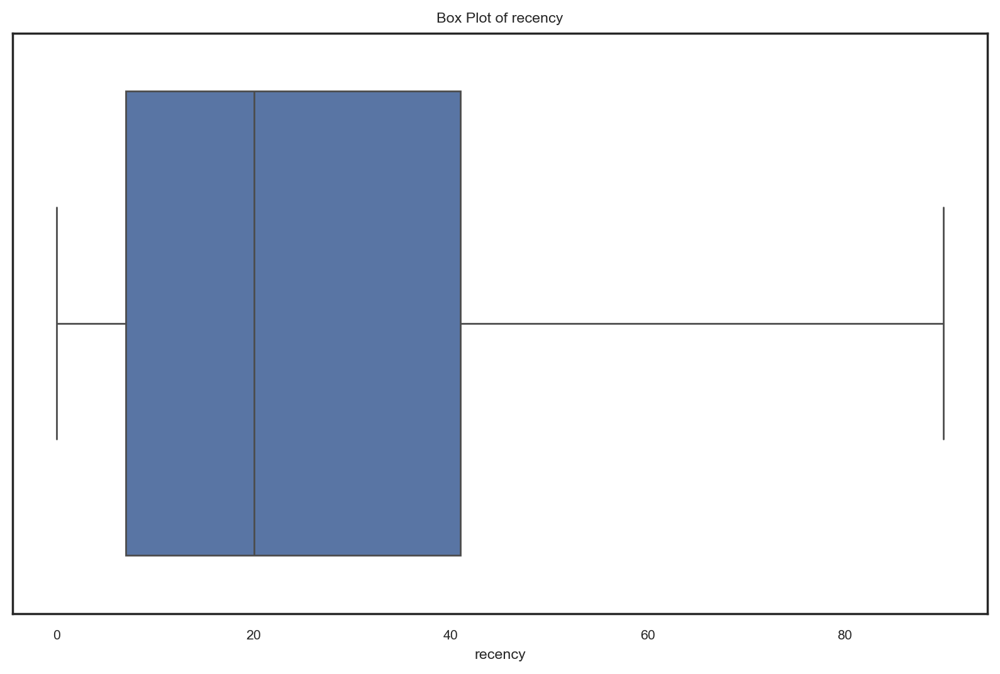

In [673]:
plt.figure(figsize=(10, 6))

sns.boxplot(x=customers['recency'])
plt.title("Box Plot of recency")
plt.xlabel("recency")
plt.show()

**Cuisine Variety**

This feature gets the number of cuisine a customer has spent on. Customers with high cuisine variety are likely to explore different cuisines or diverse eaters. The ones with low cuisine varieties might have a strong prefernce, making them a bit more predictable. 

In [674]:
customers['cuisine_variety'].describe()

count    31737.000000
mean         2.285156
std          1.480498
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         13.000000
Name: cuisine_variety, dtype: float64

In [675]:
customers['cuisine_variety'].value_counts()

cuisine_variety
1     11587
2      9804
3      5177
4      2564
5      1266
6       677
7       359
8       177
9        68
10       34
11       20
12        3
13        1
Name: count, dtype: int64

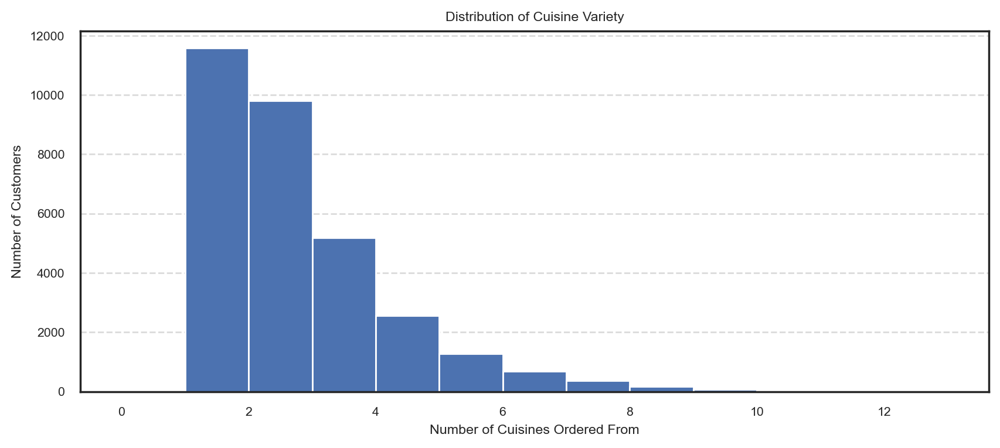

In [676]:
plt.figure(figsize=(10, 4))
plt.hist(customers['cuisine_variety'], bins=range(customers['cuisine_variety'].max() + 1))
plt.title('Distribution of Cuisine Variety')
plt.xlabel('Number of Cuisines Ordered From')
plt.ylabel('Number of Customers')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

**Order Diversity Index**

Here, a high value indicates that the customer has relatively few items from each vendor and tend to spread their orders across multiple vendors. A lower value indicates indicates that a customer orders many orders over fewer vendors.

**Order Frequency per Week**

The Order Frequency per Week metric will help identify:

- Frequent buyers: Customers with high weekly engagement.
- Infrequent buyers: Customers with sporadic engagement.

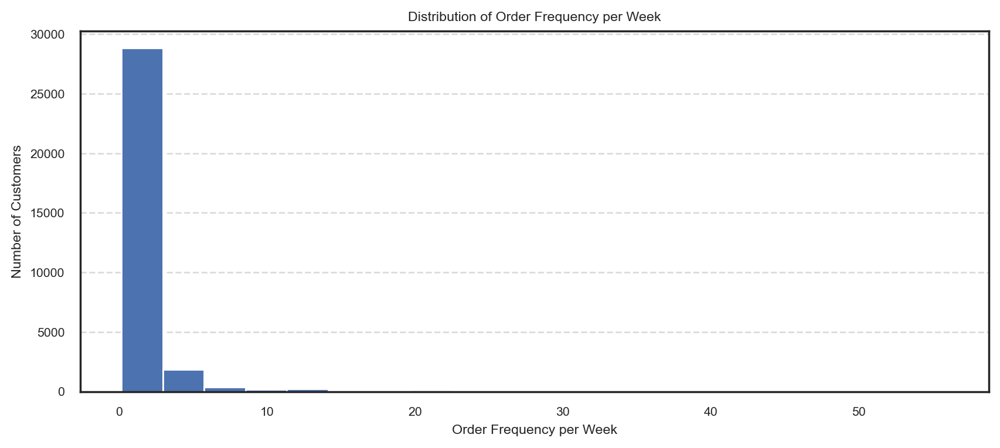

In [677]:
# Plot a histogram of order frequency per week
plt.figure(figsize=(10, 4))
plt.hist(customers['order_frequency_per_week'], bins=20)
plt.title('Distribution of Order Frequency per Week')
plt.xlabel('Order Frequency per Week')
plt.ylabel('Number of Customers')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

**Preferred day**

In [678]:
customers['preferred_day'].value_counts()

preferred_day
Sunday       6205
Monday       5110
Tuesday      4428
Thursday     4331
Wednesday    4036
Friday       3961
Saturday     3666
Name: count, dtype: int64

**Preferred hour**

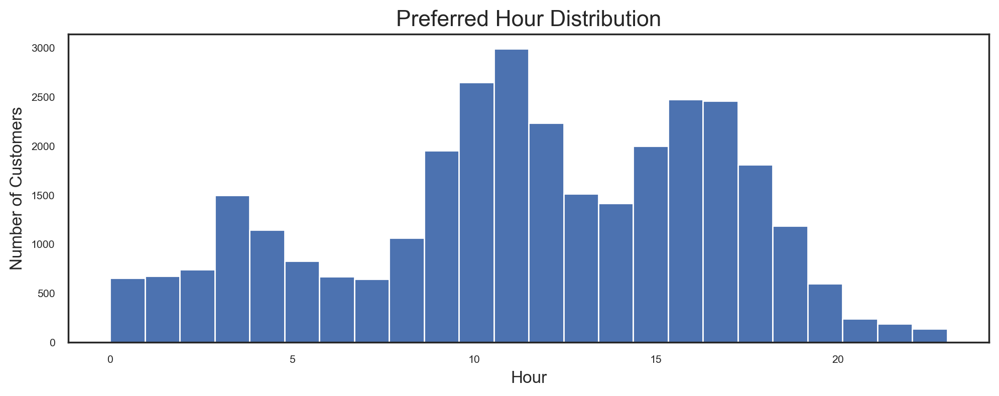

In [679]:
# make a histogram of the preferred hour
plt.figure(figsize=(10, 4))
plt.hist(customers['preferred_hour'], bins=24)
plt.title("Preferred Hour Distribution", fontsize=16)
plt.xlabel("Hour", fontsize=12)
plt.ylabel("Number of Customers", fontsize=12)
plt.tight_layout()
plt.show()

**REMOVE???????**

**Chain & non-chain restaurants**

In order to have a better understanding of non_chain_orders, we can check if chains are preferred or not, or if the preference is balanced. As the below introduces an additional categorical variable which would not be as useful for clustering, we will create a copy of the dataframe.

In [680]:
# Define preference based on the comparison between chain and non-chain orders
#def classify_preference(row):
    #if row['is_chain'] > row['non_chain_orders']:
        #return 'Chain Preferred'
    #elif row['non_chain_orders'] > row['is_chain']:
        #return 'Non-Chain Preferred'
    #else:
        #return 'Balanced'

In [681]:
#customers_chain_preference = customers.copy()

# Apply the function to classify each customer's preference
#customers_chain_preference['chain_preference'] = customers_chain_preference.apply(classify_preference, axis=1)

#sns.set()
#sns.set_style("white")
#plt.figure(figsize=(12, 6))

#chain_preference_count = customers_chain_preference['chain_preference'].value_counts()
#chain_prefernce_percentage = customers_chain_preference['chain_preference'].value_counts(normalize=True) * 100

#chain_preference_count.plot(kind="bar", edgecolor="black")

#for index, (count, percent) in enumerate(zip(chain_preference_count, chain_prefernce_percentage)):
    #plt.text(index, count + 1, f"{count} ({percent:.2f}%)", ha='center', va='bottom', fontsize=10)

#plt.title("Distribution of Customers by Chain Restaurant Preference", fontsize=16)
#plt.xlabel("Chain Preference", fontsize=12)
#plt.ylabel("Customer Count", fontsize=12)
#plt.xticks(rotation=0)
#plt.show()

**Chain restaurant preferences:** Explore if chain vs. non-chain preference impacts spending

In [682]:
# Calculate average and median spending for each preference group
#preference_spending = customers_chain_preference.groupby('chain_preference')['monetary'].agg(['mean', 'median'])
#print("Average and Median Spending by Chain vs. Non-Chain Preference:")
#print(preference_spending)

In [683]:
# Calculate average spending for each preference group
#preference_spending_avg = customers_chain_preference.groupby('chain_preference')['monetary'].mean().reset_index()

# Plot the bar chart
#plt.figure(figsize=(8, 6))
#sns.barplot(x='chain_preference', y='monetary', data=preference_spending_avg)

# Add titles and labels
#plt.title("Average Total Spending by Chain vs. Non-Chain Preference", fontsize=16)
#plt.xlabel("Customer Preference", fontsize=12)
#plt.ylabel("Average Total Spending", fontsize=12)

#plt.show()

Customers who prefer non-chain restaurants have the highest average total spending, followed by those with chain-preferred, while balanced preferences customers show the lowest average spending. This suggests that **non-chain customers may be more willing to spend more per order or have a stronger preference for premium options.**

<a class="anchor" id="sub-section-2_2_4">

### 2.2.4. Dropping Variables
    
</a>

In [684]:
customers.columns

Index(['customer_region', 'customer_age', 'vendor_count', 'product_count',
       'is_chain', 'first_order', 'last_order', 'last_promo', 'payment_method',
       'CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe',
       'CUI_Chicken Dishes', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy',
       'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes',
       'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai', 'DOW_0', 'DOW_1',
       'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6', 'HR_0', 'HR_1', 'HR_2',
       'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
       'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18',
       'HR_19', 'HR_20', 'HR_21', 'HR_22', 'HR_23', 'monetary', 'frequency',
       'active_time_in_days', 'age_group', 'top_cuisine', 'city', 'promo_used',
       'recency', 'cuisine_variety', 'order_diversity', 'active_time_in_weeks',
       'order_frequency_per_week', 'CUI_American_percentage',
       'CUI_Asian_percentage

In [685]:
# Split features for segmentation and profiling features (i.e. numeric and non numeric)
profiling_features = ['customer_region', 'last_promo', 'payment_method', 'age_group', 'top_cuisine', 'city', 
                      'promo_used', 'preferred_day', 'preferred_hour'] # Will need to add cuisine proportions later on
metric_features = [col for col in customers.columns if col not in profiling_features]

# Excluding CUI_, DOW_, and HR_ from metric features
columns_to_exclude = customers.columns[customers.columns.str.startswith('CUI_') | customers.columns.str.startswith('DOW_') | customers.columns.str.startswith('HR_')].tolist()
metric_features = [col for col in metric_features if col not in columns_to_exclude]

In [686]:
print(metric_features)

['customer_age', 'vendor_count', 'product_count', 'is_chain', 'first_order', 'last_order', 'monetary', 'frequency', 'active_time_in_days', 'recency', 'cuisine_variety', 'order_diversity', 'active_time_in_weeks', 'order_frequency_per_week']


In [687]:
# Check relationships between variables with scatter plots (takes a while to run)

# Setting pairplot
#sns.pairplot(customers[metric_features], diag_kind="hist")

# Layout
#plt.subplots_adjust(top=0.95)
#plt.suptitle("Pairwise Relationship of Numerical Variables", fontsize=20)

#plt.tight_layout()
#plt.show()

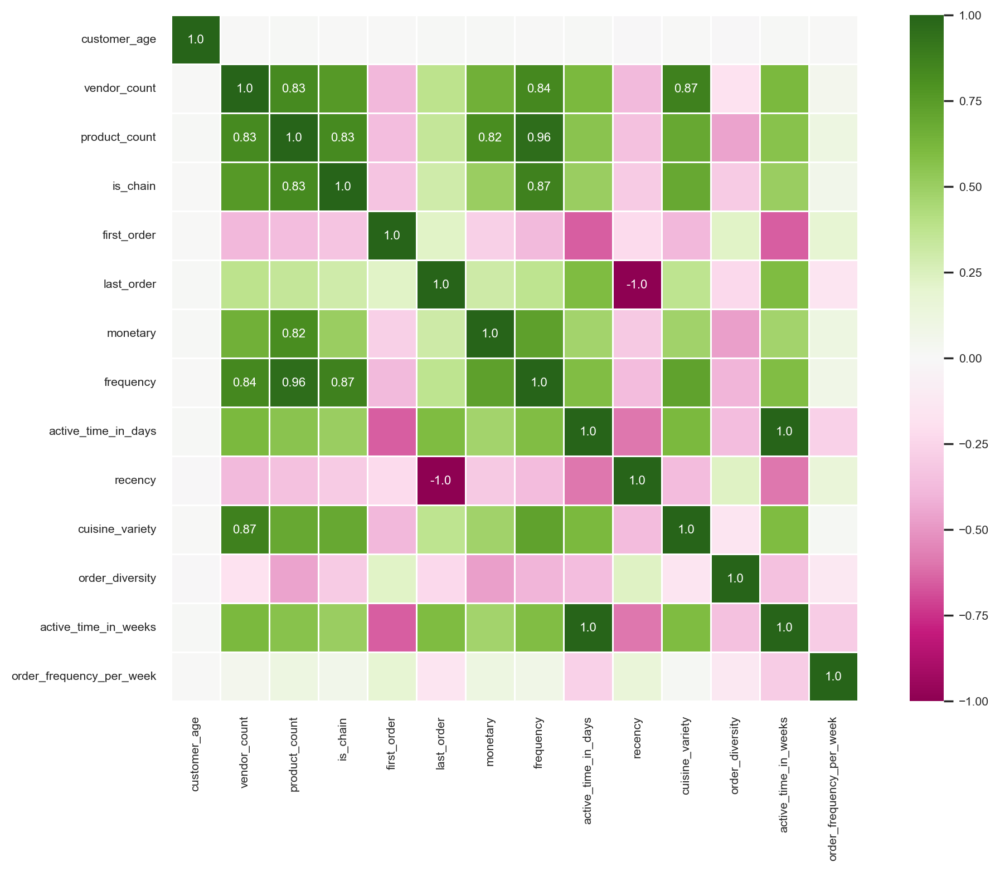

In [688]:
corr = customers[metric_features].corr(method="pearson").round(2)
mask_annot = np.absolute(corr.values) >= 0.8
annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

fig = plt.figure(figsize=(12, 8))

sns.heatmap(data=corr, 
            annot=annot,
            fmt='s',
            vmin=-1, vmax=1, center=0,
            square=True, linewidths=.5,
            cmap='PiYG',
            annot_kws={"size": 8})

plt.show()

When considering which features to keep, we set a threshold to > |0.90| to preserve necessary information from our features. We may lower this threshold if we deem it necessary later on. From the heatmap, we can see that highly correlated features:
- frequency and product_count (0.96)
- last_order and recency (-1)
- active_time_in_weeks and active_time_in_days (1)

From the correlation map, we should drop product_count, last_order, and active_time_in_days. However, as there are still missing values and some features are created using ones containing missing values, we will drop them later.

<a class="anchor" id="sub-section-2_3"></a>

## 2.3. Missing values

</a>

In [689]:
# number of missing values for each column
missing_values = customers.isnull().sum()
missing_values[missing_values>0]

customer_age                727
first_order                 106
active_time_in_days         106
age_group                   727
active_time_in_weeks        106
order_frequency_per_week    106
dtype: int64

<a class="anchor" id="sub-section-2_3_1"></a>

### 2.3.1. customer_age

</a>

The customer_age distribution is skewed, so we will impute the missing values with the median.

In [690]:
customers['customer_age'].median()
print(f'The median to be imputed is {customers["customer_age"].median()}.')

The median to be imputed is 26.0.


In [691]:
customers['customer_age'] = customers['customer_age'].fillna(customers['customer_age'].median())

<a class="anchor" id="sub-section-2_3_2"></a>

### 2.3.2. first_order

</a>

In [692]:
customers[customers["first_order"].isna()]

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,monetary,frequency,active_time_in_days,age_group,top_cuisine,city,promo_used,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week,CUI_American_percentage,CUI_Asian_percentage,CUI_Beverages_percentage,CUI_Cafe_percentage,CUI_Chicken Dishes_percentage,CUI_Chinese_percentage,CUI_Desserts_percentage,CUI_Healthy_percentage,CUI_Indian_percentage,CUI_Italian_percentage,CUI_Japanese_percentage,CUI_Noodle Dishes_percentage,CUI_OTHER_percentage,CUI_Street Food / Snacks_percentage,CUI_Thai_percentage,preferred_day,preferred_hour
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0366fbb035,8670,24.0,1,1,0,NaN,0,-,DIGI,0.00,11.87,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,11.87,1,NaN,Young Adults (20-29),CUI_Asian,city_8,NO,90,1,1.0,NaN,NaN,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,9
039d7c8a20,4660,23.0,1,1,0,NaN,0,DELIVERY,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,0.00,0.0,14.49,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,14.49,1,NaN,Young Adults (20-29),CUI_Indian,city_4,YES,90,1,1.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,16
04c9d25c93,8670,27.0,1,1,1,NaN,0,DISCOUNT,CASH,18.16,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,18.16,1,NaN,Young Adults (20-29),CUI_American,city_8,YES,90,1,1.0,NaN,NaN,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,9
09118ae9e7,8670,36.0,1,1,0,NaN,0,-,CARD,0.00,6.02,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,6.02,1,NaN,Adults (30-39),CUI_Asian,city_8,NO,90,1,1.0,NaN,NaN,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,12
0d1f298bbd,4660,22.0,1,1,1,NaN,0,DISCOUNT,CASH,5.22,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,5.22,1,NaN,Young Adults (20-29),CUI_American,city_4,YES,90,1,1.0,NaN,NaN,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,14
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,8670,30.0,1,1,1,NaN,0,FREEBIE,DIGI,0.00,0.00,18.04,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,18.04,1,NaN,Adults (30-39),CUI_Beverages,city_8,YES,90,1,1.0,NaN,NaN,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,13
f6b6709018,8670,26.0,1,1,0,NaN,0,DELIVERY,DIGI,18.04,0.00,0.00,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,18.04,1,NaN,NaN,CUI_American,city_8,YES,90,1,1.0,NaN,NaN,100.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Saturday,16
f74ad8ce3f,8670,24.0,1,1,1,NaN,0,-,DIGI,0.00,0.00,0.00,0.0,0.0,0.0,17.79,0.0,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0,0,0,0,0,0,1,0.0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,17.79,1,NaN,Young Adults (20-29),CUI_Desserts,city_8,NO,90,1,1.0,NaN,NaN,0.0,0.0,0.0,0.0,0.0,0.0,100.0,0.0,0.0,0.0,0.0,0.0

Since for the columns with first_order missing, the last_order is 0, we will imput 0 to first_order, meaning that tis orders will have been placed on the first day of the period and which also was their last order.

In [693]:
customers['first_order'] = customers['first_order'].fillna(0)

<a class="anchor" id="sub-section-2_3_3"></a>

### 2.3.3. active_time_in_days

</a>

active_time_in_days was created using the first_order column, which at the time had missing values.

We have treated those missing values, so we will drop the column and create it again.

In [694]:
# drop the column created before
customers = customers.drop(columns=['active_time_in_days'], errors='ignore')

# create the column again
customers["active_time_in_days"] = customers["last_order"] - customers["first_order"]

<a class="anchor" id="sub-section-2_3_4"></a>

### 2.3.4. active_time_in_weeks

</a>

active_time_in_weeks was created using the active_time_in_days column, which at the time had missing values.

We have treated those missing values, so we will drop the column and create it again.

In [695]:
# drop the column created before
customers = customers.drop(columns=['active_time_in_weeks'], errors='ignore')

# create the column again
customers["active_time_in_weeks"] = customers['active_time_in_days'] / 7

# Handle cases where active time is zero (e.g., customers who made only one order)
customers['active_time_in_weeks'] = customers['active_time_in_weeks'].replace(0, 1)

<a class="anchor" id="sub-section-2_3_5"></a>

### 2.3.5. order_frequency_per_week

</a>

order_frequency_per_week was created using the active_time_in_weeks column, which at the time had missing values.

We have treated those missing values, so we will drop the column and create it again.

In [696]:
# drop the column created before
customers = customers.drop(columns=['order_frequency_per_week'], errors='ignore')

# create the column again
customers["order_frequency_per_week"] = customers['product_count'] / customers['active_time_in_weeks']

In [697]:
# Dropping features flagged by the correlation matrix
metric_features.remove('last_order')
metric_features.remove('active_time_in_days')
metric_features.remove('product_count')

<a class="anchor" id="sub-section-2_3_6"></a>

### 2.3.6. age_group

</a>

In [698]:
# drop the column created before
customers = customers.drop(columns=['age_group'], errors='ignore')

# age_group
customers["age_group"] = pd.cut(customers["customer_age"], bins=age_bins, labels=age_labels)

In [699]:
# Check if all missing values have been dealt with 
missing_values = customers.isnull().sum()
missing_values[missing_values>0]

Series([], dtype: int64)

<a class="anchor" id="sub-section-2_5"></a>

## 2.5. Outliers

</a>

In [700]:
# Numerical columns to treat outliers
metric_features

['customer_age',
 'vendor_count',
 'is_chain',
 'first_order',
 'monetary',
 'frequency',
 'recency',
 'cuisine_variety',
 'order_diversity',
 'active_time_in_weeks',
 'order_frequency_per_week']

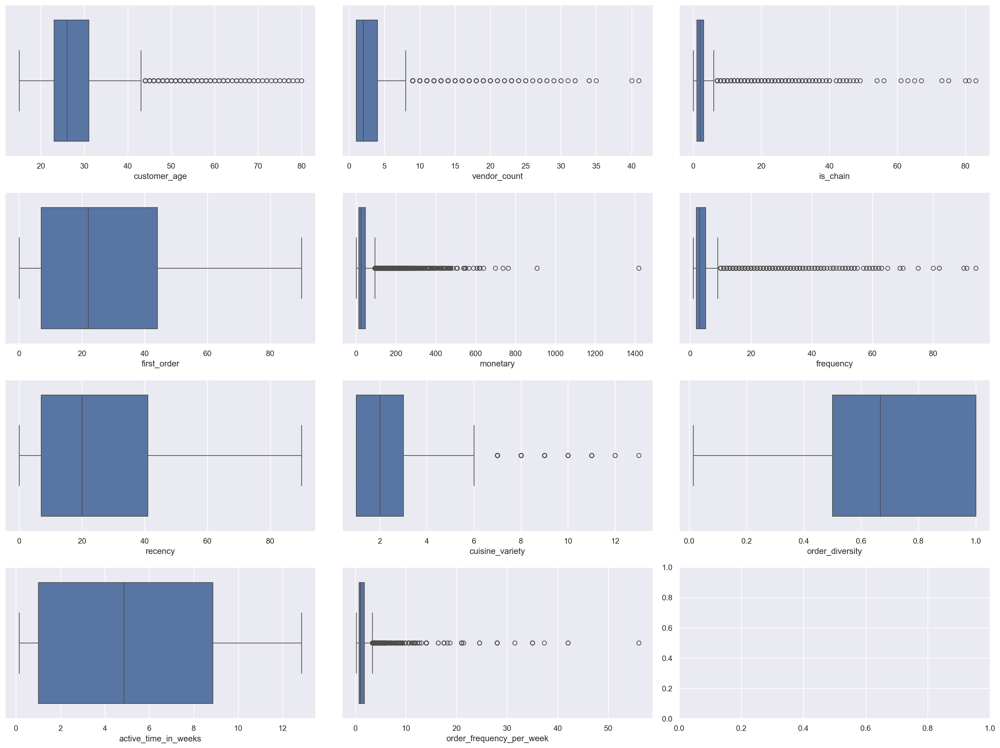

In [701]:
# Plot box plots for all numeric columns

sns.set()
fig, axes = plt.subplots(4, 3, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=customers[feat], ax=ax)

plt.tight_layout()
plt.show()

From the box-plots, we can see extreme outliers in customer_age, vendor_count, is_chain, monetary, frequency, cuisine_variety, and order_frequency_per_week. We will first try using the IQR method and see if it is a good solution.

<a class="anchor" id="sub-section-2_5_1"></a>

### 2.5.1. IQR Method

</a>

In [702]:
# Calculate Q1, Q3 and IQR
q1 = customers[metric_features].quantile(0.25)
q3 = customers[metric_features].quantile(0.75)
iqr = q3 - q1

# Lower & upper limits
lower_lim = q1 - (1.5 * iqr)
upper_lim = q3 + (1.5 * iqr)

In [703]:
filters_iqr = (customers[metric_features] >= lower_lim) & (customers[metric_features] <= upper_lim)
filters_iqr_all = filters_iqr.all(axis=1)

In [704]:
customers_iqr = customers[filters_iqr_all]

In [705]:
print('Percentage of data kept after removing outliers:', 
      100 * (customers_iqr.shape[0] / customers.shape[0]))

Percentage of data kept after removing outliers: 76.21703374610077


Using the IQR method, more than 20% of data would be removed. Using this method is not the feasible and we will try clipping extreme values to get a better distribution and reduce the effect of outliers.

<a class="anchor" id="sub-section-2_5_2"></a>

### 2.5.2. Clipping Outliers

</a>

In [706]:
customers[metric_features].quantile(0.975)

customer_age                 46.000000
vendor_count                 11.000000
is_chain                     13.000000
first_order                  83.000000
monetary                    162.946000
frequency                    18.000000
recency                      82.000000
cuisine_variety               6.000000
order_diversity               1.000000
active_time_in_weeks         12.142857
order_frequency_per_week      7.000000
Name: 0.975, dtype: float64

In [707]:
# Create a copy to check
customers_clipped = customers.copy()

In [708]:
clip_upper = {'customer_age': 46, 'vendor_count': 11, 'is_chain': 13, 'monetary': 162.946, 'frequency': 18, 'cuisine_variety': 6, 'order_frequency_per_week': 7}

In [709]:
for column, upper_value in clip_upper.items():
    customers_clipped[column] = customers_clipped[column].clip(upper=upper_value)

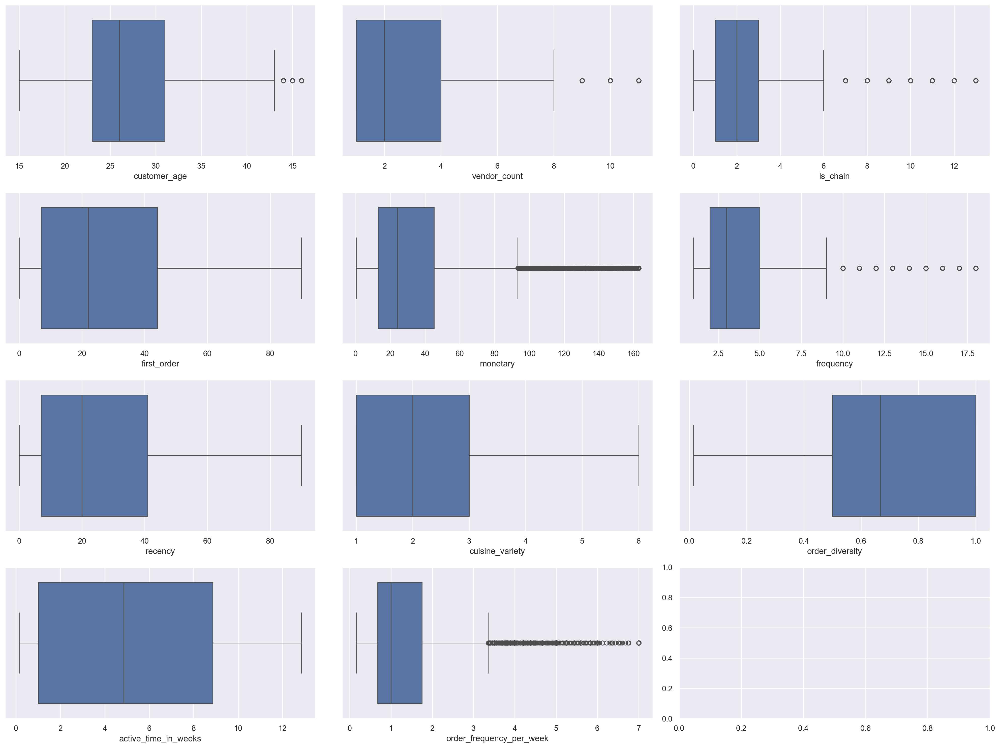

In [710]:
# Plot box plots after outliers are clipped
sns.set()
fig, axes = plt.subplots(4, 3, figsize=(20, 15))

for ax, feat in zip(axes.flatten(), metric_features): 
    sns.boxplot(x=customers_clipped[feat], ax=ax) 

plt.tight_layout()
plt.show()

There are still outliers, but we will use this clipping method.

In [711]:
customers = customers_clipped.copy()

<a class="anchor" id="sub-section-2_6"></a>

## 2.6. Data Normalization

</a>

In [712]:
customers[metric_features].describe().round(2)

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week
count,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00
mean,27.32,3.03,2.65,28.30,36.53,4.17,26.24,2.25,0.69,5.29,1.42
std,6.52,2.35,2.95,24.09,35.76,3.88,23.18,1.35,0.26,3.94,1.30
min,15.00,1.00,0.00,0.00,0.37,1.00,0.00,1.00,0.01,0.14,0.16
25%,23.00,1.00,1.00,7.00,13.02,2.00,7.00,1.00,0.50,1.00,0.68
50%,26.00,2.00,2.00,22.00,24.20,3.00,20.00,2.00,0.67,4.86,1.00
75%,31.00,4.00,3.00,44.00,45.18,5.00,41.00,3.00,1.00,8.86,1.75
max,46.00,11.00,13.00,90.00,162.95,18.00,90.00,6.00,1.00,12.86,7.00


<a class="anchor" id="sub-section-2_6_1"></a>

### 2.6.1. MinMax Scaling

</a>

In [713]:
customers_minmax = customers.copy()

In [714]:
# Use MinMaxScaler to scale the data
mm_scaler = MinMaxScaler()
mm_scaled_feat = mm_scaler.fit_transform(customers_minmax[metric_features])
mm_scaled_feat

array([[0.09677419, 0.1       , 0.07692308, ..., 0.39130435, 0.        ,
        1.        ],
       [0.06451613, 0.1       , 0.15384615, ..., 1.        , 0.        ,
        1.        ],
       [0.74193548, 0.        , 0.15384615, ..., 0.49275362, 0.        ,
        1.        ],
       ...,
       [0.29032258, 0.        , 0.07692308, ..., 1.        , 0.06741573,
        0.12292359],
       [0.61290323, 0.        , 0.        , ..., 1.        , 0.06741573,
        0.12292359],
       [0.48387097, 0.        , 0.        , ..., 1.        , 0.06741573,
        0.12292359]])

In [715]:
# See what the fit method is doing
print("Parameters fitted:\n")
pd.DataFrame([mm_scaler.data_min_, mm_scaler.data_max_], columns=metric_features, index=['min','max'])

Parameters fitted:



,customer_age,vendor_count,is_chain,first_order,monetary,frequency,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week
min,15.0,1.0,0.0,0.0,0.370,1.0,0.0,1.0,0.014286,0.142857,0.159091
max,46.0,11.0,13.0,90.0,162.946,18.0,90.0,6.0,1.000000,12.857143,7.000000


In [716]:
# Replace original metric_features values with mm_scaled_feat values
customers_minmax[metric_features] = mm_scaled_feat

In [717]:
# Checking max and min of minmaxed variables
customers_minmax[metric_features].describe().round(2)

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week
count,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00
mean,0.40,0.20,0.20,0.31,0.22,0.19,0.29,0.25,0.69,0.40,0.18
std,0.21,0.24,0.23,0.27,0.22,0.23,0.26,0.27,0.26,0.31,0.19
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,0.26,0.00,0.08,0.08,0.08,0.06,0.08,0.00,0.49,0.07,0.08
50%,0.35,0.10,0.15,0.24,0.15,0.12,0.22,0.20,0.66,0.37,0.12
75%,0.52,0.30,0.23,0.49,0.28,0.24,0.46,0.40,1.00,0.69,0.23
max,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00


<a class="anchor" id="sub-section-2_6_2"></a>

### 2.6.2. Standard Scaling

</a>

In [718]:
customers_standard = customers.copy()

In [719]:
ss_scaler = StandardScaler()
ss_scaled_feat = ss_scaler.fit_transform(customers_standard[metric_features])
ss_scaled_feat

array([[-1.43009564, -0.43710527, -0.55781328, ..., -1.13389849,
        -1.3055894 ,  4.29992588],
       [-1.58349417, -0.43710527, -0.21890944, ...,  1.18545401,
        -1.3055894 ,  4.29992588],
       [ 1.63787508, -0.86205273, -0.21890944, ..., -0.74733974,
        -1.3055894 ,  4.29992588],
       ...,
       [-0.50970442, -0.86205273, -0.55781328, ...,  1.18545401,
        -1.08816472, -0.31996637],
       [ 1.02428094, -0.86205273, -0.89671712, ...,  1.18545401,
        -1.08816472, -0.31996637],
       [ 0.41068679, -0.86205273, -0.89671712, ...,  1.18545401,
        -1.08816472, -0.31996637]])

In [720]:
# See what the fit method is doing
print("Parameters fitted:\n")
pd.DataFrame([ss_scaler.mean_, np.sqrt(ss_scaler.var_)], columns=metric_features, index=['mean','std'])

Parameters fitted:



,customer_age,vendor_count,is_chain,first_order,monetary,frequency,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week
mean,27.322746,3.028610,2.645934,28.304440,36.525607,4.168132,26.244951,2.248039,0.693331,5.289819,1.415550
std,6.518967,2.353232,2.950689,24.088112,35.754642,3.877707,23.181599,1.350522,0.258693,3.942252,1.298732


In [721]:
customers_standard[metric_features] = ss_scaled_feat
customers_standard[metric_features].head()

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week
customer_id,,,,,,,,,,,
1b8f824d5e,-1.430096,-0.437105,-0.557813,-1.175038,-0.213835,-0.559127,2.707106,-0.924116,-1.133898,-1.305589,4.299926
5d272b9dcb,-1.583494,-0.437105,-0.218909,-1.175038,-0.484290,-0.559127,2.707106,-0.183661,1.185454,-1.305589,4.299926
f6d1b2ba63,1.637875,-0.862053,-0.218909,-1.175038,-0.764253,-0.559127,2.707106,-0.924116,-0.747340,-1.305589,4.299926
180c632ed8,-0.202907,-0.437105,-0.557813,-1.175038,-0.138880,-0.559127,2.663969,-0.183661,-0.103075,-1.269352,4.299926
4eb37a6705,-1.123299,-0.437105,-0.896717,-1.175038,0.529005,-0.559127,2.663969,-0.183661,-1.133898,-1.269352,4.299926


In [722]:
customers_standard[metric_features].describe().round(2)

,customer_age,vendor_count,is_chain,first_order,monetary,frequency,recency,cuisine_variety,order_diversity,active_time_in_weeks,order_frequency_per_week
count,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00,31737.00
mean,0.00,-0.00,0.00,0.00,-0.00,0.00,0.00,0.00,-0.00,-0.00,0.00
std,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00,1.00
min,-1.89,-0.86,-0.90,-1.18,-1.01,-0.82,-1.13,-0.92,-2.62,-1.31,-0.97
25%,-0.66,-0.86,-0.56,-0.88,-0.66,-0.56,-0.83,-0.92,-0.75,-1.09,-0.57
50%,-0.20,-0.44,-0.22,-0.26,-0.34,-0.30,-0.27,-0.18,-0.10,-0.11,-0.32
75%,0.56,0.41,0.12,0.65,0.24,0.21,0.64,0.56,1.19,0.90,0.26
max,2.87,3.39,3.51,2.56,3.54,3.57,2.75,2.78,1.19,1.92,4.30


<a class="anchor" id="sub-section-2_6_3"></a>

### 2.6.3. Comparing MinMax and Standard Scaling

</a>

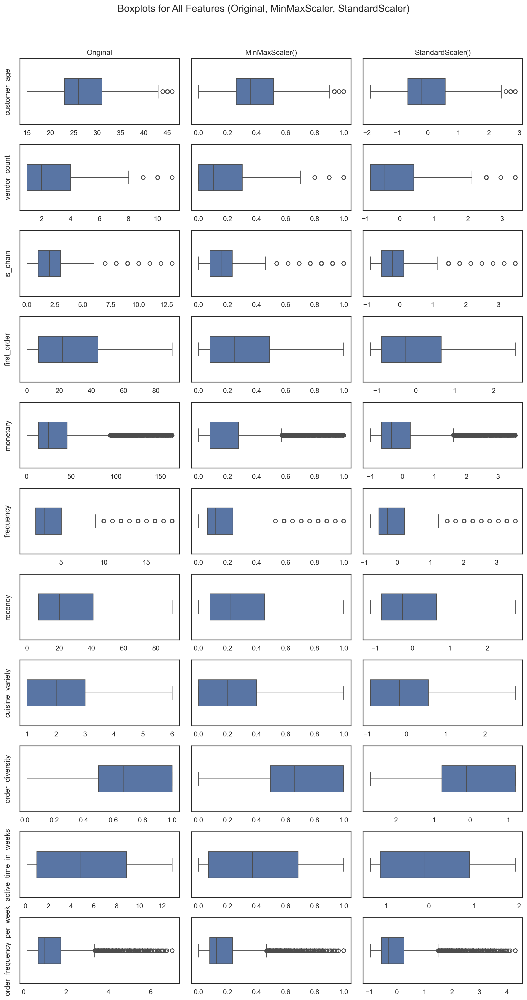

In [723]:
# Plotting boxplots for all features for original, MinMaxScaler, and StandardScaler
sns.set_style('white')

fig, axes = plt.subplots(len(metric_features), 3, figsize=(12, 2 * len(metric_features)), tight_layout=True)

for idx, feature in enumerate(metric_features):
    # Original
    sns.boxplot(customers, x=feature, ax=axes[idx][0], width=.4)
    # Only have the title on the first row
    axes[idx][0].set_title('Original' if idx == 0 else "")  
    axes[idx][0].set_ylabel(feature)

    # MinMax Scaled
    sns.boxplot(customers_minmax, x=feature, ax=axes[idx][1], width=.4)
    axes[idx][1].set_title('MinMaxScaler()' if idx == 0 else "")

    # Standard Scaled
    sns.boxplot(customers_standard, x=feature, ax=axes[idx][2], width=.4)
    axes[idx][2].set_title('StandardScaler()' if idx == 0 else "")

# Remove x-axis labels
for ax in axes.flat:
    ax.set_xlabel(None)

fig.suptitle('Boxplots for All Features (Original, MinMaxScaler, StandardScaler)', fontsize=16, y=1.02)

plt.show()

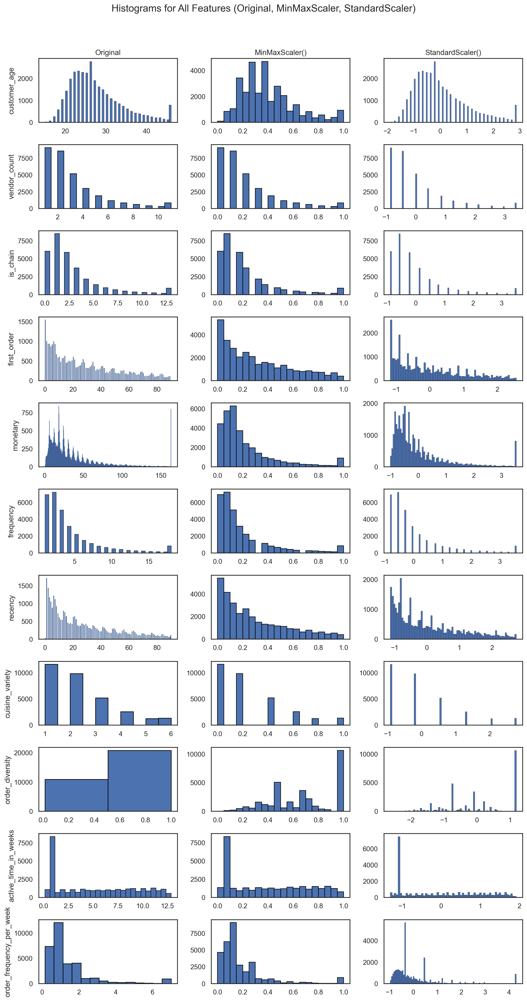

In [724]:
# Plotting histograms for all features for original, MinMaxScaler, and StandardScaler
# Same code, but this time it is adjusted for histograms
sns.set_style('white')

fig, axes = plt.subplots(len(metric_features), 3, figsize=(12, 2 * len(metric_features)), tight_layout=True)

for idx, feature in enumerate(metric_features):
    # Original
    sns.histplot(customers[feature], ax=axes[idx][0], binwidth=0.5, edgecolor="black", alpha = 1)
    axes[idx][0].set_title('Original' if idx == 0 else "")
    axes[idx][0].set_ylabel(feature)

    # MinMax Scaled
    sns.histplot(customers_minmax[feature], ax=axes[idx][1],binwidth=0.05, edgecolor="black", alpha = 1)
    axes[idx][1].set_title('MinMaxScaler()' if idx == 0 else "")
    axes[idx][1].set_ylabel("")

    # Standard Scaled
    sns.histplot(customers_standard[feature], ax=axes[idx][2], binwidth=0.05, edgecolor="black", alpha = 1)
    axes[idx][2].set_title('StandardScaler()' if idx == 0 else "")
    axes[idx][2].set_ylabel("")

# Remove x-axis labels
for ax in axes.flat:
    ax.set_xlabel(None)

fig.suptitle('Histograms for All Features (Original, MinMaxScaler, StandardScaler)', fontsize=16, y=1.02)

plt.show()

As there are still outliers present in our dataset and some features are skewed, standard scaling may be the better option because it preserves the shape of the distribution and normalizes features relative to their standard deviation (i.e., to have a standard deviation of 1).

In [725]:
# Create a copy of unscaled data to use for interpretability of clusters
customers_unscaled = customers.copy()

In [726]:
customers = customers_standard.copy()

<a class="anchor" id="sub-section-2_7"></a>

## 2.7. Encoding Profiling Features

</a>

In [727]:
profiling_features.remove('customer_region')
profiling_features.remove('last_promo')
print(profiling_features)

['payment_method', 'age_group', 'top_cuisine', 'city', 'promo_used', 'preferred_day', 'preferred_hour']


In [728]:
customers_ohc = customers[profiling_features].copy()
customers_ohc.head()

,payment_method,age_group,top_cuisine,city,promo_used,preferred_day,preferred_hour
customer_id,,,,,,,
1b8f824d5e,DIGI,Teenagers (15-19),CUI_Indian,city_2,YES,Sunday,18
5d272b9dcb,DIGI,Teenagers (15-19),CUI_American,city_8,YES,Sunday,10
f6d1b2ba63,CASH,Adults (30-39),CUI_American,city_4,YES,Sunday,9
180c632ed8,DIGI,Young Adults (20-29),CUI_Indian,city_4,YES,Monday,11
4eb37a6705,DIGI,Young Adults (20-29),CUI_Asian,city_4,NO,Monday,8


In [729]:
# Use OneHotEncoder to encode the categorical features. Get feature names and create a DataFrame 
# with the one-hot encoded categorical features (pass feature names)
ohc = OneHotEncoder(sparse_output=False, drop=None)
ohc_feat = ohc.fit_transform(customers_ohc)
ohc_feat_names = ohc.get_feature_names_out(customers_ohc.columns)

In [730]:
ohc_df = pd.DataFrame(ohc_feat, index=customers_ohc.index, columns=ohc_feat_names)
ohc_df

,payment_method_CARD,payment_method_CASH,payment_method_DIGI,age_group_Adults (30-39),age_group_Middle-Aged (40-49),age_group_Older Adults (50-59),age_group_Seniors (60+),age_group_Teenagers (15-19),age_group_Young Adults (20-29),top_cuisine_CUI_American,top_cuisine_CUI_Asian,top_cuisine_CUI_Beverages,top_cuisine_CUI_Cafe,top_cuisine_CUI_Chicken Dishes,top_cuisine_CUI_Chinese,top_cuisine_CUI_Desserts,top_cuisine_CUI_Healthy,top_cuisine_CUI_Indian,top_cuisine_CUI_Italian,top_cuisine_CUI_Japanese,top_cuisine_CUI_Noodle Dishes,top_cuisine_CUI_OTHER,top_cuisine_CUI_Street Food / Snacks,top_cuisine_CUI_Thai,city_-,city_city_2,city_city_4,city_city_8,promo_used_NO,promo_used_YES,preferred_day_Friday,preferred_day_Monday,preferred_day_Saturday,preferred_day_Sunday,preferred_day_Thursday,preferred_day_Tuesday,preferred_day_Wednesday,preferred_hour_0,preferred_hour_1,preferred_hour_2,preferred_hour_3,preferred_hour_4,preferred_hour_5,preferred_hour_6,preferred_hour_7,preferred_hour_8,preferred_hour_9,preferred_hour_10,preferred_hour_11,preferred_hour_12,preferred_hour_13,preferred_hour_14,preferred_hour_15,preferred_hour_16,preferred_hour_17,preferred_hour_18,preferred_hour_19,preferred_hour_20,preferred_hour_21,preferred_hour_22,preferred_hour_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5d272b9dcb,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f6d1b2ba63,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
180c632ed8,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4eb37a6705,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
f4e366c281,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f6b6709018,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f74ad8ce3f,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [731]:
# Reassigning df to contain ohc variables
customers_ohc = pd.concat([customers_ohc, ohc_df], axis=1)
customers_ohc.head()

,payment_method,age_group,top_cuisine,city,promo_used,preferred_day,preferred_hour,payment_method_CARD,payment_method_CASH,payment_method_DIGI,age_group_Adults (30-39),age_group_Middle-Aged (40-49),age_group_Older Adults (50-59),age_group_Seniors (60+),age_group_Teenagers (15-19),age_group_Young Adults (20-29),top_cuisine_CUI_American,top_cuisine_CUI_Asian,top_cuisine_CUI_Beverages,top_cuisine_CUI_Cafe,top_cuisine_CUI_Chicken Dishes,top_cuisine_CUI_Chinese,top_cuisine_CUI_Desserts,top_cuisine_CUI_Healthy,top_cuisine_CUI_Indian,top_cuisine_CUI_Italian,top_cuisine_CUI_Japanese,top_cuisine_CUI_Noodle Dishes,top_cuisine_CUI_OTHER,top_cuisine_CUI_Street Food / Snacks,top_cuisine_CUI_Thai,city_-,city_city_2,city_city_4,city_city_8,promo_used_NO,promo_used_YES,preferred_day_Friday,preferred_day_Monday,preferred_day_Saturday,preferred_day_Sunday,preferred_day_Thursday,preferred_day_Tuesday,preferred_day_Wednesday,preferred_hour_0,preferred_hour_1,preferred_hour_2,preferred_hour_3,preferred_hour_4,preferred_hour_5,preferred_hour_6,preferred_hour_7,preferred_hour_8,preferred_hour_9,preferred_hour_10,preferred_hour_11,preferred_hour_12,preferred_hour_13,preferred_hour_14,preferred_hour_15,preferred_hour_16,preferred_hour_17,preferred_hour_18,preferred_hour_19,preferred_hour_20,preferred_hour_21,preferred_hour_22,preferred_hour_23
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,DIGI,Teenagers (15-19),CUI_Indian,city_2,YES,Sunday,18,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
5d272b9dcb,DIGI,Teenagers (15-19),CUI_American,city_8,YES,Sunday,10,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
f6d1b2ba63,CASH,Adults (30-39),CUI_American,city_4,YES,Sunday,9,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
180c632ed8,DIGI,Young Adults (20-29),CUI_Indian,city_4,YES,Monday,11,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4eb37a6705,DIGI,Young Adults (20-29),CUI_Asian,city_4,NO,Monday,8,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<a class="anchor" id="chapter3"></a>

# 3. Customer Segmentation

</a>

In this section, we will segment our customers using two views. First, we are going to adopt an economic value approach to segment customers, using RFM features (i.e. recency, frequency, monetary). Second, we will segment customers using a behaviour-based segmentation approach to identify customers' purchasing patterns. Finally, we will merge these two segmentation approaches to create a set of ultimate clusters. These will provide ABCDEats with actionable insights to develop a data-driven marketing strategy. 

<a class="anchor" id="sub-section-3_1"></a>

## 3.1. Segmentation based on Economic Value

</a>

The primary aim is to understand and categorize customers based on their recent purchases, transaction frequency, and overall spending.
- recency: Days since last purchase.
- frequency: Number of purchases.
- monetary: Total spent.

In [732]:
# Select the features for RFM analysis and create a copy of the dataframe
rfm_features = ['recency', 'frequency', 'monetary']
customers_rfm = customers[rfm_features].copy()

# Add unscaled columns to the RFM dataframe for better interpretability
customers_rfm[['recency_unscaled', 'frequency_unscaled', 'monetary_unscaled']] = customers_unscaled[['recency', 'frequency', 'monetary']]
customers_rfm.head()

,recency,frequency,monetary,recency_unscaled,frequency_unscaled,monetary_unscaled
customer_id,,,,,,
1b8f824d5e,2.707106,-0.559127,-0.213835,89,2,28.88
5d272b9dcb,2.707106,-0.559127,-0.484290,89,2,19.21
f6d1b2ba63,2.707106,-0.559127,-0.764253,89,2,9.20
180c632ed8,2.663969,-0.559127,-0.138880,88,2,31.56
4eb37a6705,2.663969,-0.559127,0.529005,88,2,55.44


**RFM Score Calculation** <br>
First, we will define RFM scores to rank customers in each feature and classify them into groups, using quantile-based scoring. Below is a table that provides a guideline to assign scores (1-4) to each RFM metric for each customer.

| Metric    | Score Interpretation                  |
|-----------|---------------------------------------|
| Recency   | 4 = Very recent, 1 = Long ago         |
| Frequency | 4 = Very frequent, 1 = Rarely orders  |
| Monetary  | 4 = High spender, 1 = Low spender     |

**Move to function file**

In [733]:
# Define quantiles for RFM scores
quantiles = {'recency': customers_rfm['recency'].quantile([0.25, 0.5, 0.75]).to_dict(),
             'frequency': customers_rfm['frequency'].quantile([0.25, 0.5, 0.75]).to_dict(),
             'monetary': customers_rfm['monetary'].quantile([0.25, 0.5, 0.75]).to_dict()}

In [734]:
# Calculate R, F, and M scores using imported functions from functions.py
customers_rfm['R_score'] = customers_rfm['recency'].apply(f.r_score, args=('recency', quantiles))
customers_rfm['F_score'] = customers_rfm['frequency'].apply(f.fm_score, args=('frequency', quantiles))
customers_rfm['M_score'] = customers_rfm['monetary'].apply(f.fm_score, args=('monetary', quantiles))

# Combine R, F, and M scores into a single RFM score
customers_rfm['RFM_score'] = customers_rfm['R_score'].map(str) + customers_rfm['F_score'].map(str) + customers_rfm['M_score'].map(str)

# Display a sample of the dataframe with RFM scores
customers_rfm.sample(10)

,recency,frequency,monetary,recency_unscaled,frequency_unscaled,monetary_unscaled,R_score,F_score,M_score,RFM_score
customer_id,,,,,,,,,,
7ef988f716,0.852187,-0.559127,-0.906892,46,2,4.10,1,1,1,111
36672d83e9,-1.045871,-0.817012,-0.939336,2,1,2.94,4,1,1,411
2d4cc215df,-0.096842,-0.817012,-0.551973,24,1,16.79,2,1,2,212
4070c185d3,0.507085,-0.043359,0.362873,38,4,49.50,2,3,4,234
3fbdd1b095,0.118846,-0.301243,0.012988,29,3,36.99,2,2,3,223
3db6e26b82,1.154150,-0.559127,-0.788306,53,2,8.34,1,1,1,111
f0a96fe6b0,0.161984,-0.043359,-0.335778,30,4,24.52,2,3,3,233
2fe0ea3018,-0.183117,-0.559127,-0.602596,22,2,14.98,2,1,2,212
206af29cfd,-1.089008,-0.559127,-0.573229,1,2,16.03,4,1,2,412


In [735]:
# Group by RFM score and calculate the average recency, frequency, and monetary values
rfm_table = customers_rfm.groupby('RFM_score').agg({'recency_unscaled': 'mean',
                                                    'frequency_unscaled': 'mean',
                                                    'monetary_unscaled': 'mean'}).round(2)
rfm_table.head()

,recency_unscaled,frequency_unscaled,monetary_unscaled
RFM_score,,,
111,63.76,1.28,7.28
112,63.36,1.44,18.24
113,63.02,1.54,31.18
114,61.62,1.61,62.39
121,56.33,3.00,8.99


**RFM Segments** <br>
Secondly, based on the RFM scores assigned to each individual, we can start thinking of different customer segments and provide some recommended actions. This will be useful later to define our economic-based segments, and ultimately, the final clusters.

| **Segment Name**     | **Description**                                                                 | **RFM Score Characteristics**                           | **Recommended Actions**                                                                 |
|-----------------------|---------------------------------------------------------------------------------|--------------------------------------------------------|-----------------------------------------------------------------------------------------|
| **Champions**         | Most valuable customers; frequent, recent, and high spenders.                  | R: High (3-4), <br> F: High (3-4), <br> M: High (3-4)            | Retain with loyalty programs, exclusive deals, or premium services.                    |
| **Loyal Customers**   | Regular customers with good frequency and spending.                            | R: High (3-4), <br> F: High (3-4), <br> M: Moderate to High (3-4) | Provide early access to new products, upsell premium offerings, and maintain loyalty.  |
| **Potential Loyalists** | Recent customers with potential to become loyal if engagement improves.       | R: Moderate to High (3-4), <br> F: Moderate (2-3), <br> M: Moderate (2-3) | Encourage repeat purchases through personalized promotions and discounts.              |
| **At Risk**           | Previously valuable customers who have not purchased recently.                 | R: Low (1-2), <br> F: Moderate to High (2-4), <br> M: Moderate to High (2-4) | Re-engage with win-back campaigns, targeted promotions, or personalized offers.        |
| **Need Attention**    | Moderate recency but low frequency and spending.                               | R: Moderate (2-3), <br> F: Low (1-2), <br> M: Low (1-2)          | Use incentives, discounts, or targeted campaigns to improve engagement and spending.   |
| **Causal Shoppers**   | Infrequent buyers with low spending.                                           | R: Low (1-2), <br> F: Low (1-2), <br> M: Low (1-2)               | Test promotions, bundles, or explore reasons for low engagement.                       |
| **Lost Customers**    | Customers who haven't purchased in a long time and show minimal engagement.    | R: Low (1), <br> F: Low (1-2), <br> M: Low (1-2)                 | Send reactivation campaigns, or deprioritize if unlikely to re-engage.                 |

In [736]:
# Apply the function to create a new column using imported function from functions.py
customers_rfm['Segment'] = customers_rfm.apply(f.segment_customer, axis=1)

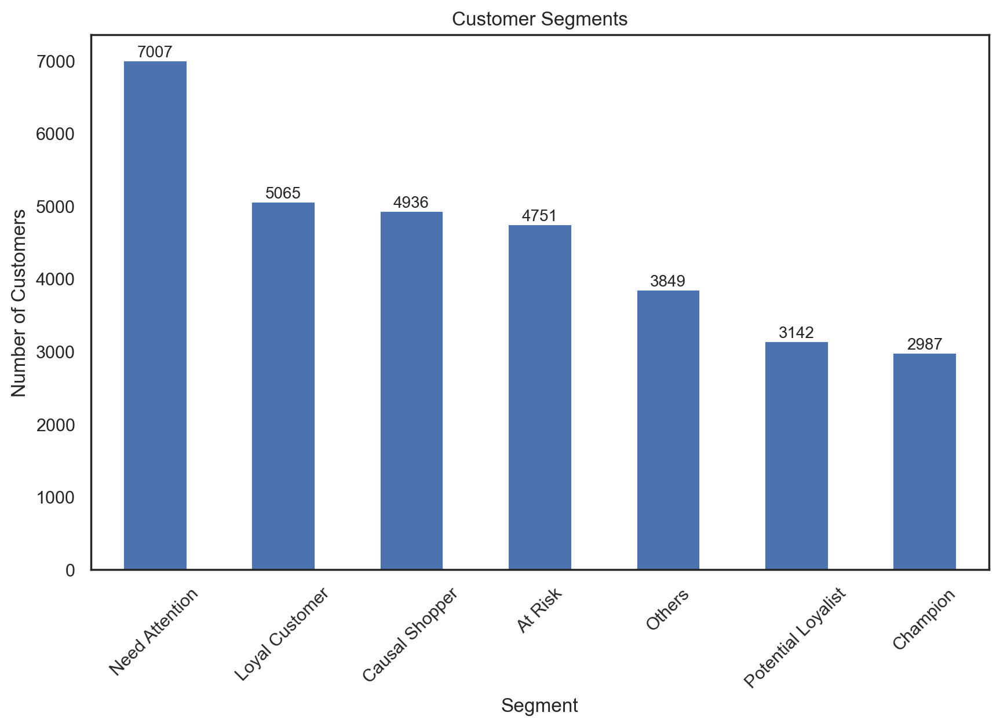

In [737]:
# Plot the segment distribution
segment_count = customers_rfm['Segment'].value_counts()

# Add the count & percentage at the top of each bar 
for index, count in enumerate(segment_count):
    plt.text(index, count + 1, f"{count}", ha='center', va='bottom', fontsize=10)

segment_count.plot(kind='bar', figsize=(10, 6))
plt.title('Customer Segments')
plt.xlabel('Segment')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.show()

Need Attention is the segment with the largest number of customers, followed by ABCDEats' Loyal and Casual customers. At Risk is also a large segment which requires action to avoid losing these customers.

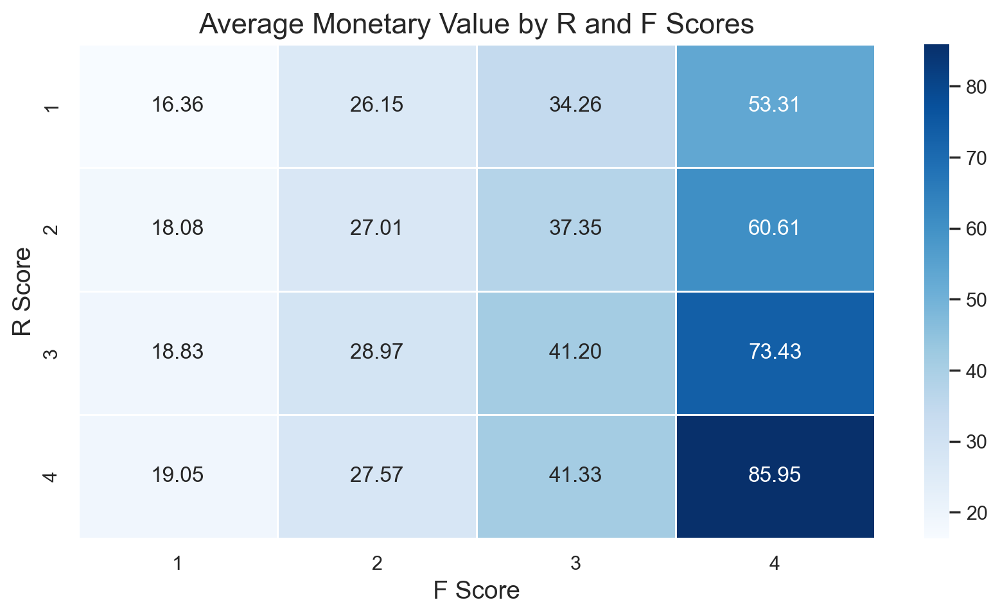

In [738]:
# Group data by R and F scores and calculate average monetary value
rfm_heatmap = customers_rfm.groupby(['R_score', 'F_score'])['monetary_unscaled'].mean().unstack()

plt.figure(figsize=(10, 5))
sns.heatmap(rfm_heatmap, annot=True, fmt='.2f', cmap='Blues', linewidths=0.5)
plt.title('Average Monetary Value by R and F Scores', fontsize=16)
plt.xlabel('F Score', fontsize=14)
plt.ylabel('R Score', fontsize=14)
plt.show()

Customers who purchase frequently and recently spend the most money. As expected, customers that spend the most are situated on the bottom right of the heatmap, and the ones that spend the less are in the top left.

**RFM Clustering** <br>
Now, that we have our scores, we can segment. We chose Kmeans ...

In [739]:
# Only select RFM scores
rfm_score_features = ['R_score', 'F_score', 'M_score']
rfm_data = customers_rfm[rfm_score_features]

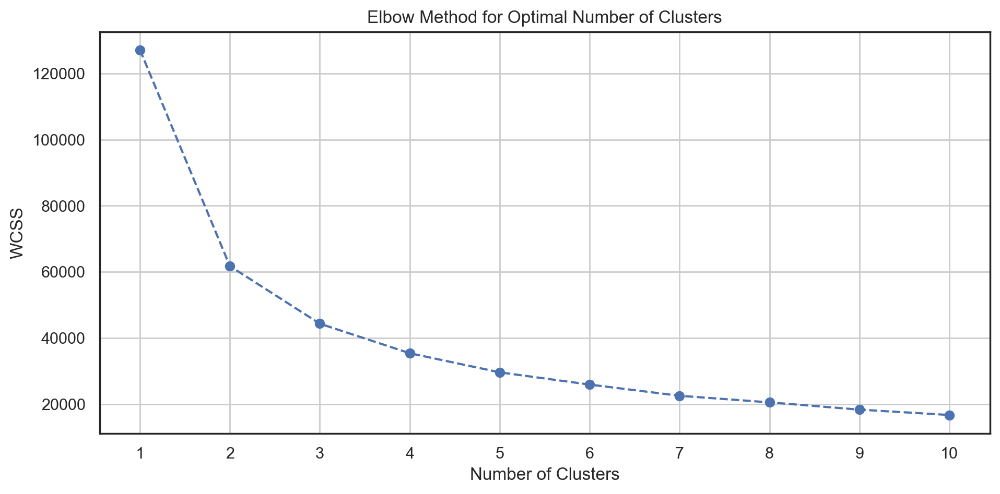

In [740]:
# Determine the Optimal Number of Clusters

# Calculate Within-Cluster Sum of Squares(WCSS) for different number of clusters
wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++', n_init=20, random_state=42)
    kmeans.fit(rfm_data)
    wcss.append(kmeans.inertia_)

# Plot the elbow method graph
plt.figure(figsize=(11, 5))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal Number of Clusters')
plt.xlabel('Number of Clusters')
plt.ylabel('WCSS')
plt.xticks(range(1, 11))
plt.grid(True)
plt.show()

Frrom the plot, we can determine that the optimal number of clusters should be 4.

In [741]:
# Perform K-Means clustering
optimal_k = 4
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', n_init=20, random_state=42)
customers_rfm['Cluster'] = kmeans.fit_predict(rfm_data)

In [742]:
# Calculate the average RFM values for each cluster
cluster_profiles = customers_rfm.groupby('Cluster').agg({'R_score': 'mean',
                                                         'F_score': 'mean',
                                                         'M_score': 'mean',
                                                         'recency_unscaled': 'mean',
                                                         'frequency_unscaled': 'mean',
                                                         'monetary_unscaled': 'mean'}).reset_index()

cluster_profiles

,Cluster,R_score,F_score,M_score,recency_unscaled,frequency_unscaled,monetary_unscaled
0,0,3.443843,1.560776,1.922133,9.389336,2.389600,18.779267
1,1,1.416857,1.210991,1.414786,48.996511,1.736997,12.120035
2,2,3.460239,3.709790,3.611786,9.156722,8.587179,71.948152
3,3,1.638406,1.983333,3.187500,40.895109,3.068116,40.668981


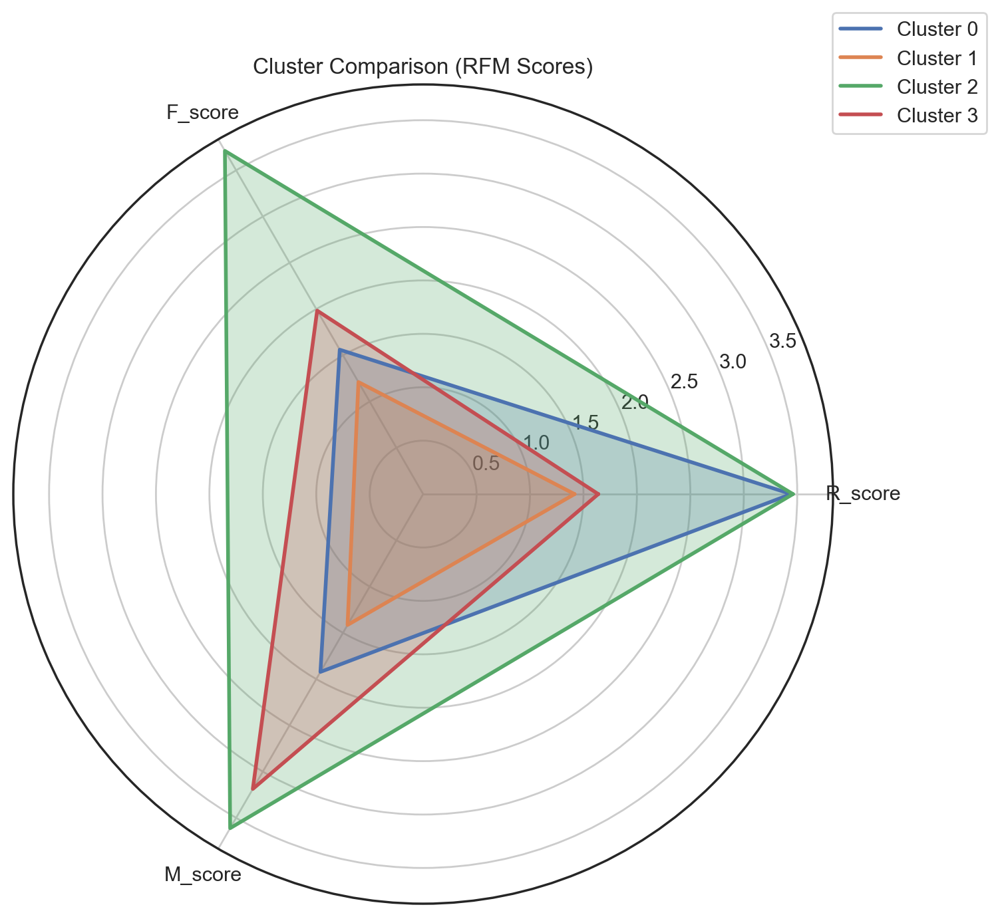

In [743]:
# Create the dataframe for the radar chart
cluster_means = {'Cluster': [0, 1, 2, 3],
                 'R_score': [3.443843, 1.416857, 3.460239, 1.638406],
                 'F_score': [1.560776, 1.210991, 3.709790, 1.983333],
                 'M_score': [1.922133, 1.414786, 3.611786, 3.187500]}

df = pd.DataFrame(cluster_means)


# Prepare data for radar plot
N = len(rfm_score_features)
values = [df.iloc[i, 1:].values.tolist() for i in range(len(df))]
values = [v + [v[0]] for v in values]  # Close the circle

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Add each cluster to the radar plot
for i, v in enumerate(values):
    ax.plot(angles, v, linewidth=2, linestyle='solid', label=f'Cluster {i}')
    ax.fill(angles, v, alpha=0.25)

ax.set_thetagrids([a * 180/pi for a in angles[:-1]], rfm_score_features)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.title("Cluster Comparison (RFM Scores)")
plt.show()

The RFM analysis revealed four distinct clusters that map onto classic RFM‐based customer segments. 

| Cluster    | Characteristics                                                                                                    | Segment              | Recommended Strategy                                                                                                         |
|------------|-------------------------------------------------------------------------------------------------------------------|----------------------|-----------------------------------------------------------------------------------------------------------------------------|
| Cluster 0  | High Recency score with moderate Frequency and Monetary levels. Customers have purchased recently but still need nudges to become truly frequent or high‐value customers. | **Potential Loyalists** | Encouraging them to buy more often or move up to premium offerings can strengthen this relationship and transition them into the “Loyal Customers” or “Champions” category. |
| Cluster 1  | Low Recency, Frequency, and Monetary values. These are customers who appear to be minimally engaged: they do not purchase often, have not bought recently, and exhibit limited spending. | **Casual Shoppers**  | Targeted promotions or tailored offers aimed at boosting their purchasing frequency and value could help reawaken their interest.             |
| Cluster 2  | High Recency, Frequency, and Monetary scores. These are the top‐tier customers who purchase frequently, have done so recently, and spend significantly | **Champions**        | Maintaining their loyalty through premium services and exclusive deals is crucial for sustaining their high engagement and preventing any attrition.             |
| Cluster 3  | Low Recency and Frequency scores but moderate-to-high Monetary value. These customers have spent more in the past but have lapsed in both engagement and timeliness of their purchases. | **At Risk**          | Segment that could be recovered through win‐back campaigns and customized incentives, as they already possess a demonstrated propensity to spend when sufficiently motivated.      |


**R2** <br>
By calculating R2, we can measure how well our clustering explains the variance in the data, and thus analyse the appropriateness of our solution. 

In [744]:
# Calculate the total sum of squares (SST) using get_ss() function that calculates the sum of sum squares for each variable
sst = f.get_ss(customers_rfm[rfm_score_features])  

# Get the sum of squares for each cluster label (SSW)
ssw_labels = customers_rfm[rfm_score_features + ["Cluster"]].groupby(by='Cluster').apply(f.get_ss)  

# Calculate the sum of squares between clusters (SSB)
ssb = sst - np.sum(ssw_labels) 

# Calculate the R2 value
r2 = ssb / sst
print(f'{round((r2*100), 2)}% of the variance in the data is explained by the clusters.')

72.18% of the variance in the data is explained by the clusters.


/var/folders/k2/b8h9qb2964lgbzj3dxd5r80c0000gn/T/ipykernel_4998/2573747250.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = customers_rfm[rfm_score_features + ["Cluster"]].groupby(by='Cluster').apply(f.get_ss)


<a class="anchor" id="sub-section-3_2"></a>

## 3.2. Segmentation based on Behaviour

</a>

In this second section, we will segment customers based on their behaviour to identify purchasing patterns.
- order_diversity: measure variety in vendor preference (i.e. number of products relative to a single vendor)
- order_frequency_per_week: calculate the frequency of buying products per week
- cuisine_variety: the number of cuisines a customer has spent on

In [745]:
# Select the features for behaviour analysis and create a copy of the dataframe
bhv_features = ['order_diversity', 'cuisine_variety', 'order_frequency_per_week']
clustering_data_reduced = customers[bhv_features].copy()

**Behaviour Scores** <br>
Similar to RFM analysis, we will define behaviour scores to rank customers in each feature and classify into groups for a guideline and better understanding.

In [746]:
# Get statistics of each feature to adjust the variable scoring
customers_unscaled[bhv_features].describe()

,order_diversity,cuisine_variety,order_frequency_per_week
count,31737.000000,31737.000000,31737.000000
mean,0.693331,2.248039,1.415550
std,0.258697,1.350544,1.298752
min,0.014286,1.000000,0.159091
25%,0.500000,1.000000,0.677419
50%,0.666667,2.000000,1.000000
75%,1.000000,3.000000,1.750000
max,1.000000,6.000000,7.000000


| **Variable**                | **Score Range**                                      | **Description**                                                                           |
|-----------------------------|-----------------------------------------------------|-------------------------------------------------------------------------------------------|
| **Order Diversity**         | 0 - 0.5                                             | Low diversity: Customers primarily order from a single vendor or very few vendors.        |
|                             | 0.5 - 0.75                                          | Moderate diversity: Customers order from a fair mix of vendors.                          |
|                             | > 0.75                                              | High diversity: Customers order from a wide variety of vendors.                          |
| **Cuisine Variety**         | 0 - 1                                               | Low variety: Customers primarily focus on one cuisine.                                    |
|                             | 2 - 3                                               | Moderate variety: Customers explore a few cuisines regularly.                            |
|                             | 4+                                                  | High variety: Customers frequently explore multiple cuisines.                            |
| **Order Frequency per Week**| < 0.67 (1st Quartile)                               | Low frequency: Customers order less than once every two weeks.                           |
|                             | 0.67 - 1.75 (2nd and 3rd Quartiles)                 | Moderate frequency: Customers order weekly or bi-weekly.                                 |
|                             | > 1.75 (Above 75th Percentile)                      | High frequency: Customers order more than once a week on average.                        |

**Behaviour Segments** <br>
Here, we are pre-defining segments to look for in the clusters based on scores. This will help us identify segments, define our behaviour-based segmentation, as well as the final clusters.

| **Segment Name**         | **Description**                                            | **Variable Scores**                                                                                                                      | **Recommended Actions**                                                                                      |
|--------------------------|-----------------------------------------------------------|-----------------------------------------------------------------------------------------------------------------------------------------|-------------------------------------------------------------------------------------------------------------|
| **Focused Loyalists**    | Frequent buyers from a small set of vendors and cuisines. | - **Order Diversity**: Low (0 - 0.5) <br> - **Cuisine Variety**: Low (0 - 1) <br> - **Order Frequency**: High (> 1.75)                  | Offer personalized promotions for their preferred vendors and cuisines to ensure loyalty.                   |
| **Explorers**            | Wide range of vendors and cuisines but infrequent orders. | - **Order Diversity**: High (> 0.75) <br> - **Cuisine Variety**: High (4+) <br> - **Order Frequency**: Low (< 0.67)                     | Highlight new vendors and cuisines to sustain engagement. Offer incentives for more frequent orders.        |
| **Diverse Enthusiasts**  | Frequent buyers with high diversity in vendors and cuisines. | - **Order Diversity**: High (> 0.75) <br> - **Cuisine Variety**: High (4+) <br> - **Order Frequency**: High (> 1.75)                   | Provide cross-promotional bundles and exclusive offers to keep them engaged with their diverse preferences.  |
| **Infrequent Shoppers**  | Rare buyers with low vendor and cuisine diversity.         | - **Order Diversity**: Low (0 - 0.5) <br> - **Cuisine Variety**: Low (0 - 1) <br> - **Order Frequency**: Low (< 0.67)                  | Use re-engagement campaigns with time-limited discounts to boost activity.                                  |
| **Occasional Explorers** | Rare buyers exploring a variety of cuisines and vendors.  | - **Order Diversity**: Moderate (0.5 - 0.75) <br> - **Cuisine Variety**: High (4+) <br> - **Order Frequency**: Low (< 0.67)            | Encourage consistent engagement with loyalty programs or discounts for repeat purchases.                    |
| **Balanced Shoppers**    | Moderate vendor and cuisine diversity with regular orders.| - **Order Diversity**: Moderate (0.5 - 0.75) <br> - **Cuisine Variety**: Moderate (2 - 3) <br> - **Order Frequency**: Moderate (0.67 - 1.75) | Maintain engagement through small rewards or free delivery on frequent orders.                              |


**Behaviour Clustering** <br>
Now, that we have our scores, we can segment. We chose Kmeans ...

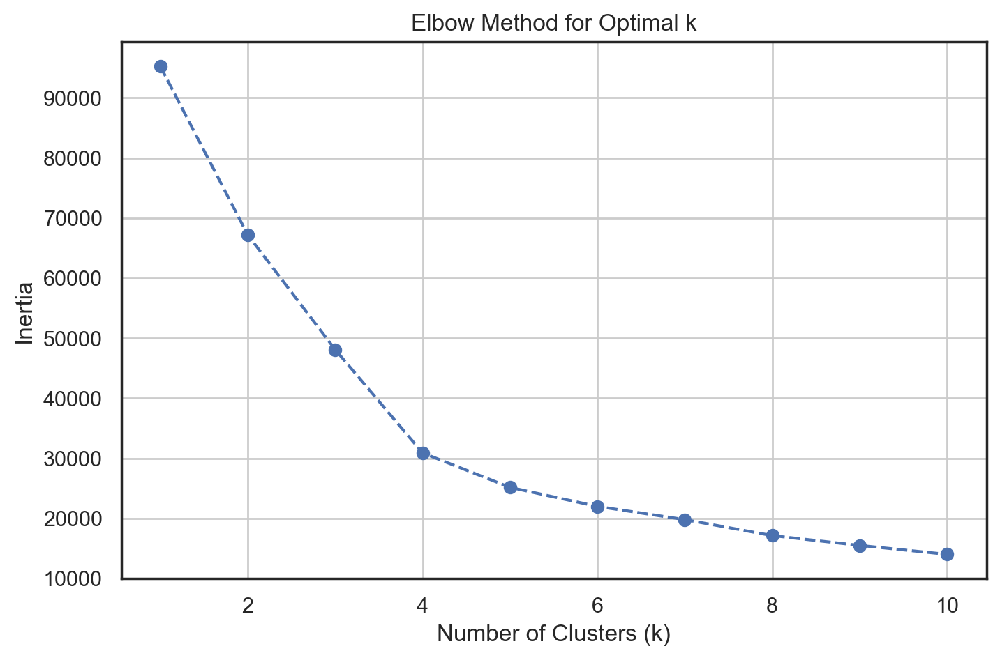

In [747]:
# Find the optimal number of clusters using the elbow method
inertia = []
for k in range(1, 11):
    kmeans = KMeans(n_clusters=k, init='k-means++', n_init=20, random_state=42)
    kmeans.fit(clustering_data_reduced)
    inertia.append(kmeans.inertia_)

# Plot the elbow curve
plt.figure(figsize=(8, 5))
plt.plot(range(1, 11), inertia, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.grid()
plt.show()

Here, the optimal number of clusters seems to be 5 clusters

In [748]:
# Apply K-Means with the chosen number of clusters
optimal_k = 5
kmeans = KMeans(n_clusters=optimal_k, init='k-means++', n_init=20, random_state=42)
clustering_data_reduced['cluster'] = kmeans.fit_predict(clustering_data_reduced)

# Analyze and visualize the clusters ordering by cluster
cluster_means = clustering_data_reduced.groupby('cluster').mean().sort_values(by='cluster')
cluster_means

,order_diversity,cuisine_variety,order_frequency_per_week
cluster,,,
0,-1.081699,-0.623052,0.142006
1,1.169933,-0.529246,-0.377880
2,-0.504003,1.960639,0.177575
3,-0.113781,0.259606,-0.435773
4,-0.107754,-0.147286,3.627415


In [749]:
# Add cluster labels to the unscaled data so we can interpret the clusters
customers_unscaled['behaviour clusters'] = clustering_data_reduced['cluster']

bhv_features_with_cluster = bhv_features + ['behaviour clusters']
customers_unscaled_bhv = customers_unscaled[bhv_features_with_cluster]

# Group by cluster and compute the mean for better interpretability
cluster_means_unscaled_bhv = customers_unscaled_bhv.groupby('behaviour clusters').mean().sort_values(by='behaviour clusters')

# Display the results
cluster_means_unscaled_bhv

,order_diversity,cuisine_variety,order_frequency_per_week
behaviour clusters,,,
0,0.413504,1.406593,1.599978
1,0.995985,1.533280,0.924786
2,0.562949,4.895925,1.646172
3,0.663897,2.598643,0.849599
4,0.665456,2.049125,6.126589


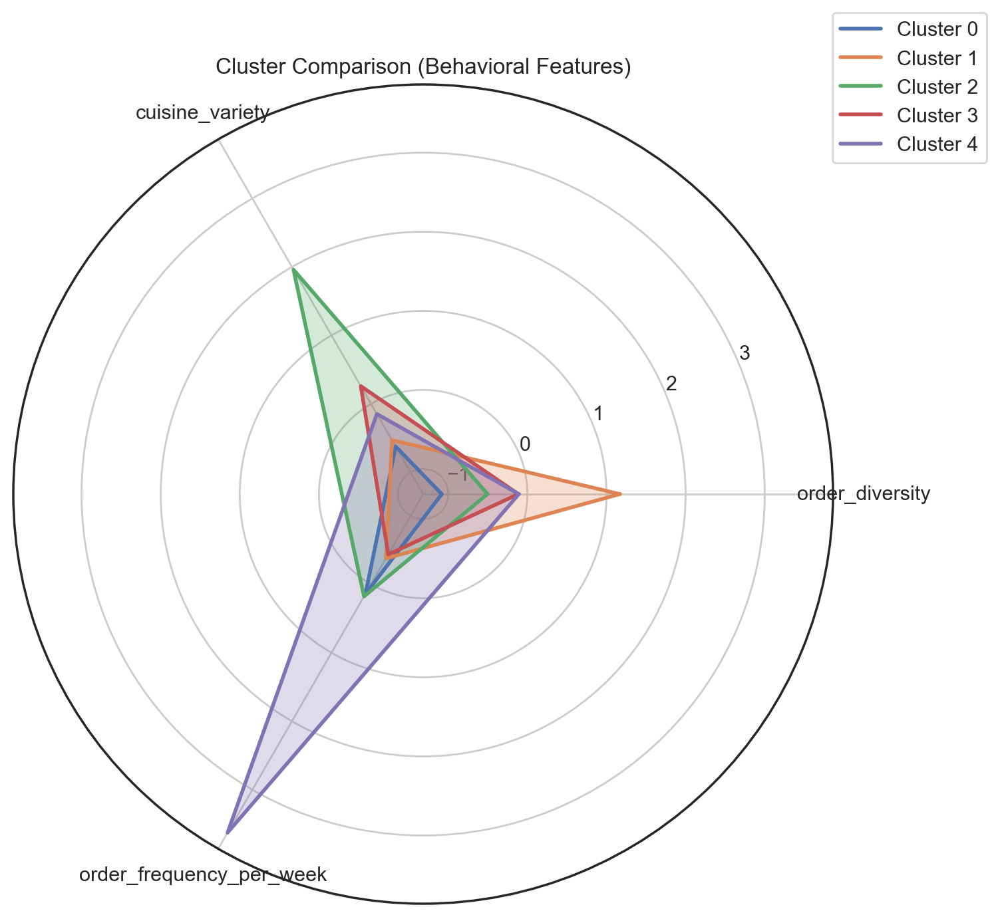

In [750]:
# Create the dataframe for the radar chart (use scaled data to capture the cluster differences better)
cluster_means = {'Cluster': [0, 1, 2, 3, 4],
                 'order_diversity': [-1.081699, 1.169933, -0.504003, -0.113781, -0.107754],
                 'cuisine_variety': [-0.623052, -0.529246, 1.960639, 0.259606, -0.147286],
                 'order_frequency_per_week': [0.142006, -0.377880, 0.177575, -0.435773, 3.627415]}

df = pd.DataFrame(cluster_means)

# Prepare data for radar plot
N = len(bhv_features)
values = [df.iloc[i, 1:].values.tolist() for i in range(len(df))]
values = [v + [v[0]] for v in values]  # Close the circle

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

# Add each cluster to the radar plot
for i, v in enumerate(values):
    ax.plot(angles, v, linewidth=2, linestyle='solid', label=f'Cluster {i}')
    ax.fill(angles, v, alpha=0.25)

ax.set_thetagrids([a * 180/pi for a in angles[:-1]], bhv_features)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.title("Cluster Comparison (Behavioral Features)")
plt.show()

The behavioural analysis revealed 5 clusters. Below is an interpretation of these clusters based on adapting the pre-defined segments. Here we are using the unscaled date for better interpretability.

| Cluster    | Characteristics                                                                                                         | Segment                    | Recommended Strategy                                                                                          |
|------------|----------------------------------------------------------------------------------------------------------------------|----------------------------|--------------------------------------------------------------------------------------------------------------|
| Cluster 0  | Low vendor diversity (0.41) <br> Low cuisine variety (1.5) <br> Moderate order frequency (1.6)                                               | **Focused Light Buyers**     | These customers require re-engagement efforts, such as targeted promotions on their favorite cuisines, to increase their activity, and push them to the Focused Frequent Buyers segment.          |
| Cluster 1  | High vendor diversity (1) <br> Low cuisine variety (1.5) <br> Moderate order frequency (0.92)                                                   | **Moderate Exploratory Shoppers**   | These customers like to explore different vendors and order quite frequently, but stick to the same cuisine type. They should be targeted with re-engagement campaigns by highlighting new vendors of their favorite cuisine type to increase their purchasing frequency.  |
| Cluster 2  | Moderate vendor diversity (0.56) <br> High cuisine variety (4.9) <br> Moderate order frequency (1.65)                                         | **Diverse Moderate Buyers**    | These customers value variety but are not highly frequent buyers, making them ideal for cross-promotional campaigns and loyalty incentives.  |
| Cluster 3  | Moderate vendor diversity (0.66) <br> Moderate cuisine variety (2.6) <br> Moderate order frequency (0.85)                                           | **Balanced Shoppers**     | Customers in this segment show balanced behavior. They are steady, consistent shoppers who can be encouraged to explore additional cuisines or vendors through occasional promotions.       |
| Cluster 4  | Moderate vendor diversity (0.67) <br> Moderate cuisine variety (2) <br> High order frequency (6)                                         | **Focused Frequent Buyers**| These customers are very active. They exhibit strong loyalty and are excellent candidates for exclusive deals, subscription services, and premium offerings to enhance their engagement further.   |


**R2** <br>
By calculating R2, we can measure how well our clustering explains the variance in the data, and thus analyse the appropriateness of our solution. 

In [751]:
# Calculate the total sum of squares (SST) using get_ss() function that calculates the sum of sum squares for each variable
sst = f.get_ss(clustering_data_reduced[bhv_features])  

# Get the sum of squares for each cluster label (SSW)
ssw_labels = clustering_data_reduced[bhv_features + ["cluster"]].groupby(by='cluster').apply(f.get_ss)  

# Calculate the sum of squares between clusters (SSB)
ssb = sst - np.sum(ssw_labels) 

# Calculate the R2 value
r2 = ssb / sst
print(f'{round((r2*100), 2)}% of the variance in the data is explained by the clusters.')

73.57% of the variance in the data is explained by the clusters.


/var/folders/k2/b8h9qb2964lgbzj3dxd5r80c0000gn/T/ipykernel_4998/2792333353.py:5: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  ssw_labels = clustering_data_reduced[bhv_features + ["cluster"]].groupby(by='cluster').apply(f.get_ss)


<a class="anchor" id="sub-section-3_3"></a>

## 3.3. Merging Perspectives

</a>

Now that we have our clusters from our two perspectives, we will merge them to create clusters to profile.

In [752]:
# Applying Kmeans with correct n_clusters to each perspective
kmeans_rfm = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
rfm_labels = kmeans_rfm.fit_predict(rfm_data)

kmeans_behav = KMeans(n_clusters=5, init='k-means++', n_init=20, random_state=42)
behavior_labels = kmeans_behav.fit_predict(clustering_data_reduced)

# Adding labels to the customers dataframe
customers['behavior_labels'] = behavior_labels
customers['rfm_labels'] = rfm_labels

In [753]:
# Count label frequencies (contigency table)
pd.crosstab(customers['behavior_labels'], customers['rfm_labels'])

rfm_labels,0,1,2,3
behavior_labels,,,,
0,2136,930,2984,1908
1,1673,1848,2124,2272
2,3411,5867,246,557
3,300,506,160,520
4,57,20,3955,263


There are 20 clusters to profile. This number needs to be reduced. We will manually merge lowest frequency clusters into closest clusters.

In [754]:
# Add RFM scores to customers data frame
customers[rfm_score_features] = customers_rfm[rfm_score_features]

# Create a variable with all the features used to cluster
cluster_features = rfm_score_features + bhv_features

In [755]:
# Get centroids of clusters
df_centroids = customers.groupby(['behavior_labels', 'rfm_labels'])[cluster_features].mean() #product_features+

# Using Hierarchical clustering to merge the concatenated cluster centroids
linkage = 'ward'
hclust = AgglomerativeClustering(linkage=linkage, metric='euclidean', distance_threshold=0, n_clusters=None)

hclust_labels = hclust.fit_predict(df_centroids)

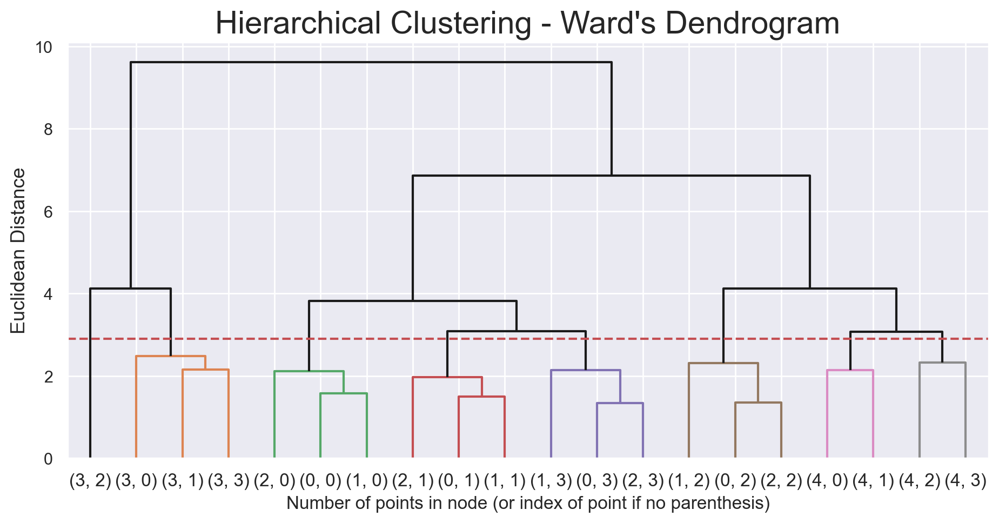

In [756]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack([hclust.children_, hclust.distances_, counts]).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))

y_threshold = 2.9
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')

plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering - {linkage.title()}\'s Dendrogram', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [757]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=8)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

# centroid's cluster labels
df_centroids  

R_score   F_score   M_score  order_diversity  \
behavior_labels rfm_labels                                                  
0               0           3.479869  2.073970  2.154494        -0.020441   
                1           1.621505  1.860215  1.502151        -0.016203   
                2           3.433981  3.494303  3.484249        -0.226058   
                3           1.787736  2.320231  3.112159        -0.090240   
1               0           3.442917  1.423790  2.239091        -0.951346   
                1           1.397186  1.206169  1.561688        -0.832211   
                2           3.442090  3.629473  3.701036        -1.477006   
                3           1.593310  1.643926  3.273768        -1.011058   
2               0           3.420111  1.306362  1.598945         1.174556   
                1           1.399523  1.102267  1.344980         1.184191   
                2           3.516260  3.162602  3.195122         0.945663   
                3           1.644524  1.863555  2.978456         1.090491   
3               0           3.463333  1.276667  2.183333         0.145933   
                1           1.308300  1.215415  1.543478         0.466577   
                2           3.525000  3.531250  3.750000        -0.966905   
                3           1.388462  1.671154  3.371154        -0.548625   
4               0           3.438596  3.070175  1.877193         0.353400   
                1           1.550000  3.250000  1.000000         0.613899   
                2           3.483692  3.956764  3.680405        -0.550572   
                3           1.425856  3.342205  3.068441        -0.074534   

                            cuisine_variety  order_frequency_per_week  \
behavior_labels rfm_labels                                              
0               0                  0.091583                 -0.600383   
                1                  0.012201                 -0.372076   
                2                  0.499969                 -0.403954   
                3                  0.192387                 -0.332301   
1               0                 -0.805059                  0.028549   
                1                 -0.847185                  0.241292   
                2                 -0.235605                 -0.050113   
                3                 -0.668933                  0.324398   
2               0                 -0.427440                 -0.474929   
                1                 -0.643306                 -0.317010   
                2                  0.014997                 -0.562879   
                3                 -0.191637                 -0.343012   
3               0                 -0.319411                  3.601695   
                1                 -0.349020                  3.733869   
                2                  0.982554                  3.451190   
                3                 -0.199325                  3.592889   
4               0                  1.673970                 -0.186453   
                1                  1.519384                  0.177310   
                2                  1.992769                  0.178795   
                3                  1.573158                  0.238143   

                            hclust_labels  
behavior_labels rfm_labels                 
0               0                       5  
                1                       6  
                2                       1  
                3                       7  
1               0                       5  
                1                       6  
                2                       1  
                3                       7  
2               0                       5  
                1                       6  
                2                       1  
                3                       7  
3               0                       0  
                1                       0  
                2      

In [758]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

In [759]:
customers_merge = customers.copy()

In [760]:
# Mapping the hierarchical clusters on the centroids to the observations
customers_merge['merged_labels'] = customers_merge.apply(lambda row: cluster_mapper[(row['behavior_labels'], row['rfm_labels'])], axis=1)
customers_merge.head()

,customer_region,customer_age,vendor_count,product_count,is_chain,first_order,last_order,last_promo,payment_method,CUI_American,CUI_Asian,CUI_Beverages,CUI_Cafe,CUI_Chicken Dishes,CUI_Chinese,CUI_Desserts,CUI_Healthy,CUI_Indian,CUI_Italian,CUI_Japanese,CUI_Noodle Dishes,CUI_OTHER,CUI_Street Food / Snacks,CUI_Thai,DOW_0,DOW_1,DOW_2,DOW_3,DOW_4,DOW_5,DOW_6,HR_0,HR_1,HR_2,HR_3,HR_4,HR_5,HR_6,HR_7,HR_8,HR_9,HR_10,HR_11,HR_12,HR_13,HR_14,HR_15,HR_16,HR_17,HR_18,HR_19,HR_20,HR_21,HR_22,HR_23,monetary,frequency,top_cuisine,city,promo_used,recency,cuisine_variety,order_diversity,CUI_American_percentage,CUI_Asian_percentage,CUI_Beverages_percentage,CUI_Cafe_percentage,CUI_Chicken Dishes_percentage,CUI_Chinese_percentage,CUI_Desserts_percentage,CUI_Healthy_percentage,CUI_Indian_percentage,CUI_Italian_percentage,CUI_Japanese_percentage,CUI_Noodle Dishes_percentage,CUI_OTHER_percentage,CUI_Street Food / Snacks_percentage,CUI_Thai_percentage,preferred_day,preferred_hour,active_time_in_days,active_time_in_weeks,order_frequency_per_week,age_group,behavior_labels,rfm_labels,R_score,F_score,M_score,merged_labels
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,2360,-1.430096,-0.437105,5,-0.557813,-1.175038,1,DELIVERY,DIGI,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,28.88,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2,0,0,0,0,0,-0.213835,-0.559127,CUI_Indian,city_2,YES,2.707106,-0.924116,-1.133898,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,100.000000,0.0,0.0,0.0,0.0,0.0,0.0,Sunday,18,1.0,-1.305589,4.299926,Teenagers (15-19),3,3,1,1,3,0
5d272b9dcb,8670,-1.583494,-0.437105,2,-0.218909,-1.175038,1,DISCOUNT,DIGI,12.82,6.39,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,-0.484290,-0.559127,CUI_American,city_8,YES,2.707106,-0.183661,1.185454,66.736075,33.263925,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,Sunday,10,1.0,-1.305589,4.299926,Teenagers (15-19),3,1,1,1,2,0
f6d1b2ba63,4660,1.637875,-0.862053,2,-0.218909,-1.175038,1,DISCOUNT,CASH,9.20,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,1,0,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,-0.764253,-0.559127,CUI_American,city_4,YES,2.707106,-0.924116,-0.747340,100.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,Sunday,9,1.0,-1.305589,4.299926,Adults (30-39),3,1,1,1,1,0
180c632ed8,4660,-0.202907,-0.437105,3,-0.557813,-1.175038,2,DELIVERY,DIGI,0.00,13.70,0.0,0.0,0.0,0.0,0.0,0.0,17.86,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,-0.138880,-0.559127,CUI_Indian,city_4,YES,2.663969,-0.183661,-0.103075,0.000000,43.409379,0.0,0.0,0.0,0.0,0.0,0.0,56.590621,0.0,0.0,0.0,0.0,0.0,0.0,Monday,11,2.0,-1.269352,4.299926,Young Adults (20-29),3,3,1,1,3,0
4eb37a6705,4660,-1.123299,-0.437105,5,-0.896717,-1.175038,2,-,DIGI,14.57,40.87,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0,1,0,0,0,0,1,0.0,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.529005,-0.559127,CUI_Asian,city_4,NO,2.663969,-0.183661,-1.133898,26.280664,73.719336,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,Monday,8,2.0,-1.269352,4.299926,Young Adults (20-29),3,3,1,1,4,0


In [761]:
# Merged cluster centroids
customers_merge.groupby('merged_labels').mean(numeric_only=True)[cluster_features]

,R_score,F_score,M_score,order_diversity,cuisine_variety,order_frequency_per_week
merged_labels,,,,,,
0,1.827300,1.407994,2.404977,-0.004085,-0.283617,3.648679
1,3.440979,3.532686,3.556967,-0.668488,0.185874,-0.270883
2,3.355382,3.918445,3.642248,-0.520890,1.966605,0.182495
3,2.948052,3.116883,1.649351,0.421062,1.633818,-0.091969
4,3.525000,3.531250,3.750000,-0.966905,0.982554,3.451190
5,3.443075,1.560665,1.911634,0.328413,-0.361391,-0.395379
6,1.422903,1.206015,1.408213,0.624020,-0.616371,-0.203588
7,1.677644,1.942157,3.173950,-0.393054,-0.265882,-0.018589


In [762]:
# Merge cluster contigency table
# Getting size of each final cluster
df_counts = customers_merge.groupby('merged_labels').size().to_frame()

# Getting the product and behavior labels
df_counts = df_counts.rename({v:k for k, v in cluster_mapper.items()}).reset_index()

df_counts['behavior_labels'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['rfm_labels'] = df_counts['merged_labels'].apply(lambda x: x[1])

df_counts


,merged_labels,0,behavior_labels,rfm_labels
0,"(3, 3)",1326,3,3
1,"(2, 2)",5354,2,2
2,"(4, 3)",4218,4,3
3,"(4, 1)",77,4,1
4,"(3, 2)",160,3,2
5,"(2, 0)",7220,2,0
6,"(2, 1)",8645,2,1
7,"(2, 3)",4737,2,3


In [763]:
df_counts.pivot(values=0, index='behavior_labels', columns='rfm_labels')

rfm_labels,0,1,2,3
behavior_labels,,,,
2,7220.0,8645.0,5354.0,4737.0
3,NaN,NaN,160.0,1326.0
4,NaN,77.0,NaN,4218.0


After merging clusters using hierarchical clustering, we are left with 8 clusters to profile.

In [764]:
# Copy the merged clusters to the customers dataframe
customers = customers_merge.copy()

<a class="anchor" id="sub-section-3_4"></a>

## 3.4. Cluster Analysis and Profiling

</a>

| **Merged Clusters** | **Cluster Pair (behavior_labels, rfm_labels)** | **Profile**                                      |
|----------------------|-----------------------------------------------|-------------------------------------------------|
| 0                    | (3,3)                                         | Balanced Shoppers & At Risk                     |
| 1                    | (2,2)                                         | Diverse Moderate Buyers & Champions             |
| 2                    | (4,3)                                         | Focused Frequent Buyers & At Risk               |
| 3                    | (4,1)                                         | Focused Frequent Buyers & Casual Shoppers       |
| 4                    | (3,2)                                         | Balanced Shoppers & Champions                   |
| 5                    | (2,0)                                         | Diverse Moderate Buyers & Potential Loyalists   |
| 6                    | (2,1)                                         | Diverse Moderate Buyers & Casual Shoppers       |
| 7                    | (2,3)                                         | Diverse Moderate Buyers & At Risk               |

/Users/chloedeschanel/Documents/GitHub/DM2425/Notebook/functions.py:95: UserWarning: The palette list has more values (10) than needed (4), which may not be intended.
  sns.barplot(x=label,
/Users/chloedeschanel/Documents/GitHub/DM2425/Notebook/functions.py:95: UserWarning: The palette list has more values (10) than needed (5), which may not be intended.
  sns.barplot(x=label,
/Users/chloedeschanel/Documents/GitHub/DM2425/Notebook/functions.py:95: UserWarning: The palette list has more values (10) than needed (8), which may not be intended.
  sns.barplot(x=label,


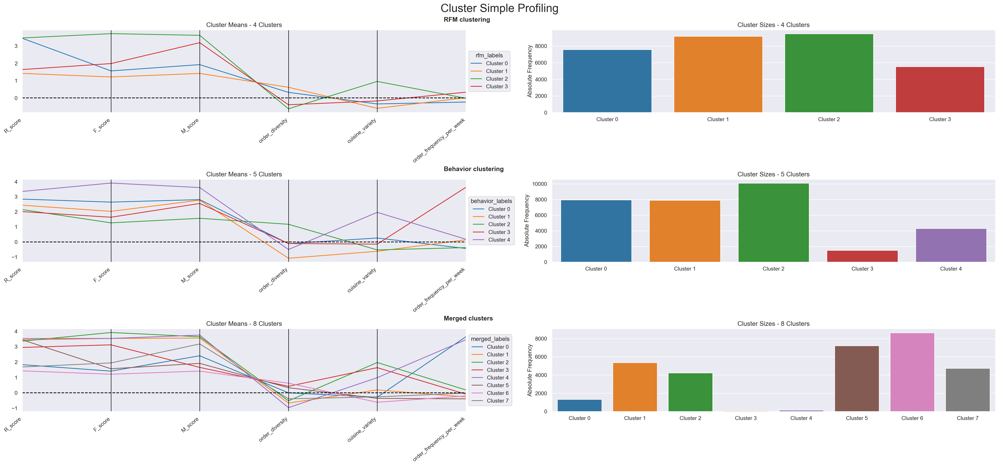

In [765]:
# Profilling each cluster (product, behavior, merged)
f.cluster_profiles(df = customers[cluster_features + ['rfm_labels', 'behavior_labels', 'merged_labels']], 
                   label_columns = ['rfm_labels', 'behavior_labels', 'merged_labels'], 
                   figsize = (28, 13), 
                   compare_titles = ["RFM clustering", "Behavior clustering", "Merged clusters"])

In [766]:
# Add the cluster labels to customers_ohc
customers_ohc[['behavior_labels', 'rfm_labels', 'merged_labels']] = customers[['behavior_labels', 'rfm_labels', 'merged_labels']]
customers_ohc.head()

,payment_method,age_group,top_cuisine,city,promo_used,preferred_day,preferred_hour,payment_method_CARD,payment_method_CASH,payment_method_DIGI,age_group_Adults (30-39),age_group_Middle-Aged (40-49),age_group_Older Adults (50-59),age_group_Seniors (60+),age_group_Teenagers (15-19),age_group_Young Adults (20-29),top_cuisine_CUI_American,top_cuisine_CUI_Asian,top_cuisine_CUI_Beverages,top_cuisine_CUI_Cafe,top_cuisine_CUI_Chicken Dishes,top_cuisine_CUI_Chinese,top_cuisine_CUI_Desserts,top_cuisine_CUI_Healthy,top_cuisine_CUI_Indian,top_cuisine_CUI_Italian,top_cuisine_CUI_Japanese,top_cuisine_CUI_Noodle Dishes,top_cuisine_CUI_OTHER,top_cuisine_CUI_Street Food / Snacks,top_cuisine_CUI_Thai,city_-,city_city_2,city_city_4,city_city_8,promo_used_NO,promo_used_YES,preferred_day_Friday,preferred_day_Monday,preferred_day_Saturday,preferred_day_Sunday,preferred_day_Thursday,preferred_day_Tuesday,preferred_day_Wednesday,preferred_hour_0,preferred_hour_1,preferred_hour_2,preferred_hour_3,preferred_hour_4,preferred_hour_5,preferred_hour_6,preferred_hour_7,preferred_hour_8,preferred_hour_9,preferred_hour_10,preferred_hour_11,preferred_hour_12,preferred_hour_13,preferred_hour_14,preferred_hour_15,preferred_hour_16,preferred_hour_17,preferred_hour_18,preferred_hour_19,preferred_hour_20,preferred_hour_21,preferred_hour_22,preferred_hour_23,behavior_labels,rfm_labels,merged_labels
customer_id,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
1b8f824d5e,DIGI,Teenagers (15-19),CUI_Indian,city_2,YES,Sunday,18,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,3,0
5d272b9dcb,DIGI,Teenagers (15-19),CUI_American,city_8,YES,Sunday,10,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1,0
f6d1b2ba63,CASH,Adults (30-39),CUI_American,city_4,YES,Sunday,9,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1,0
180c632ed8,DIGI,Young Adults (20-29),CUI_Indian,city_4,YES,Monday,11,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3,0
4eb37a6705,DIGI,Young Adults (20-29),CUI_Asian,city_4,NO,Monday,8,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,3,0


In [767]:
customers_payment = customers_ohc[['merged_labels',
                                   'payment_method_CARD',
                                   'payment_method_CASH', 
                                   'payment_method_DIGI']].groupby(['merged_labels']).sum()
customers_payment

,payment_method_CARD,payment_method_CASH,payment_method_DIGI
merged_labels,,,
0,613.0,362.0,351.0
1,4139.0,511.0,704.0
2,3090.0,483.0,645.0
3,52.0,11.0,14.0
4,108.0,22.0,30.0
5,4424.0,1315.0,1481.0
6,4601.0,2167.0,1877.0
7,3072.0,707.0,958.0


/var/folders/k2/b8h9qb2964lgbzj3dxd5r80c0000gn/T/ipykernel_4998/2908458913.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  customers_profiling_feature = customers_ohc.groupby(["merged_labels", feature])['payment_method'].size().unstack()


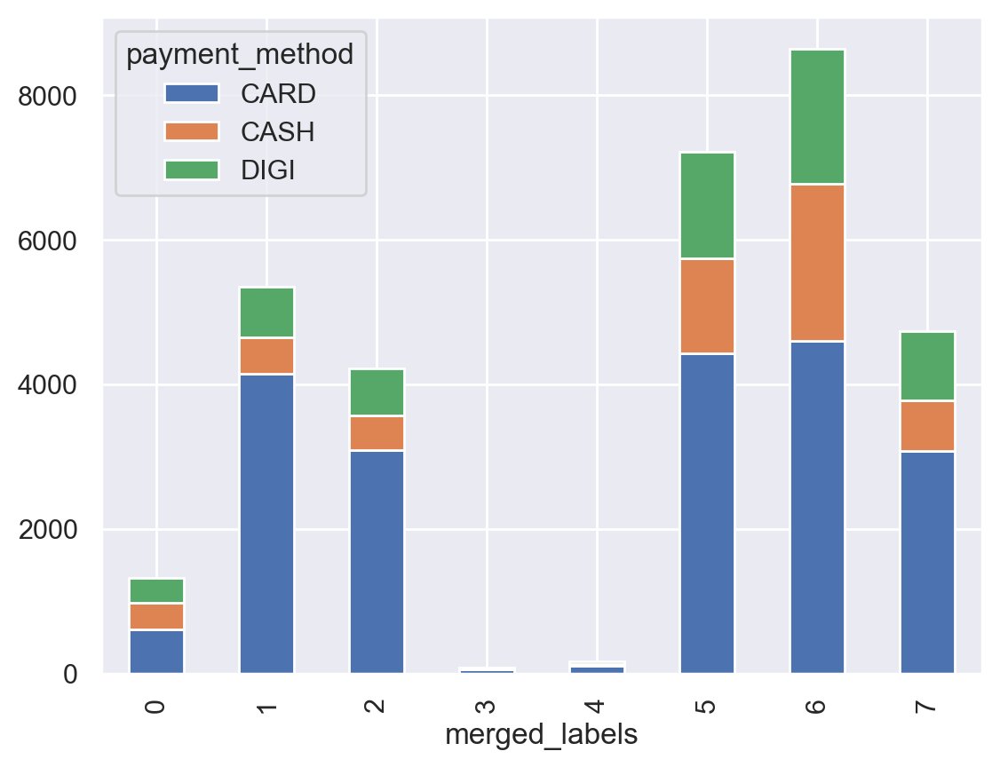

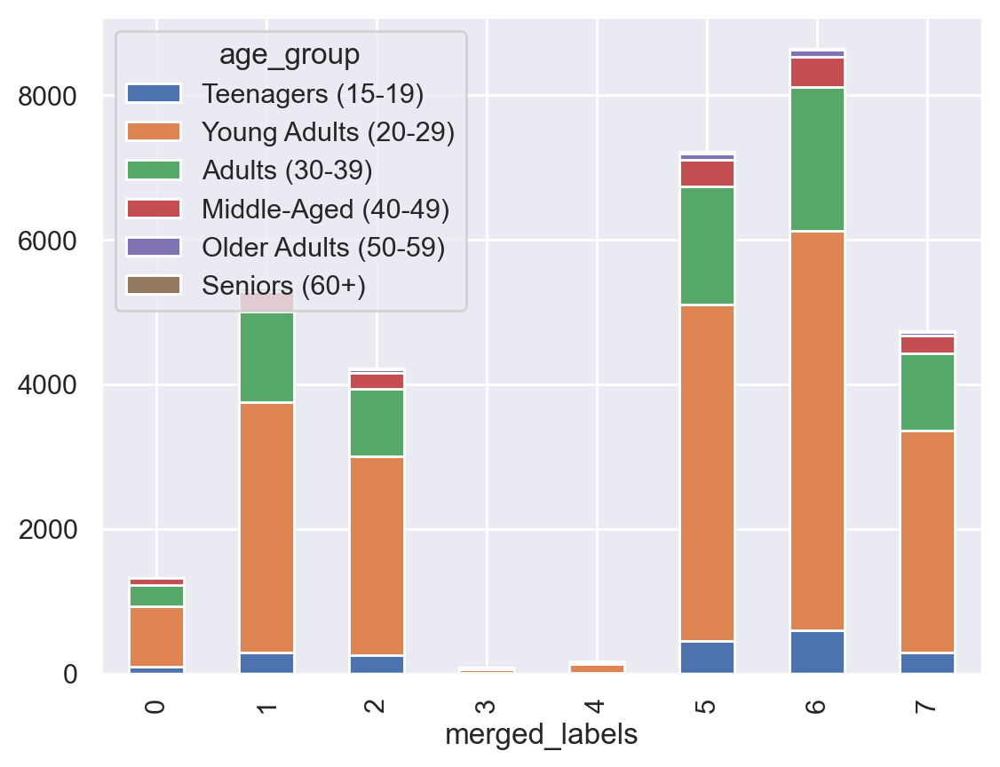

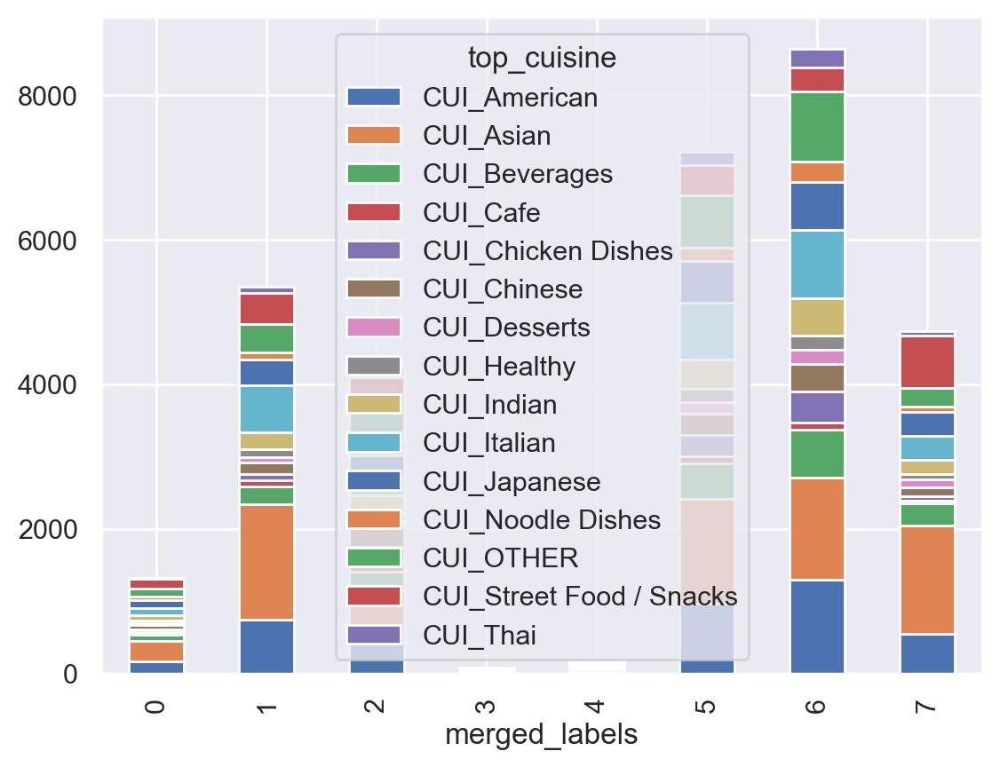

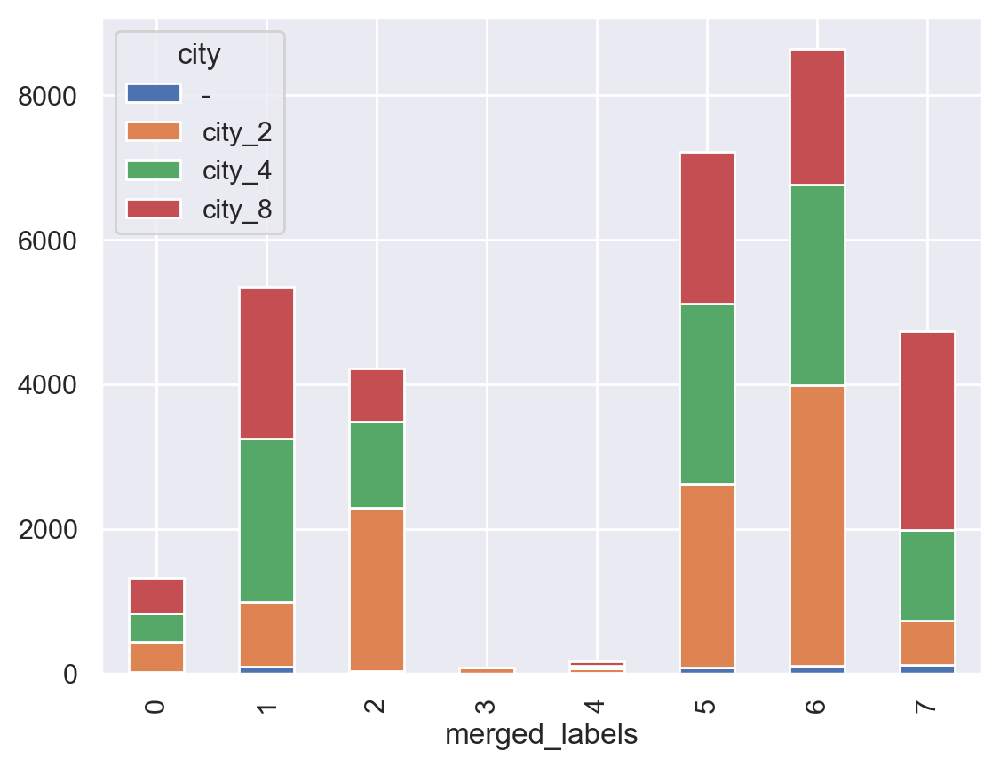

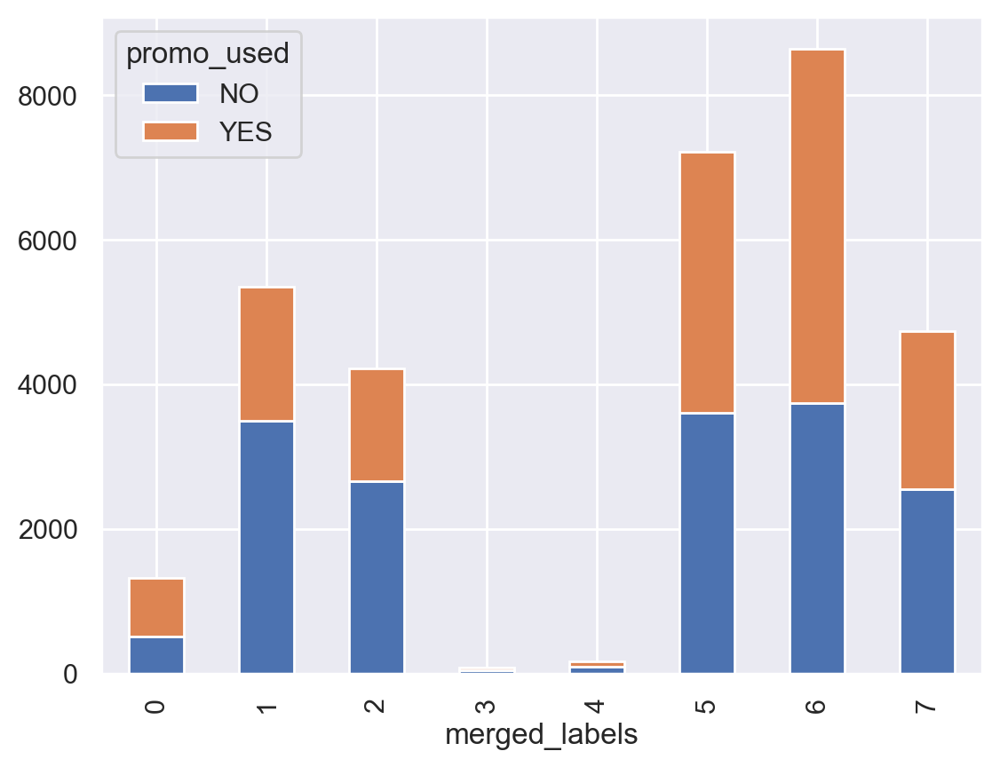

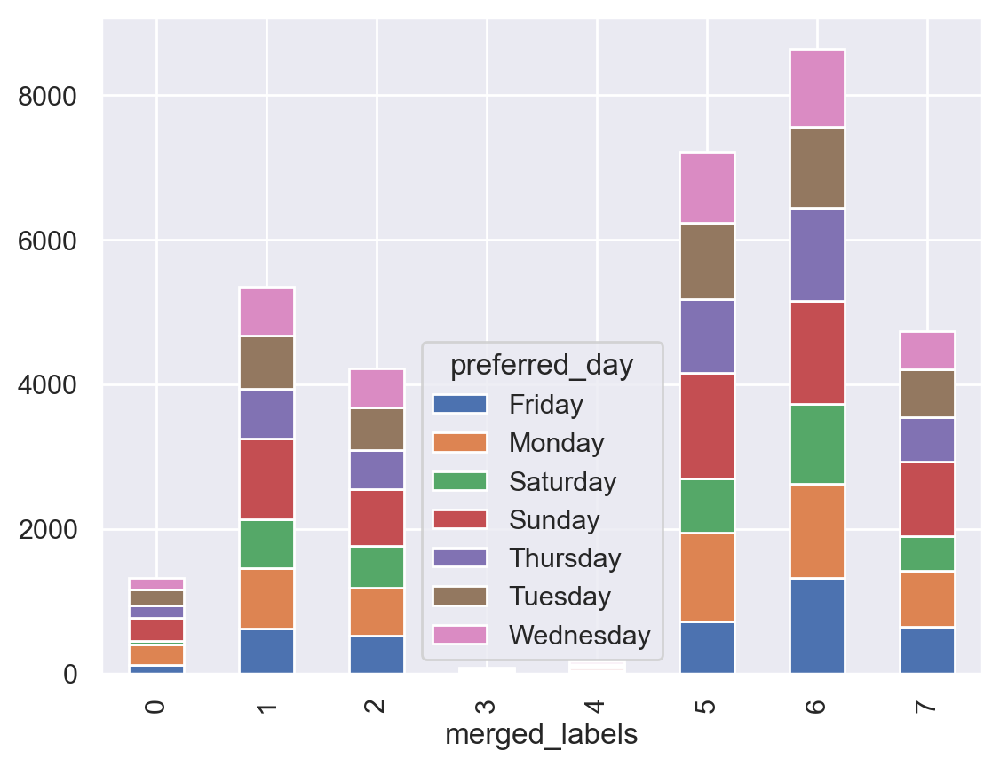

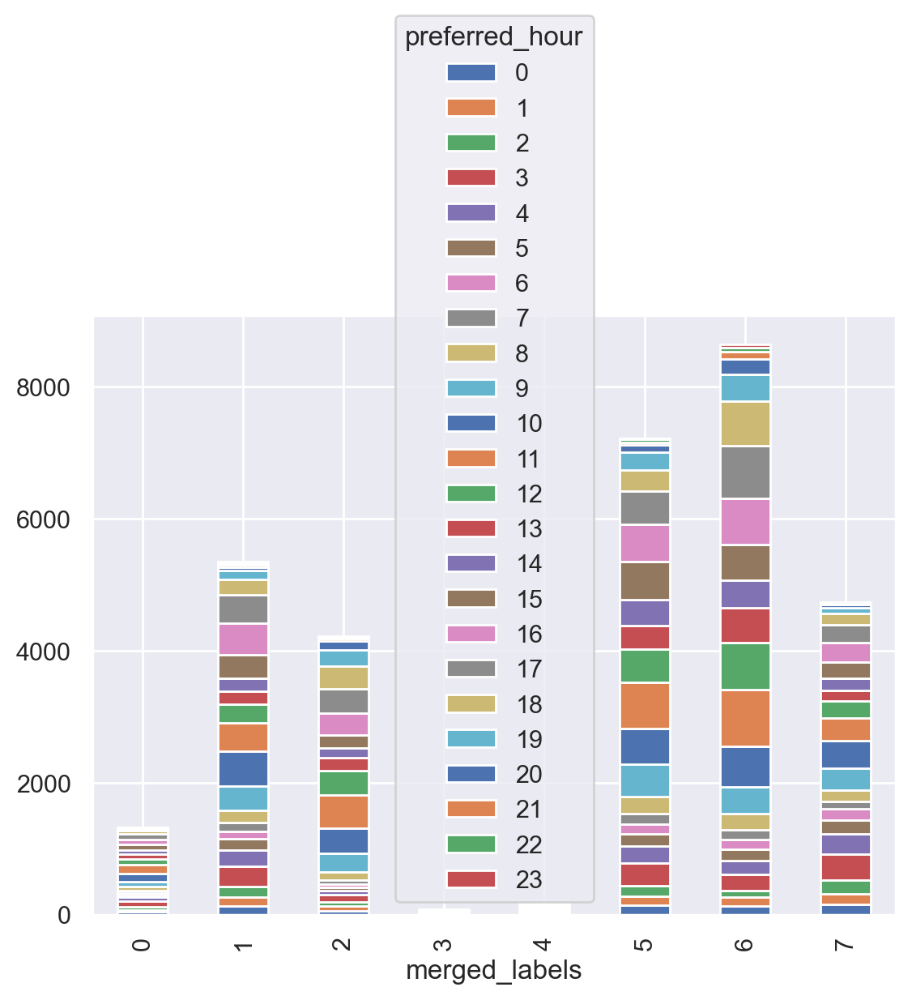

In [770]:
for feature in profiling_features:
    customers_profiling_feature = customers_ohc.groupby(["merged_labels", feature])['payment_method'].size().unstack()
    customers_profiling_feature.plot.bar(stacked=True)


/var/folders/k2/b8h9qb2964lgbzj3dxd5r80c0000gn/T/ipykernel_4998/4066937082.py:14: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  customers_profiling_feature = customers_ohc.groupby(["merged_labels", feature])['payment_method'].size().unstack()


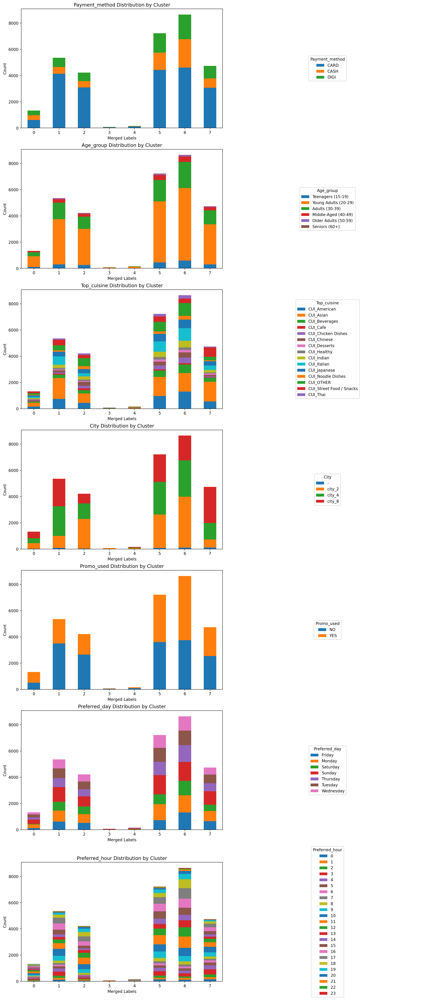

In [774]:
# Define the number of rows (features) and columns (plot + legend)
n_rows = len(profiling_features)
n_cols = 2

# Create subplots
plt.style.use('default')
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, n_rows * 5), constrained_layout=True)
fig.patch.set_facecolor('white')

# Iterate over features
for i, feature in enumerate(profiling_features):
    # Left subplot for the plot
    ax_plot = axes[i, 0]
    customers_profiling_feature = customers_ohc.groupby(["merged_labels", feature])['payment_method'].size().unstack()
    plot = customers_profiling_feature.plot.bar(stacked=True, ax=ax_plot, legend=False)
    ax_plot.set_title(f"{feature.capitalize()} Distribution by Cluster")
    ax_plot.set_ylabel("Count")
    ax_plot.set_xlabel("Merged Labels")
    ax_plot.grid(False)  # Remove grid lines
    ax_plot.set_xticklabels(ax_plot.get_xticklabels(), rotation=0)  # Set x-tick rotation to 0

    # Right subplot for the legend
    ax_legend = axes[i, 1]
    ax_legend.axis("off")  # Turn off the axis
    handles, labels = ax_plot.get_legend_handles_labels()
    ax_legend.legend(handles, labels, loc='center', title=feature.capitalize())

plt.show()

# STOP: BELOW NEEDS TO BE REVIEWED (ALL ABOVE SHOULD BE OK)

<a class="anchor" id="sub-section-3_2"></a>

## 3.2. Cuisine Preference Segmentation

</a>

As there are many cuisine types ratios, we tried to group them in a logical way in the aim to find better clusters.

In [204]:
# Define the cuisine categories
cuisine_categories = {'Fast Food': ['CUI_American_ratio', 'CUI_Chicken Dishes_ratio', 'CUI_Street Food / Snacks_ratio'],
                      'South Asian Cuisine': ['CUI_Indian_ratio'],
                      'East Asian Cuisine': ['CUI_Chinese_ratio', 'CUI_Japanese_ratio', 'CUI_Thai_ratio', 'CUI_Noodle Dishes_ratio'],
                      'Snacks': ['CUI_Beverages_ratio', 'CUI_Desserts_ratio', 'CUI_Cafe_ratio'],
                      'Healthy & Light': ['CUI_Healthy_ratio'],
                      'Local & Specialty': ['CUI_OTHER_ratio']}

# Create category totals in the DataFrame
for category, columns in cuisine_categories.items():
    customers[f'{category}'] = customers[columns].sum(axis=1)

pref_features = ['Fast Food', 'South Asian Cuisine', 'East Asian Cuisine', 'Snacks', 'Healthy & Light', 
                 'Local & Specialty']

customers_pref = customers[pref_features].copy()

In [ ]:
# Subset data because too large dataset to compute dendogram
subset_size = min(10000, customers_pref.shape[0])
subset_customers_pref = customers_pref.sample(n=subset_size, random_state=42)

# Perform hierarchical clustering
linkage_matrix = linkage(subset_customers_pref, method='ward')

# Plot the dendrogram with truncation
plt.figure(figsize=(12, 8))

dendrogram(linkage_matrix, truncate_mode='lastp', p=20, leaf_rotation=90, leaf_font_size=10, show_contracted=True)

plt.title("Dendrogram for Hierarchical Clustering", fontsize=16)
plt.xlabel("Cluster Labels")
plt.ylabel("Distance")
plt.axhline(y=100, color='r', linestyle='--', label='Threshold for Cluster Cutting')
plt.legend()
plt.show()

From the dendogram, we can determine 7 clusters at 100 distance threshold.

In [ ]:
# Fit the hierarchical clustering model
n_clusters = 7
hclust = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
cluster_labels = hclust.fit_predict(customers_pref)

# Add cluster labels to the DataFrame
customers_pref['Cluster'] = cluster_labels

# Analyze and visualize cluster profiles
cluster_means = customers_pref.groupby('Cluster')[pref_features].mean()
cluster_means

In [ ]:
# Plot the heatmap for cluster profiles
fig, ax = plt.subplots(figsize=(10, 6))
hc_profile = cluster_means.T  # Transpose for better visualization

sns.heatmap(hc_profile, cmap="PuOr", annot=True, fmt=".2f", center=0, linewidths=0.5, 
            cbar_kws={'label': 'Feature Values'}, ax=ax)

ax.set_title(f"Cluster Profiling: Hierarchical Clustering with {n_clusters} Clusters")
ax.set_xlabel("Cluster Labels")
plt.show()

In [ ]:
# Number of datapoints in each cluster
label_counts = customers_pref['Cluster'].value_counts()

fig, ax = plt.subplots(figsize=(8, 4))
sns.barplot(x=label_counts.index, y=label_counts.values, ax=ax, palette="muted")

ax.set_title("Cluster Sizes", fontsize=14)
ax.set_xlabel("Cluster Labels", fontsize=12)
ax.set_ylabel("Number of Observations", fontsize=12)

fig.suptitle(f"Cluster Profiling:\nHierarchical Clustering with {label_counts.nunique()} Clusters", fontsize=16)
plt.tight_layout()
plt.show()

In [ ]:
# Initialize silhouette score storage
range_clusters = range(2, 9)
avg_silhouette = []

# Compute silhouette scores for different cluster counts
for nclus in range_clusters:
    kmclust = KMeans(n_clusters=nclus, init='k-means++', n_init=15, random_state=1)
    cluster_labels = kmclust.fit_predict(customers_pref)

    silhouette_avg = silhouette_score(customers_pref, cluster_labels)
    avg_silhouette.append(silhouette_avg)
    print(f"For n_clusters = {nclus}, the average silhouette_score is: {silhouette_avg}")

    # Visualize silhouette plots for each nclus
    sample_silhouette_values = silhouette_samples(customers_pref, cluster_labels)
    fig, ax = plt.subplots(figsize=(13, 7))
    y_lower = 10

    for i in range(nclus):
        ith_cluster_silhouette_values = sample_silhouette_values[np.array(cluster_labels) == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / nclus)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                         0, ith_cluster_silhouette_values,
                         facecolor=color, edgecolor=color, alpha=0.7)
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10

    ax.axvline(x=silhouette_avg, color="red", linestyle="--")
    ax.set_title(f"Silhouette plot for K-Means (n_clusters = {nclus})")
    ax.set_xlabel("Silhouette coefficient values")
    ax.set_ylabel("Cluster label")
    ax.set_xlim([-0.1, 1])  # Set x-axis limits for better readability
    ax.set_ylim([0, len(customers_pref)])
    plt.show()

In [ ]:
# Plot average silhouette scores across clusters
plt.figure(figsize=(9, 5))
plt.plot(range_clusters, avg_silhouette, marker='o', color='green')
plt.xlabel("Number of clusters")
plt.ylabel("Average silhouette score")
plt.title("Average silhouette plot for K-Means clustering")
plt.show()

In [ ]:
M, N = 20, 20  # Dimensions of the SOM grid
sm = MiniSom(M, N, len(pref_features), sigma=1.0, learning_rate=0.5)

# Train the SOM
sm.random_weights_init(customers_pref[pref_features].values)
sm.train_random(customers_pref[pref_features].values, 50000)  # Number of iterations

# Flatten SOM weights for clustering
weights_flat = sm.get_weights().reshape((M * N), len(pref_features))

# Perform K-Means clustering on SOM node weights
kmeans = KMeans(n_clusters=7, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

# Reshape cluster labels to SOM grid dimensions
kmeans_matrix = nodeclus_labels.reshape((M, N))

# Visualize clusters on SOM grid
fig = plt.figure(figsize=(10, 6))
colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

# Create a heatmap-like visualization
plt.imshow(kmeans_matrix, cmap='Spectral', norm=colornorm)
plt.colorbar(label="Cluster Labels")
plt.title("SOM K-Means Clusters")
plt.axis('off')
plt.show()

In [ ]:
# Map each customer to the closest SOM node
customer_nodes = [sm.winner(x) for x in customers_pref[pref_features].values]

# Flatten the SOM node cluster labels to a single array
node_to_cluster = nodeclus_labels.reshape((M, N))

# Assign the corresponding cluster label for each customer
# Convert (i, j) tuple to hashable type by mapping SOM nodes to their cluster
customers_pref['cluster_label'] = [node_to_cluster[node] for node in customer_nodes]

# Evaluate Clustering Quality with R²
def get_ss(df):
    """Compute the sum of squares for the given DataFrame."""
    ss = np.sum(df.var() * (df.count() - 1))
    return ss

# Total sum of squares (SST)
sst = get_ss(customers_pref[pref_features])

# Within-cluster sum of squares (SSW)
ssw_labels = customers_pref.groupby('cluster_label')[pref_features].apply(get_ss)

# Between-cluster sum of squares (SSB) and R²
ssb = sst - np.sum(ssw_labels)
r2 = ssb / sst
print(f"R²: {r2:.4f}")

𝑅2 value for 7 clusters is 0.7946, higher than for 6 clusters, indicating that 7 clusters capture slightly more variance in the data.

In [ ]:
#Perform K-Means clustering
number_clusters = 7
kmclust = KMeans(n_clusters=number_clusters, init='k-means++', n_init=15, random_state=1)
km_labels = kmclust.fit_predict(customers_pref)

customers_pref['kmeans_cluster'] = km_labels

# Mean values of features for each cluster
cluster_means = customers_pref.groupby('kmeans_cluster')[pref_features].mean()

print("Cluster Sizes:")
print(customers_pref['kmeans_cluster'].value_counts())

In [ ]:
# Heatmap
fig, ax = plt.subplots(figsize=(10, 6)) 
sns.heatmap(cluster_means.T, cmap="coolwarm", annot=True, fmt=".2f", ax=ax, cbar_kws={'label': 'Feature Values'})

ax.set_xlabel("Cluster Labels", fontsize=12)
ax.set_ylabel("Features", fontsize=12)
ax.set_title(f"Cluster Profiling:\nKMeans Clustering with {number_clusters} Clusters", fontsize=16)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.tight_layout()
plt.show()

| Cluster | Segment Name                        | Description Traits                                                                                  | Marketing Strategy                                                                                 |
|---------|-----------------------------|---------------------------------------------------------------------------------------------|---------------------------------------------------------------------------------------------------|
| 0       | Indifferent Consumers      | Below-average preferences across all categories.                                           | Use broad campaigns to highlight variety and encourage engagement.                                |
| 1       | Snack Lovers  | High preference for Snacks (e.g., beverages, desserts, and light meals).           | Focus on snack combos, dessert pairings, and mid-afternoon/evening promotions.                       |
| 2       | Health-Conscious Consumers               | Strong preference for Healthy & Light options emphasizing wellness.                   | Market wellness-focused meals, organic options, and fitness tie-ins.                   |
| 3       | Fast Food Fans             | Strong inclination toward Fast Food (e.g., burgers, chicken dishes, quick snacks).         | Highlight fast-food combos, special discounts, and delivery convenience.                         |
| 4       | South Asian Cuisine Fans    | High preference for South Asian Cuisine, particularly Indian dishes.             | Promote South Asian food festivals, spice samplers, and targeted campaigns.                          |
| 5       | Local Cuisine Loyalists   | Strong preference for Local & Specialty dishes reflecting traditional flavors.                       | Showcase local specialties and collaborate with regional chefs/vendors.                      |
| 6       | Asian Cuisine Enthusiasts | Strong preference for East Asian Cuisine (e.g., Chinese, Japanese, Thai dishes).                        | Promote East Asian-themed offerings like sushi specials and noodle dishes.                             |

<a class="anchor" id="sub-section-3_3"></a>

## 3.3. ??Behaviour-Based Segmentation??

</a>

By segmenting our customers based on behaviour, the aim is to understand how our customers interact with ABCDEat's service. We aim to identify usage patterns and engagement levels, using ... <br>

Time features: start_week, mid_week, end_week, night, morning, midday, afternoon, evening <br>
Average spending per order (total spending/ total number of orders): avg_spending_per_order <br>
Average product per order (product count / total number of orders): avg_product_count <br>

In [215]:
bhv_features = ['start_week', 'mid_week', 'end_week', 'night', 'morning', 'midday', 'afternoon', 'evening']
customers_bhv = customers[bhv_features].copy()

# 'avg_spending_per_order', 'avg_product_count'

In [ ]:
n_feats = len(bhv_features)

som_data = customers_bhv[bhv_features].values

sm = MiniSom(75, 75, n_feats, learning_rate = 0.7, topology = "hexagonal", neighborhood_function = "gaussian", 
             activation_distance = "euclidean", random_seed = 42)

# Initializes the weights of the SOM picking random samples from data.
sm.random_weights_init(som_data) 

print("Before training:")
print("QE", np.round(sm.quantization_error(som_data),4)) 
print("TE", np.round(sm.topographic_error(som_data),4)) 

# Trains the SOM using all the vectors in data sequentially
# minisom does not distinguish between unfolding and fine tuning phase;

sm.train_batch(som_data, 500000)

print("After training:")
print("QE", np.round(sm.quantization_error(som_data),4))
print("TE", np.round(sm.topographic_error(som_data),4))

Quantization error is the average Euclidean distance between each input vector and its best matching unit (BMU) on the SOM. A lower QE shows that the SOM is better at mapping the input data.
- Decrease from 0.3073 before training to 0.1839 after training
- Improvements: increase number of iterations, tune learning rate and neighborhood function?

Topographic error measures how well the SOM preserves the topology of the data. Specifically, it checks the two closest neurons to a data point are neighbours on the grid. (values range from 0 to 1, with 0 being the perfect preservation of topology)
- Decrease from 0.9994 before training to 0.2021 after training.
- Improvements: increase grid size?, tune sigma (neighborhood radius) and learning rate

In [ ]:
weights = sm.get_weights()
weights.shape

In [401]:
def plot_hexagons(som,              # Trained SOM model 
                  sf,               # matplotlib figure object
                  colornorm,        # colornorm
                  matrix_vals,      # SOM weights or
                  label="",         # title for figure
                  cmap=cm.Grays,    # colormap to use
                  annot=False       
                  ):

    
    axs = sf.subplots(1,1)
    
    for i in range(matrix_vals.shape[0]):
        for j in range(matrix_vals.shape[1]):

            wx, wy = som.convert_map_to_euclidean((i,j)) 

            hex = RegularPolygon((wx, wy), 
                                numVertices=6, 
                                radius= np.sqrt(1/3),
                                facecolor=cmap(colornorm(matrix_vals[i, j])), 
                                alpha=1, 
                                edgecolor='white',
                                linewidth=0.1)
            axs.add_patch(hex)
            if annot==True:
                annot_val = np.round(matrix_vals[i,j],2)
                if int(annot_val) == annot_val:
                    annot_val = int(annot_val)
                axs.text(wx,wy, annot_val, 
                        ha='center', va='center', 
                        fontsize='x-small')


    ## Remove axes for hex plot
    axs.margins(.05)
    axs.set_aspect('equal')
    axs.axis("off")
    axs.set_title(label)

    

    # ## Add colorbar
    divider = make_axes_locatable(axs)
    ax_cb = divider.append_axes("right", size="5%", pad="0%")

    ## Create a Mappable object
    cmap_sm = plt.cm.ScalarMappable(cmap=cmap, norm=colornorm)
    cmap_sm.set_array([])

    ## Create custom colorbar 
    cb1 = colorbar.Colorbar(ax_cb,
                            orientation='vertical', 
                            alpha=1,
                            mappable=cmap_sm
                            )
    cb1.ax.get_yaxis().labelpad = 6

    # Add colorbar to plot
    sf.add_axes(ax_cb)




    return sf 

**Component Planes**

In [ ]:
figsize=(10,7)
fig = plt.figure(figsize=figsize, constrained_layout=True, dpi=128, )

subfigs = fig.subfigures(2,4,wspace=.15)

colornorm = mpl_colors.Normalize(vmin=np.min(weights), vmax=np.max(weights))

for cpi, sf in zip(range(len(bhv_features)), subfigs.flatten()):
    
    matrix_vals = weights[:,:,cpi]
    vext = np.max(np.abs([np.min(matrix_vals), np.max(matrix_vals)]))
    colornorm = mpl_colors.Normalize(vmin=np.min(matrix_vals), vmax=np.max(matrix_vals))
    # colornorm = mpl_colors.CenteredNorm(vcenter=0, halfrange=vext)


    sf = plot_hexagons(sm, sf, 
                    colornorm,
                    matrix_vals,
                    label=bhv_features[cpi],
                    cmap=cm.coolwarm,
                    )

**U-matrix** <br>
Encode each neuron in the output space with the **average distance** to its neighbors in the input space.

In [ ]:
umatrix = sm.distance_map(scaling='mean')
fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=np.min(umatrix), vmax=np.max(umatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    umatrix,
                    label="U-matrix",
                    cmap=cm.RdYlBu_r,
                    annot=False
                    )

**Hit-map** <br>
Show the **frequency** of each Unit in the output map

In [ ]:
hitsmatrix = sm.activation_response(customers_bhv[bhv_features].values)

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(hitsmatrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    hitsmatrix,
                    label="SOM Hits Map",
                    cmap=cm.Greens,
                    annot=False
                    )

**K-means SOM on top of SOM units**

In [405]:
# defining the number of clusters:
range_clusters = range(1, 11)

inertia = []
for n_clus in range_clusters:  # iterate over desired ncluster range
    kmclust = KMeans(n_clusters=n_clus, init='k-means++', n_init=15, random_state=1)
    kmclust.fit(customers_bhv[bhv_features])
    inertia.append(kmclust.inertia_)  # save the inertia of the given cluster solution

In [ ]:
# Inertia plot

fig, ax = plt.subplots(figsize=(9,5))

ax.plot(range_clusters, inertia)
ax.set_xticks(range_clusters)
ax.set_ylabel("Inertia: SSw")
ax.set_xlabel("Number of clusters")
ax.set_title("Inertia plot over clusters", size=15)

plt.show()

4 or 5 seems to be the optimum number of clusters. We will try 4 as we identified 4 segments previously. 

In [ ]:
weights_flat = sm.get_weights().reshape((75*75),len(bhv_features))
weights_flat.shape

In [408]:
# Perform K-Means clustering on top of the MxN units (sm.get_node_vectors() output)
kmeans = KMeans(n_clusters=4, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

In [ ]:
kmeans_matrix = nodeclus_labels.reshape((75,75))

fig = plt.figure(figsize=figsize)

colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

fig = plot_hexagons(sm, fig, 
                    colornorm,
                    kmeans_matrix,
                    label="SOM K-Means",
                    cmap=cm.Spectral,
                    )

In [ ]:
# Check the nodes and and respective clusters
nodes = weights_flat

df_nodes = pd.DataFrame(nodes, columns=bhv_features)
df_nodes['label'] = nodeclus_labels
df_nodes

In [ ]:
## This gets BMU coordinates, e.g. (4,4) for each data point
bmu_index = np.array([sm.winner(x) for x in customers_bhv[bhv_features].values])

print(bmu_index.shape)

bmu_index

In [412]:
## This gets the cluster label from kmeans_matrix, i.e.
## if data row 0 has BMU at (37, 28) 
## it will get the label associated to node (37,28) using label associated to kmeans_matrix[37,28] above

som_final_labels = [kmeans_matrix[i[0]][i[1]] for i in bmu_index]

In [ ]:
df_final = pd.concat([
                customers_bhv,
                pd.Series(som_final_labels, name='label', index=customers_bhv.index)
            ], axis=1
            )

df_final

In [ ]:
# Characterizing the final clusters
df_final[bhv_features+['label']].groupby('label').mean()

In [ ]:
# Create the dataframe for the radar chart
cluster_means = {
    'Cluster': [0, 1, 2, 3],
    'start_week': [-0.337322, 0.343076, 0.637406, 1.970388],
    'mid_week': [-0.342453, 0.557319, 0.465445, 1.952790],
    'end_week': [-0.347861, 0.500851, 0.540419, 1.986442],
    'night': [-0.235894, -0.418320, 2.447282, -0.050643],
    'morning': [-0.204980, -0.133030, 0.862719, 1.077867],
    'midday': [-0.205900, -0.087416, -0.108827, 2.104851],
    'afternoon': [-0.325755, 1.938795, -0.495337, 1.221067],
    'evening': [-0.158144, 0.125302, -0.389219, 1.725661]}

#'start_week': [-0.392104, -0.284728, 0.818192, 1.673262],
# 'mid_week': [-0.428667, -0.260853, 0.688659, 1.703293],
#'end_week': [-0.429776, -0.283256, 0.726053, 1.806174],
# 'vendor_count': [-0.498001, -0.325111, 1.062146, 1.890741],
# 'is_chain': [-0.523894, -0.256396, 0.372566, 2.104166],
# 'non_chain_orders': [-0.213427, -0.271861, 1.260611, 0.921335]
#'avg_spending_per_order': [1.449132, -0.368643, 0.278598, -0.554838],
#   'avg_product_count': [1.611997, -0.496955, 0.142384, 0.034500]

df = pd.DataFrame(cluster_means)

# Prepare data for radar plot
categories = list(df.columns[1:])  # Exclude the "Cluster" column
N = len(categories)
values = [df.iloc[i, 1:].values.tolist() for i in range(len(df))]
values = [v + [v[0]] for v in values]  # Close the circle

angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

plt.figure(figsize=(10, 10))
ax = plt.subplot(111, polar=True)

# Add each cluster to the radar plot
for i, v in enumerate(values):
    ax.plot(angles, v, linewidth=2, linestyle='solid', label=f'Cluster {i}')
    ax.fill(angles, v, alpha=0.25)

# Configure axis labels and title
ax.set_thetagrids([a * 180/pi for a in angles[:-1]], categories, fontsize=8)
plt.legend(loc='upper right', bbox_to_anchor=(1.2, 1.1))
plt.title("Cluster Comparison (Behavioral Features)")
plt.show()

In [ ]:
# using R² to evaluate how well the clustering solution explains the variability in the data 
def get_ss(df):
    ss = np.sum(df.var() * (df.count() - 1))
    return ss  # return sum of sum of squares of each df variable

sst = get_ss(df_final[bhv_features])  # get total sum of squares
ssw_labels = df_final[bhv_features + ["label"]].groupby(by='label').apply(get_ss)  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  # remember: SST = SSW + SSB
r2 = ssb / sst
r2

In [417]:
# Poor R2 score
# + Need to define segments based on the clusters

## Segmentation based on Ingrid and Ruben

In [400]:
from sklearn.cluster import DBSCAN
from os.path import join
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import AgglomerativeClustering , KMeans
from scipy.cluster.hierarchy import dendrogram

In [ ]:
customers.columns

In [175]:
# ADD CUIII

#metric_feature = ['avg_spending_per_order','avg_product_count', 'is_chain','start_week', 'mid_week', 'end_week', 'night',
 #      'morning', 'midday', 'afternoon', 'evening']

In [401]:
bhv_features = ['night', 'morning', 'midday', 'afternoon', 'evening', 'avg_spending_per_order', 'avg_product_count']
customers_bhv = customers[bhv_features].copy()

In [ ]:
# Performing HC
hclust = AgglomerativeClustering(linkage='ward', metric='euclidean', n_clusters=5)
hc_labels = hclust.fit_predict(customers_bhv[bhv_features]) 
hc_labels

In [403]:
def get_ss(customers, feats):
    """
    Calculate the sum of squares (SS) for the given DataFrame.

    The sum of squares is computed as the sum of the variances of each column
    multiplied by the number of non-NA/null observations minus one.

    Parameters:
    df (pandas.DataFrame): The input DataFrame for which the sum of squares is to be calculated.
    feats (list of str): A list of feature column names to be used in the calculation.

    Returns:
    float: The sum of squares of the DataFrame.
    """
    df_ = customers[feats]
    ss = np.sum(df_.var() * (df_.count() - 1))
    
    return ss 


def get_ssw(customers, feats, label_col):
    """
    Calculate the sum of squared within-cluster distances (SSW) for a given DataFrame.

    Parameters:
    df (pandas.DataFrame): The input DataFrame containing the data.
    feats (list of str): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing cluster labels.

    Returns:
    float: The sum of squared within-cluster distances (SSW).
    """
    feats_label = feats+[label_col]

    df_k = customers[feats_label].groupby(by=label_col).apply(lambda col: get_ss(col, feats), 
                                                       include_groups=False)

    return df_k.sum()

In [404]:
# 
def get_rsq(customers, feats, label_col):
    """
    Calculate the R-squared value for a given DataFrame and features.

    Parameters:
    df (pd.DataFrame): The input DataFrame containing the data.
    feats (list): A list of feature column names to be used in the calculation.
    label_col (str): The name of the column containing the labels or cluster assignments.

    Returns:
    float: The R-squared value, representing the proportion of variance explained by the clustering.
    """

    df_sst_ = get_ss(customers, feats)                 # get total sum of squares
    df_ssw_ = get_ssw(customers, feats, label_col)     # get ss within
    df_ssb_ = df_sst_ - df_ssw_                 # get ss between

    # r2 = ssb/sst 
    return (df_ssb_/df_sst_)

In [405]:
def get_r2_hc(customers, link_method, max_nclus, min_nclus=1, dist="euclidean"):
    """This function computes the R2 for a set of cluster solutions given by the application of a hierarchical method.
    The R2 is a measure of the homogenity of a cluster solution. It is based on SSt = SSw + SSb and R2 = SSb/SSt. 
    
    Parameters:
    df (DataFrame): Dataset to apply clustering
    link_method (str): either "ward", "complete", "average", "single"
    max_nclus (int): maximum number of clusters to compare the methods
    min_nclus (int): minimum number of clusters to compare the methods. Defaults to 1.
    dist (str): distance to use to compute the clustering solution. Must be a valid distance. Defaults to "euclidean".
    
    Returns:
    ndarray: R2 values for the range of cluster solutions
    """
    
    r2 = []  # where we will store the R2 metrics for each cluster solution
    feats = customers.columns.tolist()
    
    for i in range(min_nclus, max_nclus+1):  # iterate over desired ncluster range
        cluster = AgglomerativeClustering(n_clusters=i, metric=dist, linkage=link_method)
        
        #get cluster labels
        hclabels = cluster.fit_predict(customers) 
        
        # concat df with labels
        df_concat = pd.concat([customers, pd.Series(hclabels, name='labels', index=customers.index)], axis=1)  
        
        
        # append the R2 of the given cluster solution
        r2.append(get_rsq(df_concat, feats, 'labels'))
        
    return np.array(r2)

In [ ]:
hc_methods = ["ward", "complete", "average", "single"]
max_nclus = 10

r2_hc = np.vstack([ get_r2_hc(customers_bhv[bhv_features], 
                              link, 
                              max_nclus=max_nclus, 
                              min_nclus=1, 
                              dist="euclidean") 
                              for link in hc_methods])

In [ ]:
r2_hc_methods = pd.DataFrame(r2_hc.T, index=range(1, max_nclus + 1), columns=hc_methods)

In [ ]:
sns.set()

# Plot data
fig = plt.figure(figsize=(11,5))
sns.lineplot(data=r2_hc_methods, linewidth=2.5, markers=["o"]*4)

# Finalize the plot
plt.legend(title="HC methods", title_fontsize=11)
plt.xticks(range(1, max_nclus + 1))
plt.xlabel("Number of clusters", fontsize=13)
plt.ylabel("R2 metric", fontsize=13)

fig.suptitle("$R^2$ plot for various hierarchical methods", fontsize=21)

plt.show()

I just imported the code from lab 9 and ajusted into the notebook

Maybe we should specify the features that we want to keep. Don't know if we can do feature selection like in ML.

In [ ]:
# setting distance_threshold=0 and n_clusters=None ensures we compute the full tree
linkage = 'ward'
distance = 'euclidean'


hclust = AgglomerativeClustering(linkage=linkage, metric=distance, distance_threshold=0, n_clusters=None)
hclust.fit_predict(customers_bhv[bhv_features])


In [ ]:
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

In [ ]:
# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 100
dendrogram(linkage_matrix, truncate_mode='level', p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram: {linkage.title()} Linkage', fontsize=21)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'{distance.title()} Distance', fontsize=13)
plt.show()

## Temporal Segmentation

In [766]:
import numpy as np
import pandas as pd
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns

if 'DOW_0' in customers.columns and 'HR_0' in customers.columns:
    # Cyclical encoding for preferred day
    customers['preferred_day_numeric'] = (
        customers[['DOW_0', 'DOW_1', 'DOW_2', 'DOW_3', 'DOW_4', 'DOW_5', 'DOW_6']]
        .idxmax(axis=1)
        .str.extract(r'(\d)')
        .astype(int)
    )
    customers['preferred_day_sin'] = np.sin(2 * np.pi * customers['preferred_day_numeric'] / 7)
    customers['preferred_day_cos'] = np.cos(2 * np.pi * customers['preferred_day_numeric'] / 7)

    # Cyclical encoding for preferred hour
    customers['preferred_hour_numeric'] = (
        customers[['HR_0', 'HR_1', 'HR_2', 'HR_3', 'HR_4', 'HR_5', 'HR_6', 'HR_7', 'HR_8', 'HR_9', 'HR_10',
                    'HR_11', 'HR_12', 'HR_13', 'HR_14', 'HR_15', 'HR_16', 'HR_17', 'HR_18', 'HR_19', 'HR_20',
                    'HR_21', 'HR_22', 'HR_23']]
        .idxmax(axis=1)
        .str.extract(r'(\d+)')
        .astype(int)
    )
    customers['preferred_hour_sin'] = np.sin(2 * np.pi * customers['preferred_hour_numeric'] / 24)
    customers['preferred_hour_cos'] = np.cos(2 * np.pi * customers['preferred_hour_numeric'] / 24)

    # Convert cyclical encoding back to day and hour
    customers['preferred_day_angle'] = np.arctan2(customers['preferred_day_sin'], customers['preferred_day_cos'])
    customers['preferred_hour_angle'] = np.arctan2(customers['preferred_hour_sin'], customers['preferred_hour_cos'])

    # Convert angles to actual day and hour values
    customers['preferred_day'] = customers['preferred_day_angle'].apply(lambda x: (np.degrees(x) + 360) % 360 / (360 / 7)).astype(int)
    customers['preferred_hour'] = customers['preferred_hour_angle'].apply(lambda x: (np.degrees(x) + 360) % 360 / (360 / 24)).astype(int)

    # Map numeric days to weekday names
    day_map = {0: 'Sunday', 1: 'Monday', 2: 'Tuesday', 3: 'Wednesday', 4: 'Thursday', 5: 'Friday', 6: 'Saturday'}
    customers['preferred_day_name'] = customers['preferred_day'].map(day_map)

    # Map numeric hours to time ranges
    def hour_range(hour):
        if 0 <= hour < 6:
            return 'Late Night'
        elif 6 <= hour < 12:
            return 'Morning'
        elif 12 <= hour < 18:
            return 'Afternoon'
        else:
            return 'Evening'

    customers['preferred_hour_range'] = customers['preferred_hour'].apply(hour_range)

In [767]:
# Features for clustering
features_time = ['preferred_day_sin', 'preferred_day_cos', 'preferred_hour_sin', 'preferred_hour_cos']

# Verify features exist
if all(feature in customers.columns for feature in features_time):
    scaler = StandardScaler()
    scaled_time = scaler.fit_transform(customers[features_time])

In [ ]:

# Elbow method
inertia_time = []
for k in range(1, 15):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(scaled_time)
    inertia_time.append(kmeans.inertia_)

# Plot elbow method results
plt.figure(figsize=(8, 5))
plt.plot(range(1, 15), inertia_time, marker='o')
plt.title('Elbow Method for Time-Based Clustering')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')
plt.show()

# Set optimal clusters (adjust based on elbow plot)
optimal_k_time = 8  # Replace this based on elbow plot


In [ ]:
# Apply K-Means clustering
kmeans_time = KMeans(n_clusters=optimal_k_time, random_state=42)
customers['Time_Based_Cluster'] = kmeans_time.fit_predict(scaled_time)

# Analyze cluster centers
cluster_centers_time = pd.DataFrame(kmeans_time.cluster_centers_, columns=features_time)

customers['Cluster_Label'] = customers['Time_Based_Cluster']

# Heatmap of cluster centers
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_centers_time, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Time-Based Clustering Heatmap')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

| Cluster | Name                       | Behavior                                                      | Marketing Strategy                                                                 |
|---------|----------------------------|---------------------------------------------------------------|-----------------------------------------------------------------------------------|
| 0       | Weekend Night Owls         | Orders late at night, primarily on weekends.                  | Late-night deals, weekend-exclusive promotions.                                   |
| 1       | Midday Balanced Users      | Balanced activity during mid-day across the week.             | General promotions like lunch specials or flexible meal plans.                   |
| 2       | Late-Night Weekday Shoppers| Orders late at night or early morning on weekdays.            | Discounts on late-night snacks or quick weekday meals.                            |
| 3       | Afternoon Generalists      | Orders during late afternoon or early evening across weekdays.| Happy hour deals or early dinner promotions.                                      |
| 4       | Late-Night Specialists     | Consistently orders during late-night hours, regardless of day.| Midnight meal discounts or convenience-based promotions.                          |
| 5       | Weekend Morning Fans       | Orders in the morning on weekends.                            | Breakfast and brunch promotions on weekends.                                      |
| 6       | Early Evening Regulars     | Orders during early evening hours on weekdays.                | Family dinner bundles or early bird dinner deals.                                 |
| 7       | Weekday Early Risers       | Orders in the early morning on weekdays.                      | Morning coffee discounts, breakfast meal bundles, or commuter-friendly offers.    |


In [ ]:
from math import pi

# Prepare data for polar plot
clusters = customers['Time_Based_Cluster'].unique()
angles = [n / float(len(features_time)) * 2 * pi for n in range(len(features_time))]
angles += angles[:1]

plt.figure(figsize=(8, 8))
ax = plt.subplot(111, polar=True)

for cluster in clusters:
    values = cluster_centers_time.loc[cluster].values.tolist()
    values += values[:1]  # Close the circle
    ax.plot(angles, values, label=f'Cluster {cluster}')
    ax.fill(angles, values, alpha=0.25)

ax.set_xticks(angles[:-1])
ax.set_xticklabels(features_time)
plt.title('Cluster Comparison in Temporal Features (Polar Plot)')
plt.legend()
plt.show()


In [ ]:
from minisom import MiniSom
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mpl_colors
from sklearn.cluster import KMeans

# Sample dataset: Replace this with your actual data
np.random.seed(42)
data = {
    'preferred_day_sin': np.random.uniform(-1, 1, 200),
    'preferred_day_cos': np.random.uniform(-1, 1, 200),
    'preferred_hour_sin': np.random.uniform(-1, 1, 200),
    'preferred_hour_cos': np.random.uniform(-1, 1, 200)
}
clustering_data = pd.DataFrame(data)

# Features for SOM
features_time = ['preferred_day_sin', 'preferred_day_cos', 'preferred_hour_sin', 'preferred_hour_cos']

# Scale the data (if necessary, depending on your dataset)
scaled_time = clustering_data[features_time].values

# Initialize SOM
M, N = 50, 50  # Dimensions of the SOM grid
som = MiniSom(M, N, input_len=scaled_time.shape[1], sigma=1.0, learning_rate=0.5)

# Train the SOM
som.random_weights_init(scaled_time)
som.train_random(scaled_time, 800000)  # Number of iterations

# Flatten SOM weights for clustering
weights_flat = som.get_weights().reshape((M * N), scaled_time.shape[1])

# Perform KMeans clustering on SOM node weights
n_clusters = 7  # Set the number of clusters
kmeans = KMeans(n_clusters=n_clusters, init='k-means++', n_init=20, random_state=42)
nodeclus_labels = kmeans.fit_predict(weights_flat)

# Reshape cluster labels to SOM grid dimensions
kmeans_matrix = nodeclus_labels.reshape((M, N))

# Visualize clusters on SOM grid
plt.figure(figsize=(10, 6))
colornorm = mpl_colors.Normalize(vmin=0, vmax=np.max(kmeans_matrix))

# Heatmap-like visualization
plt.imshow(kmeans_matrix, cmap='Spectral', norm=colornorm)
plt.colorbar(label="Cluster Labels")
plt.title("SOM Clusters for Temporal Segmentation")
plt.axis('off')
plt.show()


In [ ]:

# Assign cluster centroids back to the original data points
bmus = np.array([som.winner(x) for x in scaled_time])  # Best Matching Units
bmu_indices = [bmu[0] * M + bmu[1] for bmu in bmus]    # Flatten SOM grid indices
cluster_centroids = kmeans.cluster_centers_[nodeclus_labels[bmu_indices]]

# Compute total variance
total_variance = np.sum((scaled_time - scaled_time.mean(axis=0))**2)

# Compute within-cluster variance
within_cluster_variance = np.sum((scaled_time - cluster_centroids)**2)

# Calculate R^2
r2 = 1 - (within_cluster_variance / total_variance)

print(f"R^2 for SOM Clustering: {r2:.4f}")

## Payment and Promotion Segmentation

In [ ]:
# Check unique values in the dataset
unique_last_promo = customers['last_promo'].unique()
unique_payment_method = customers['payment_method'].unique()

# Display unique values
print("Unique values in 'last_promo':", unique_last_promo)
print("Unique values in 'payment_method':", unique_payment_method)


In [774]:
#calculate total spent based on cuisines
cuisine_columns = ['CUI_American', 'CUI_Asian', 'CUI_Beverages', 'CUI_Cafe', 'CUI_Chinese', 'CUI_Desserts', 'CUI_Healthy', 'CUI_Indian', 'CUI_Italian', 'CUI_Japanese', 'CUI_Noodle Dishes', 'CUI_OTHER', 'CUI_Street Food / Snacks', 'CUI_Thai']
customers['total_spent'] = customers[cuisine_columns].sum(axis=1)

In [ ]:
print(customers.isnull().sum())


In [ ]:
print(customers[customers['total_spent'] == 0])


In [ ]:
print(customers[customers['promo_spent_ratio'].isnull()])


In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Replace zero values in 'total_spent' with a small positive value
customers['total_spent'] = customers['total_spent'].replace(0, 1e-10)

# Assuming 'customers' is the real dataset

# Check if 'total_spent' column exists
if 'total_spent' not in customers.columns:
    customers['total_spent'] = 0  # or handle it as per your requirement

# Calculate promo_spent_ratio: ratio of spending on promotions compared to total spending
customers['promo_spent_ratio'] = customers.apply(
    lambda row: row['total_spent'] if row['last_promo'] != '-' else 0, axis=1
) / customers['total_spent']

# Calculate payment method ratios (cash_ratio, digi_ratio, card_ratio) compared to total spending
customers['cash_ratio'] = customers.apply(
    lambda row: row['total_spent'] if row['payment_method'] == 'CASH' else 0, axis=1
) / customers['total_spent']

customers['digi_ratio'] = customers.apply(
    lambda row: row['total_spent'] if row['payment_method'] == 'DIGI' else 0, axis=1
) / customers['total_spent']

customers['card_ratio'] = customers.apply(
    lambda row: row['total_spent'] if row['payment_method'] == 'CARD' else 0, axis=1
) / customers['total_spent']

# Features to scale
features = ['total_spent', 'promo_spent_ratio', 'cash_ratio', 'digi_ratio', 'card_ratio']
scaler = StandardScaler()
customers_scaled = scaler.fit_transform(customers[features])

# Using Elbow and Silhouette Method to decide optimal k
inertia = []
silhouette_scores = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(customers_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(customers_scaled, kmeans.labels_))

# Plot the Elbow Curve
plt.figure(figsize=(10, 5))
plt.plot(K, inertia, 'bo-', label='Inertia')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Inertia')
plt.legend()
plt.grid(True)
plt.show()

# Plot the Silhouette Score
plt.figure(figsize=(10, 5))
plt.plot(K, silhouette_scores, 'ro-', label='Silhouette Score')
plt.title('Silhouette Score for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
print(customers[['promo_spent_ratio', 'cash_ratio', 'digi_ratio', 'card_ratio']].isnull().sum())


In [ ]:
# Apply K-Means clustering for k=7
optimal_k = 7
kmeans_spending = KMeans(n_clusters=optimal_k, random_state=42)
customers['Spending_Promo_Payment_Cluster'] = kmeans_spending.fit_predict(customers_scaled)

# Analyze cluster centers
cluster_centers_spending = pd.DataFrame(kmeans_spending.cluster_centers_, columns=features)

# Assign cluster labels
customers['Cluster_Label'] = customers['Spending_Promo_Payment_Cluster']

# Heatmap of cluster centers
plt.figure(figsize=(10, 6))
sns.heatmap(cluster_centers_spending, annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Spending, Promotion, and Payment Clustering Heatmap (k=7)')
plt.xlabel('Features')
plt.ylabel('Clusters')
plt.show()

| Cluster | Name                     | Description                                                         | Marketing Strategy                                                    |
|---------|--------------------------|---------------------------------------------------------------------|------------------------------------------------------------------------|
| 0       | Promo Card Users         | Moderate spending, promo reliance, and card preference.            | Offer moderate-value promotions for card users.                       |
| 1       | Cash Savers              | Low spending, minimal promos, and cash preference.                 | Introduce incentives for digital payments.                            |
| 2       | Card Minimalists         | Low spending, rare promos, and card preference.                    | Provide card-specific discounts.                                      |
| 3       | Promo Cash Users         | Low spending, heavy promo reliance, and cash preference.           | Create cash-friendly promos and encourage digital payments.           |
| 4       | Balanced Spenders        | Average spending with balanced payment usage and minimal promos.   | Maintain engagement with balanced offers.                             |
| 5       | High-Value Spenders      | High spending, minimal promos, and mixed payment methods.          | Focus on loyalty programs and premium offers.                         |
| 6       | Digital Promo Users      | Moderate spending, heavy promo reliance, and digital preference.   | Develop app-exclusive offers for digital-savvy users.                 |


In [ ]:
from minisom import MiniSom
from sklearn.metrics import r2_score
import matplotlib.pyplot as plt

# Self-Organizing Map (SOM)
som = MiniSom(x=5, y=5, input_len=len(features), sigma=1.0, learning_rate=0.5)
som.random_weights_init(customers_scaled)
som.train_random(customers_scaled, 100)  # Train SOM

# Plot SOM Distance Map
plt.figure(figsize=(10, 8))
plt.pcolor(som.distance_map().T, cmap='coolwarm')  # Distance map as background
plt.colorbar(label='Distance')
plt.title("Self-Organizing Map (SOM) Distance Map")
plt.show()

# Calculate R2 score
kmeans_predictions = kmeans_spending.predict(customers_scaled)
r2 = r2_score(customers_scaled, kmeans_spending.cluster_centers_[kmeans_predictions])
print(f"R² Score: {r2:.4f}")
